In [4]:
import matplotlib.pyplot as plt
import numpy as np
import requests
import csv
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
%matplotlib inline

Spread rate of infected 
Hypothesis of an exponential increase in the number of confirmed 
 Hypothesis of an exponential increase in the number of died
Afghanistan


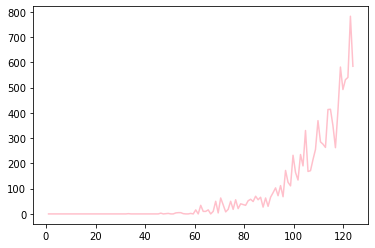

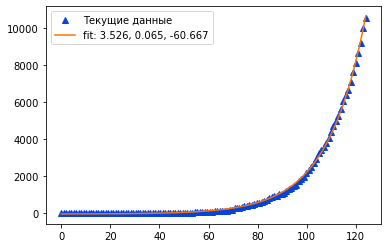

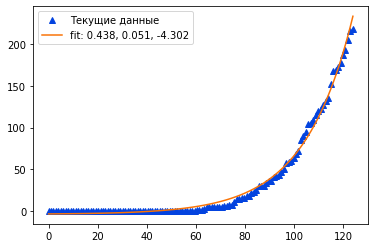

Albania


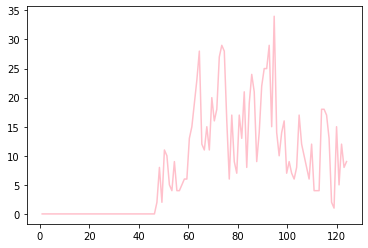

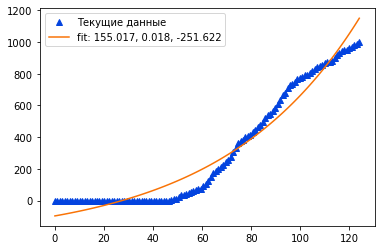

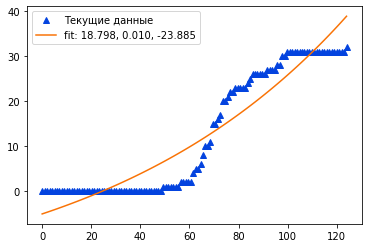

Algeria


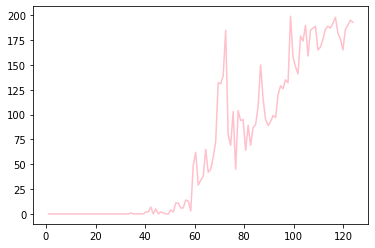

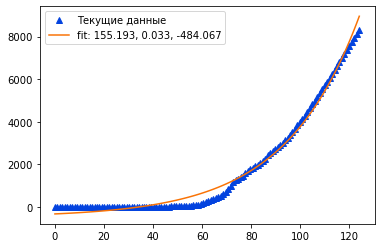

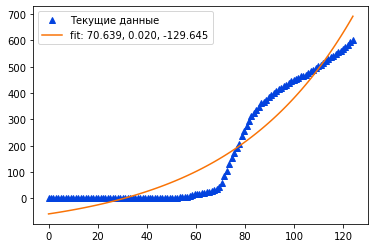

Andorra


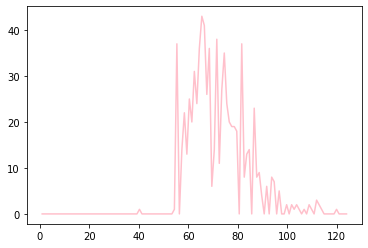

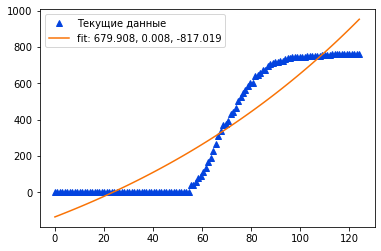

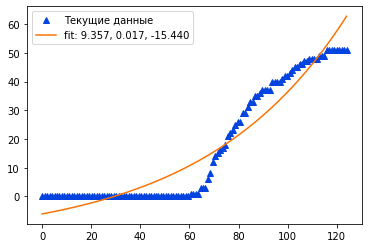

Angola


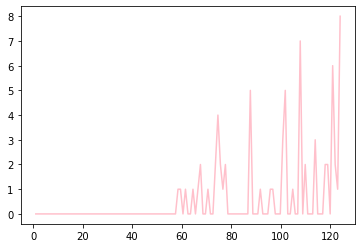

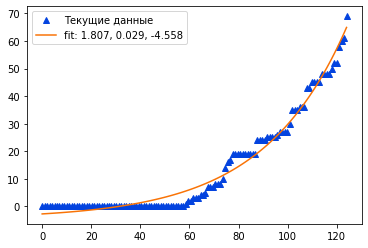

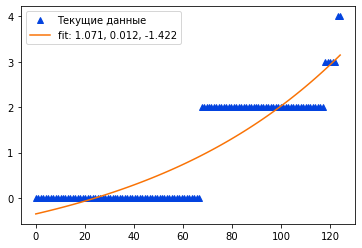

Antigua and Barbuda


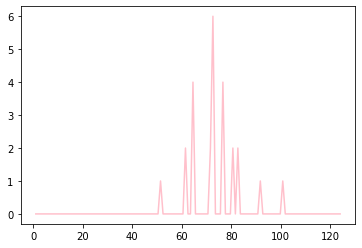

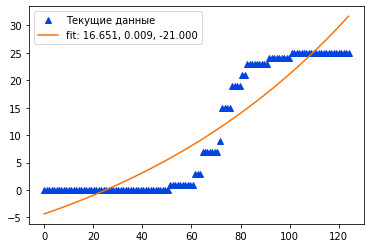

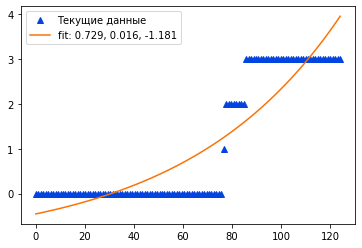

Argentina


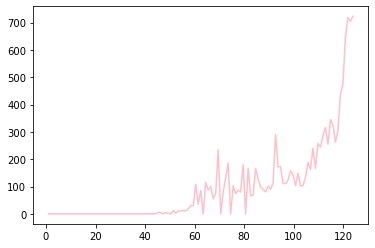

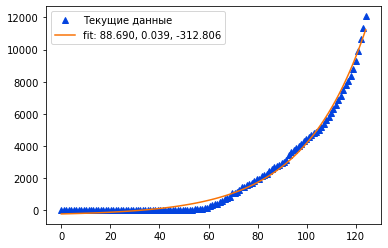

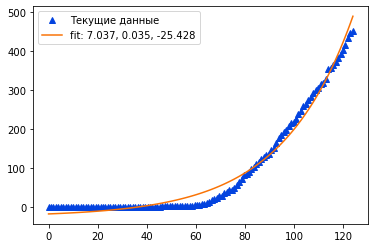

Armenia


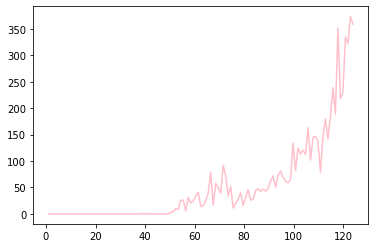

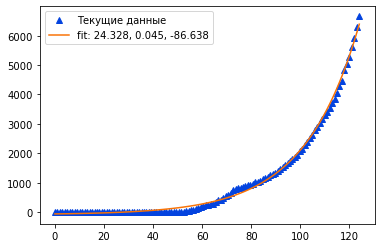

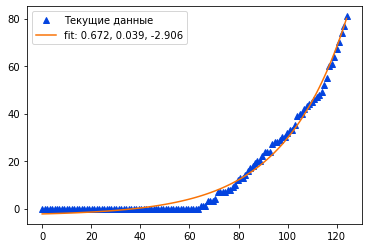

Australia


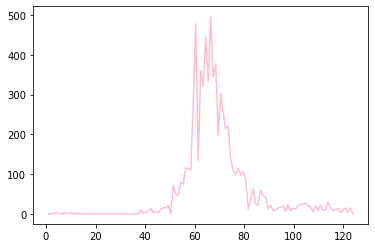

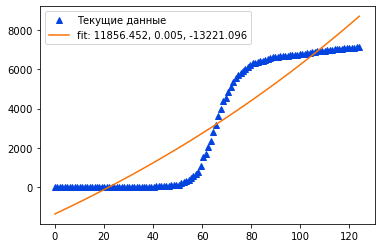

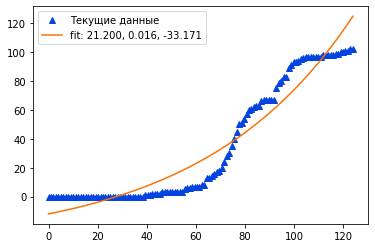

Austria


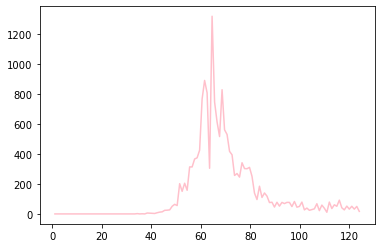

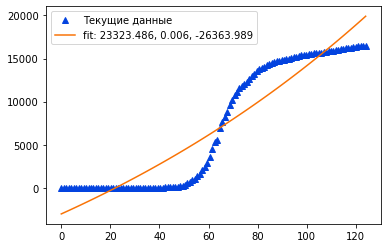

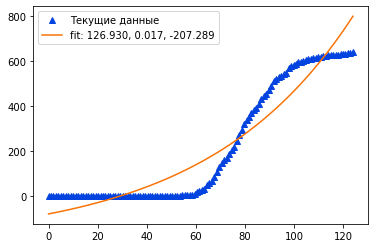

Azerbaijan


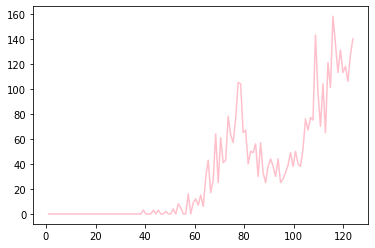

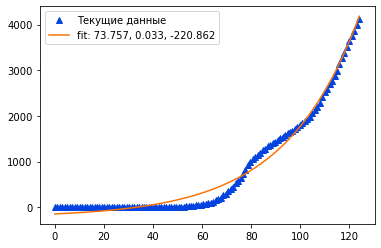

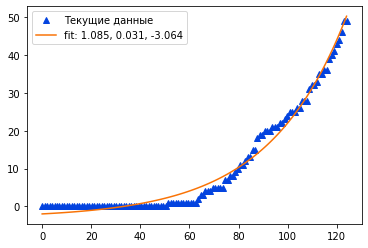

Bahamas


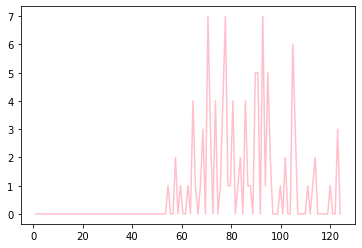

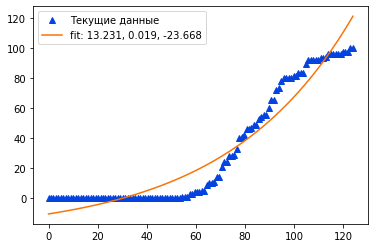

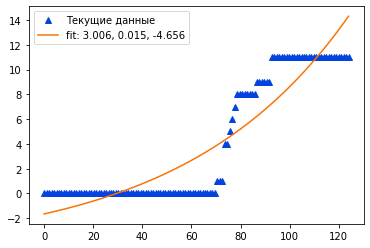

Bahrain


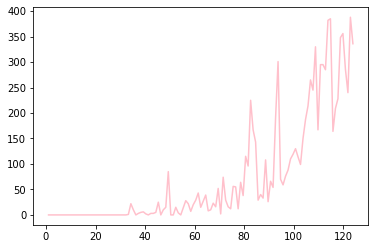

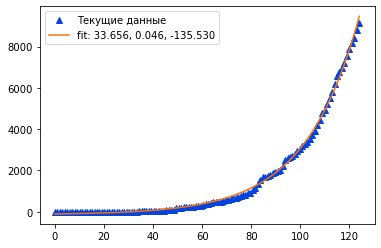

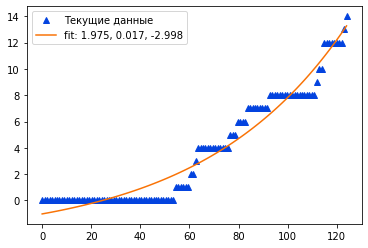

Bangladesh


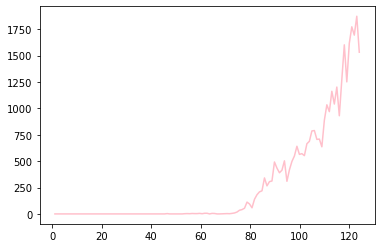

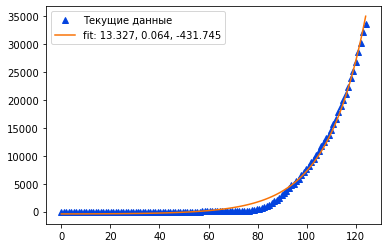

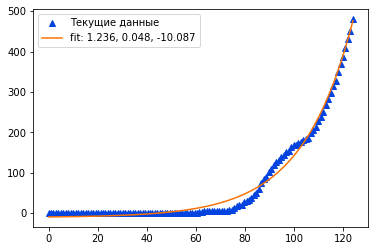

Barbados


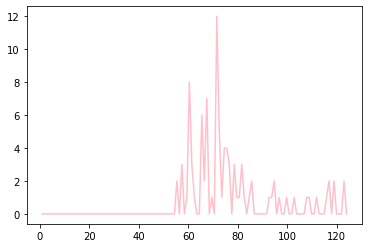

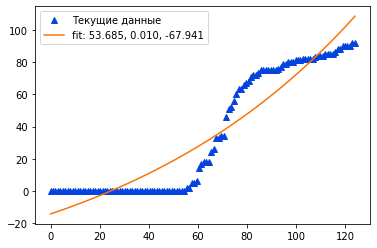

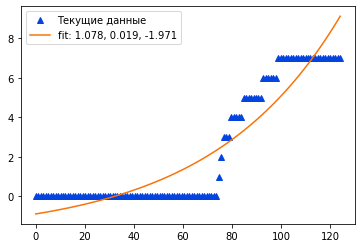

Belarus


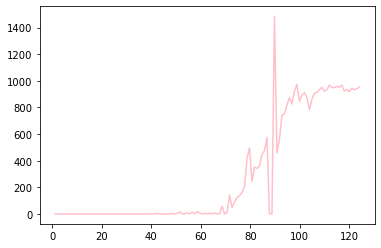

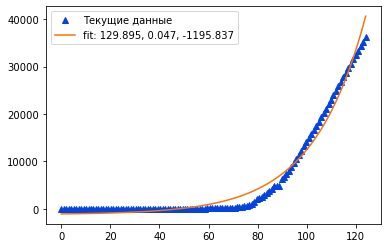

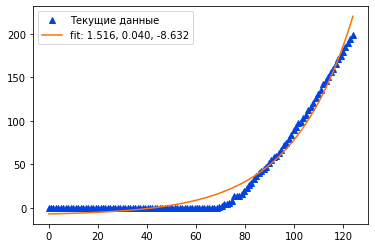

Belgium


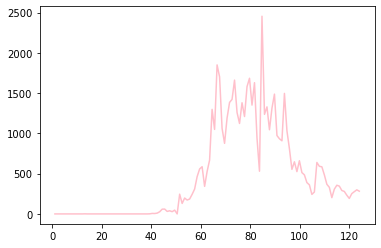

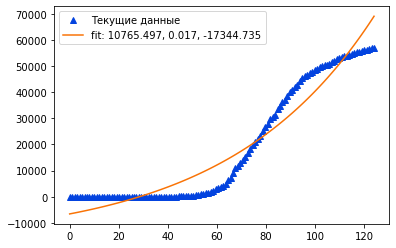

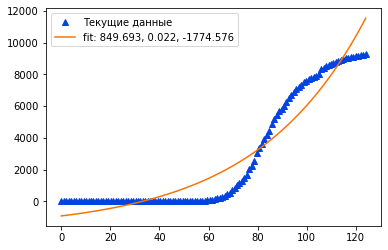

Benin


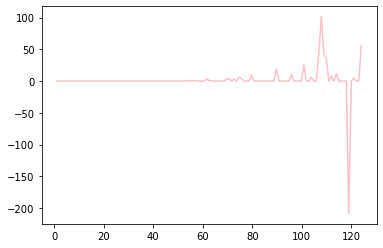

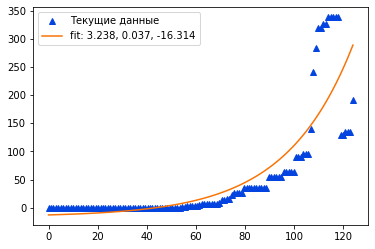

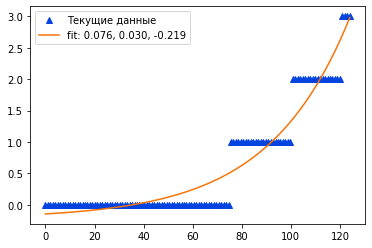

Bhutan


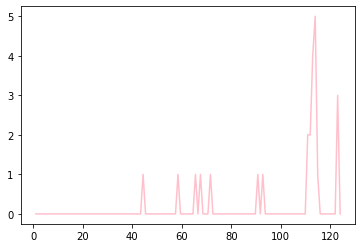

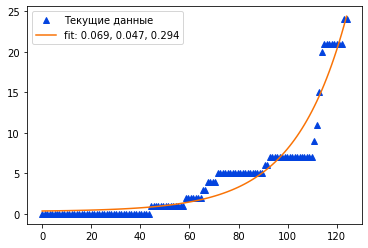

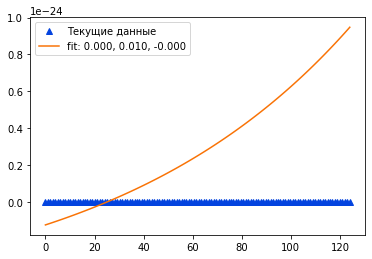

Bolivia


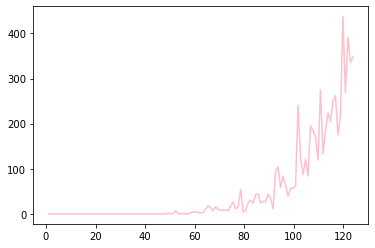

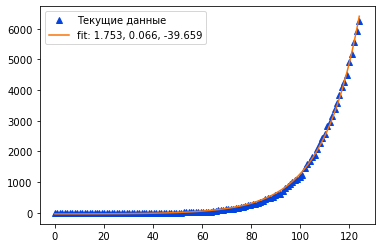

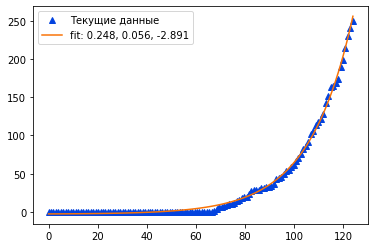

Bosnia and Herzegovina


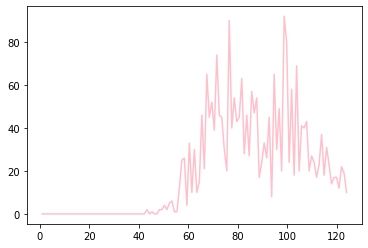

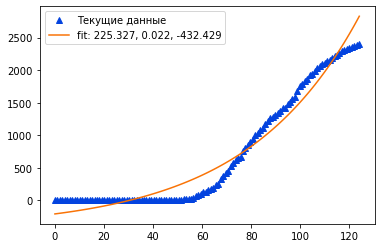

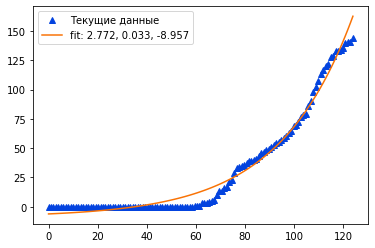

Brazil


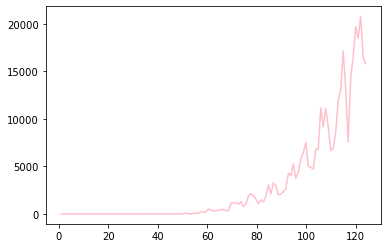

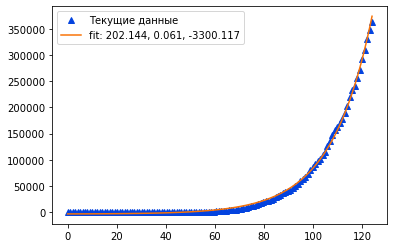

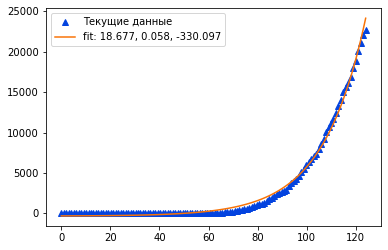

Brunei


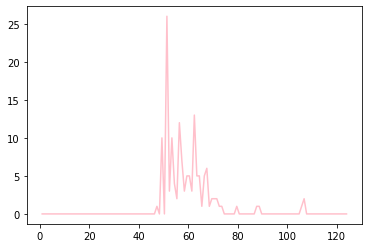

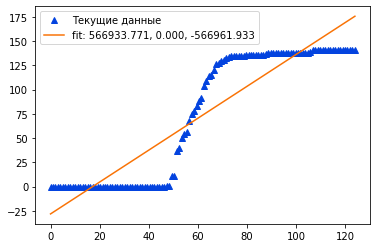

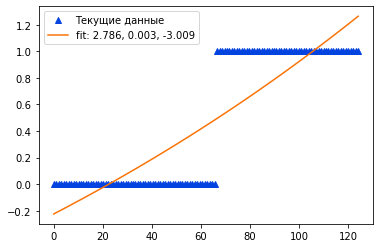

Bulgaria


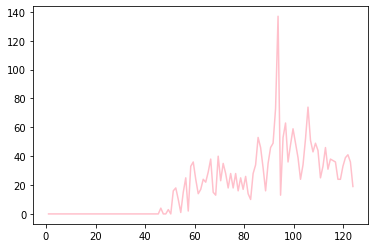

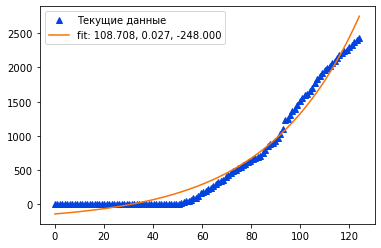

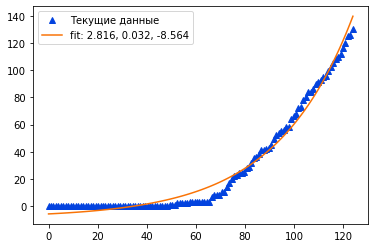

Burkina Faso


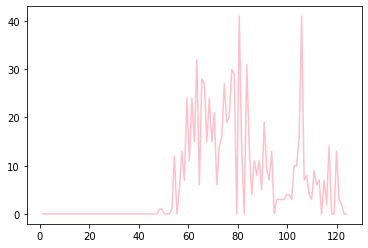

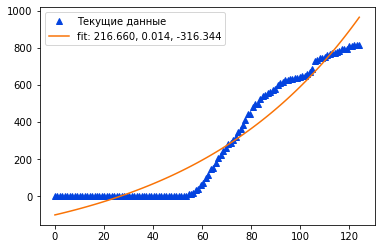

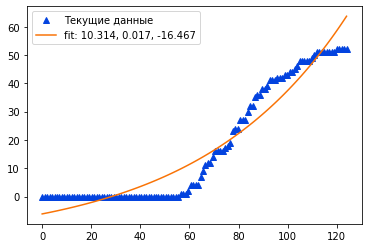

Cabo Verde


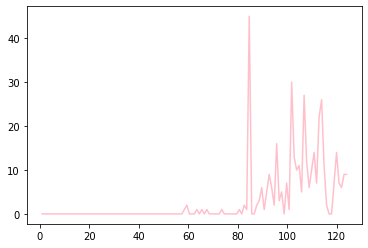

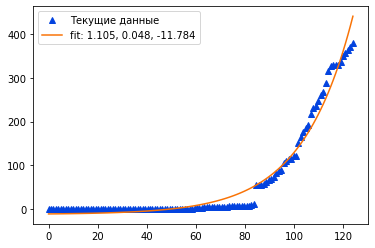

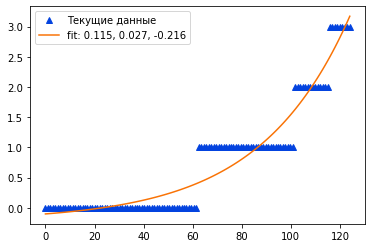

Cambodia


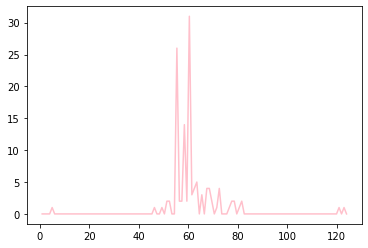

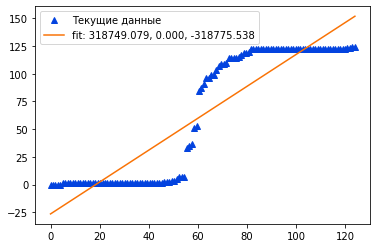

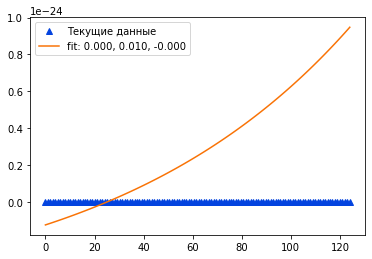

Cameroon


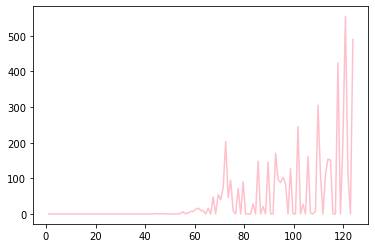

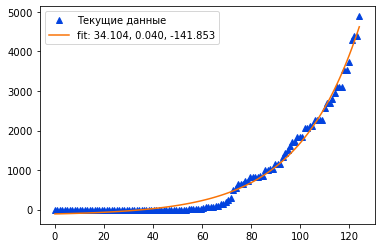

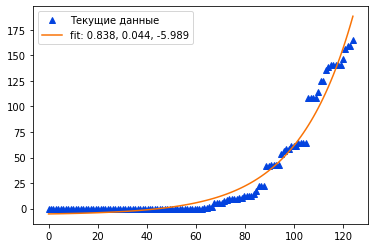

Canada


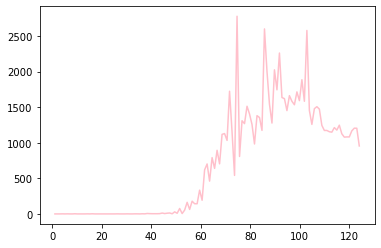

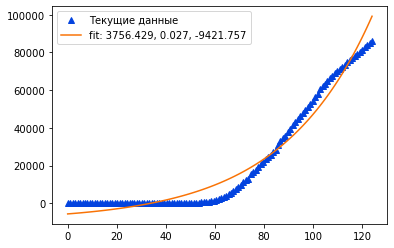

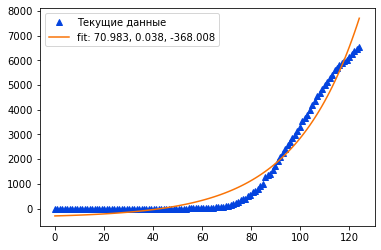

Central African Republic


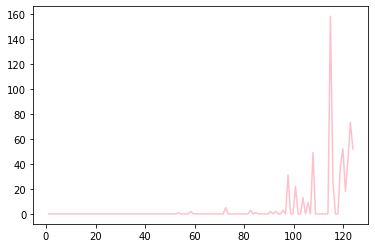

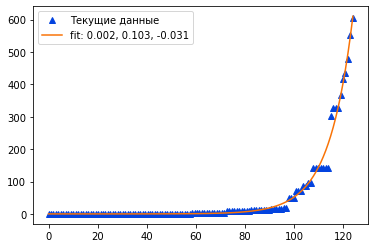

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


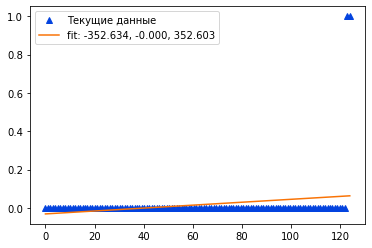

Chad


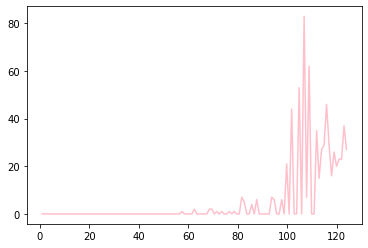

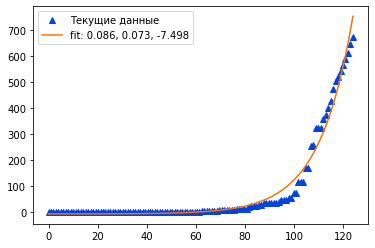

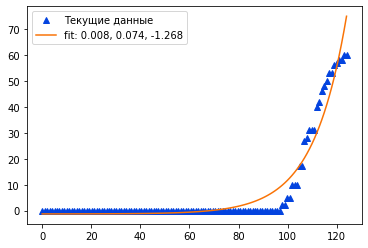

Chile


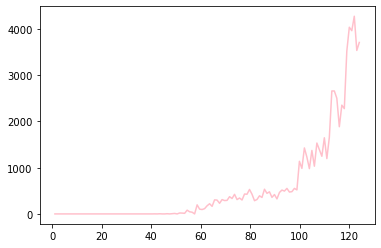

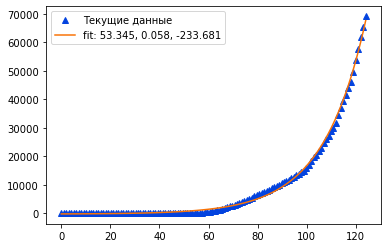

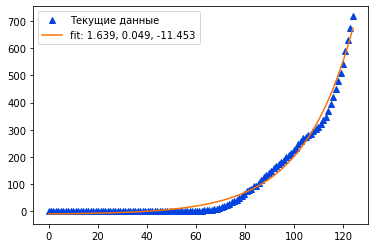

China


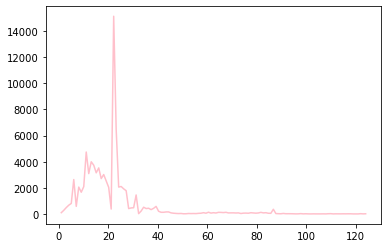

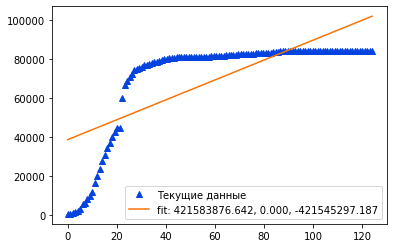

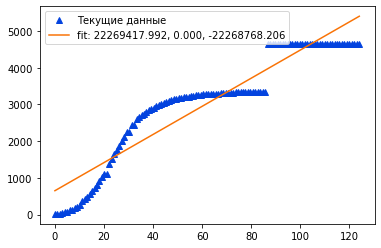

Colombia


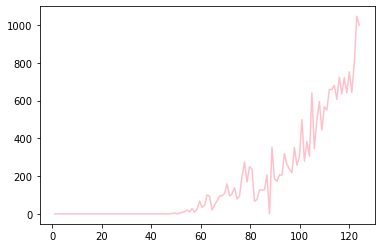

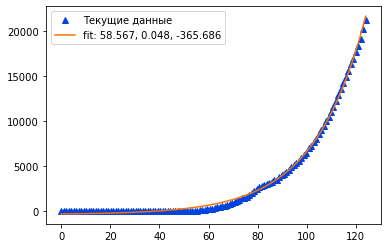

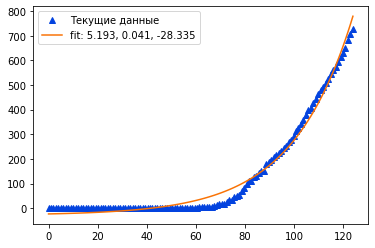

Congo (Brazzaville)


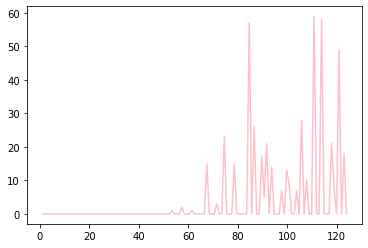

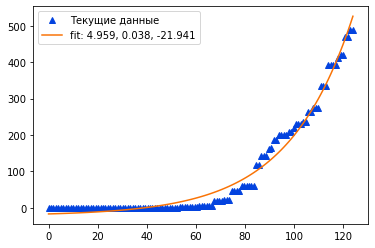

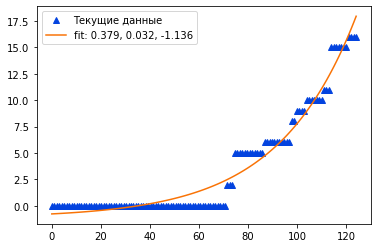

Congo (Kinshasa)


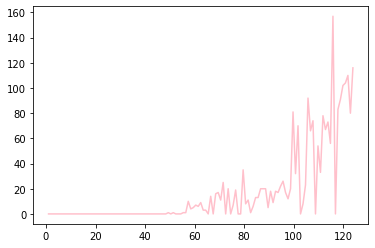

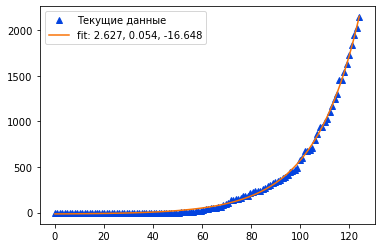

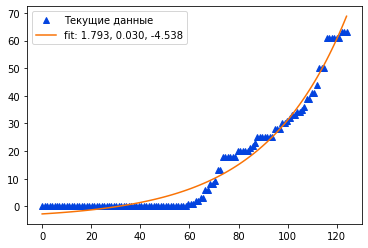

Costa Rica


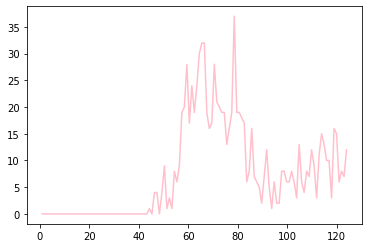

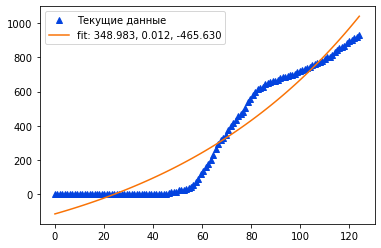

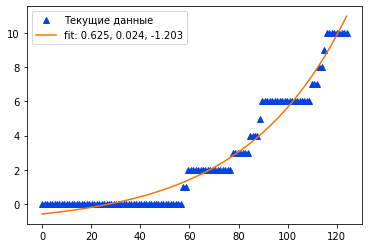

Cote d'Ivoire


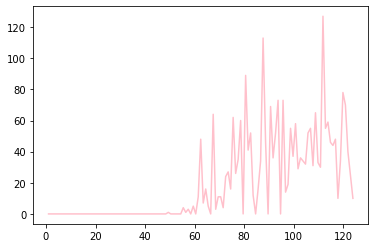

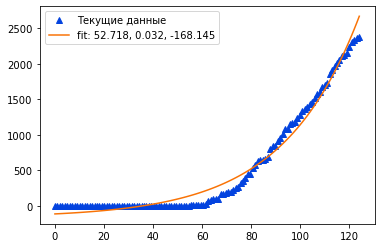

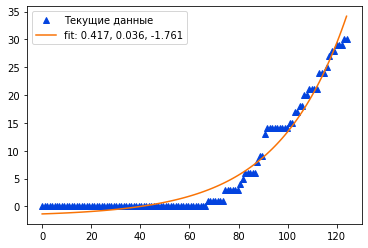

Croatia


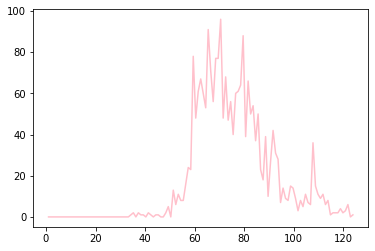

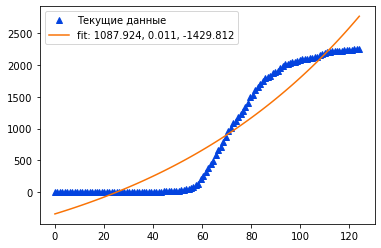

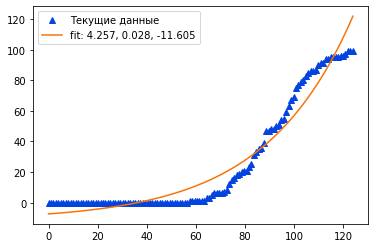

Diamond Princess


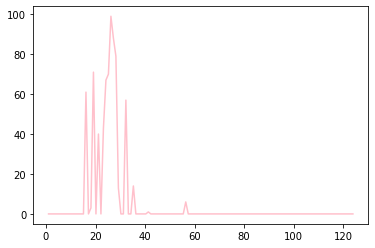

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


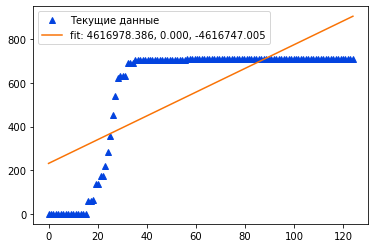

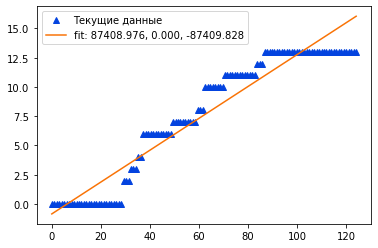

Cuba


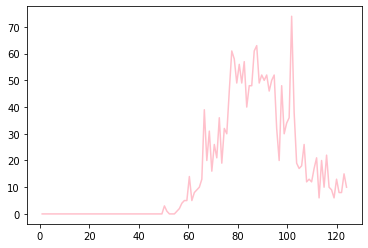

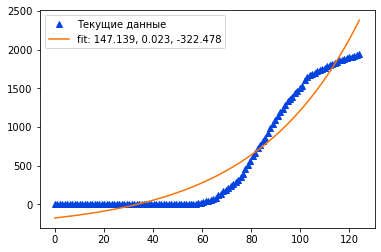

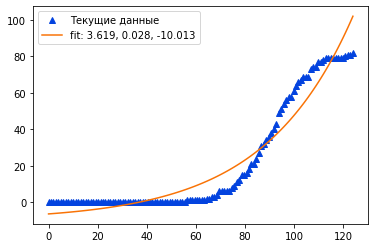

Cyprus


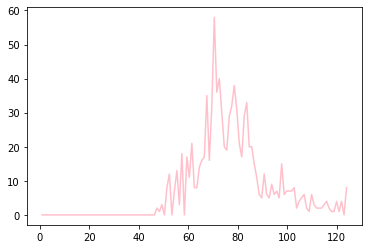

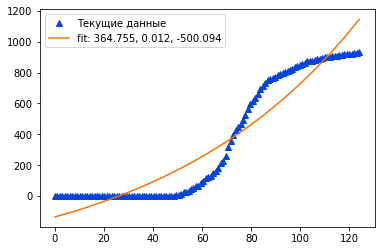

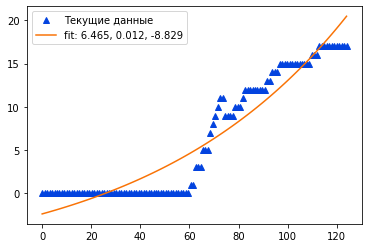

Czechia


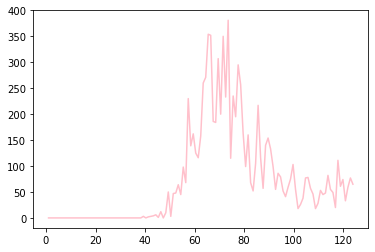

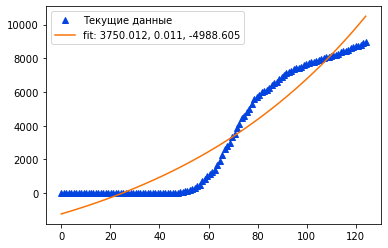

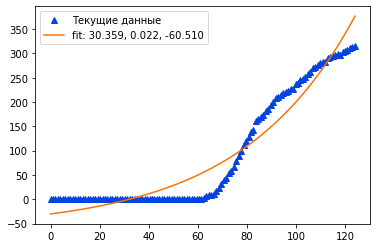

Denmark


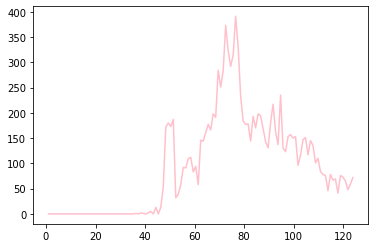

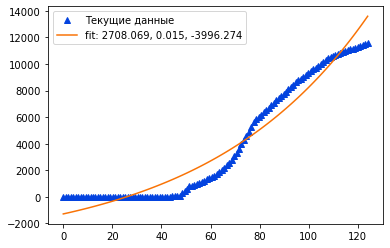

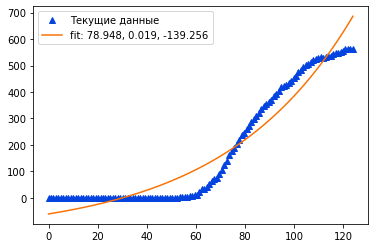

Djibouti


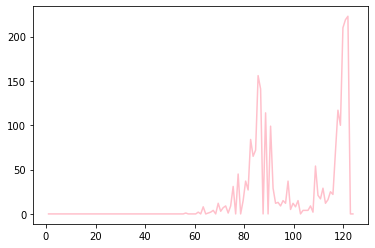

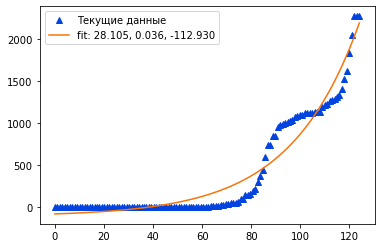

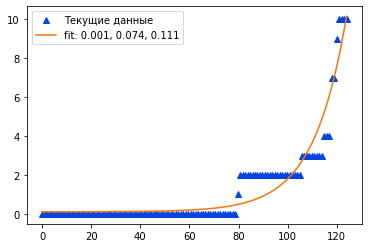

Dominican Republic


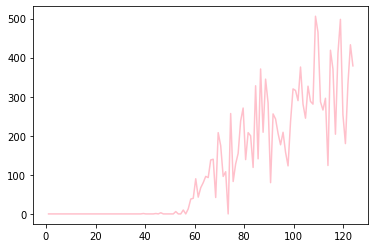

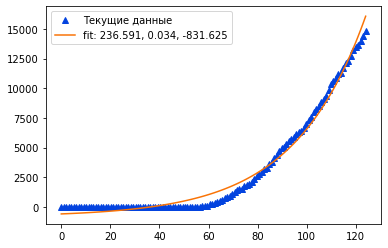

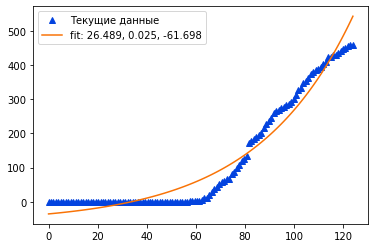

Ecuador


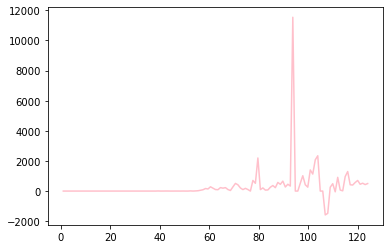

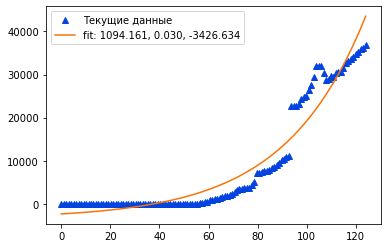

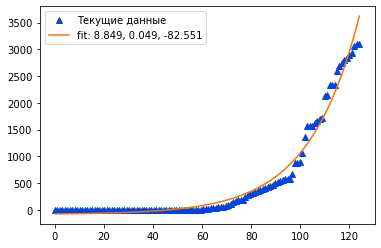

Egypt


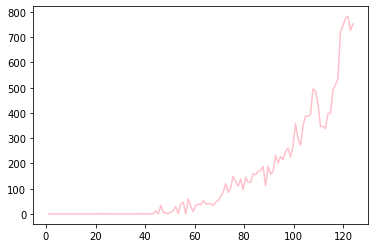

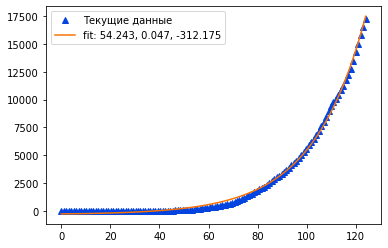

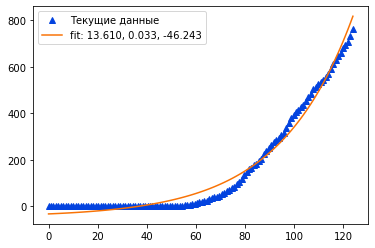

El Salvador


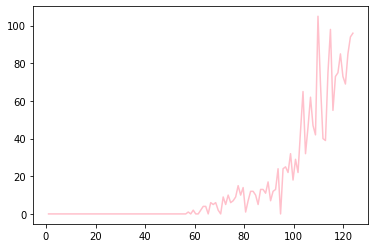

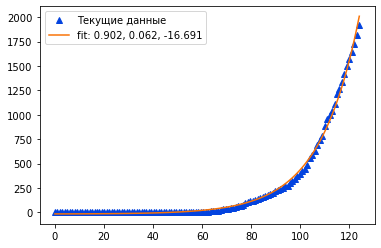

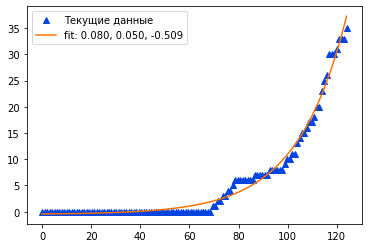

Equatorial Guinea


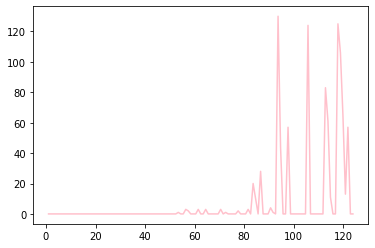

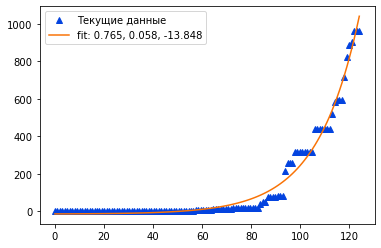

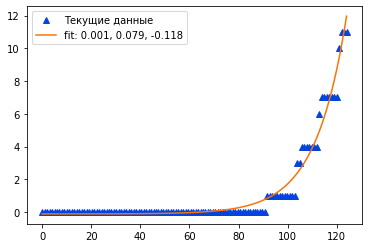

Eritrea


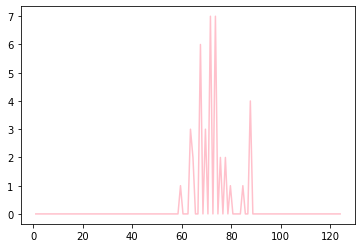

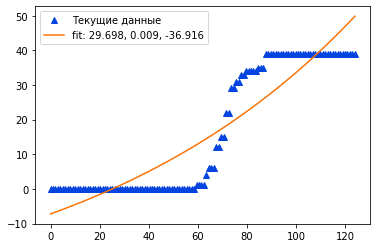

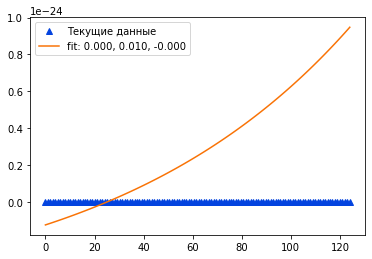

Estonia


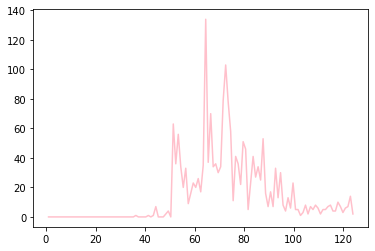

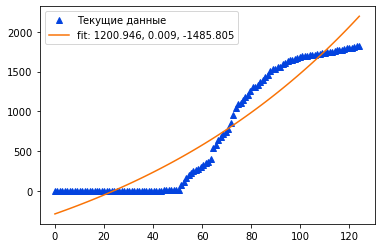

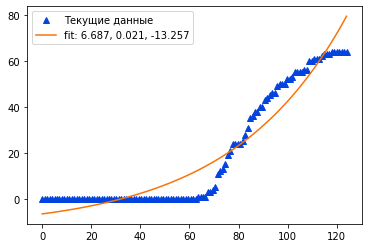

Eswatini


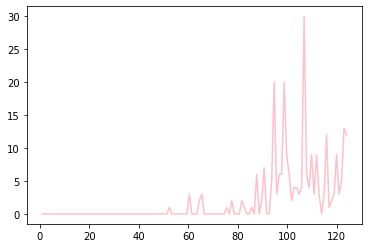

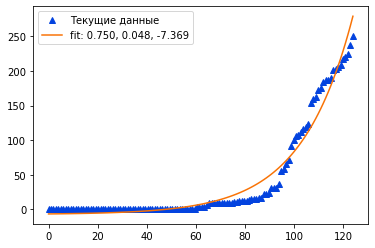

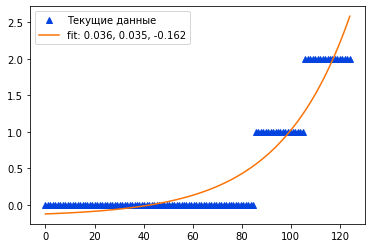

Ethiopia


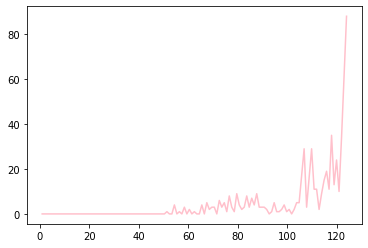

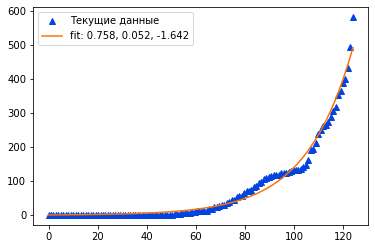

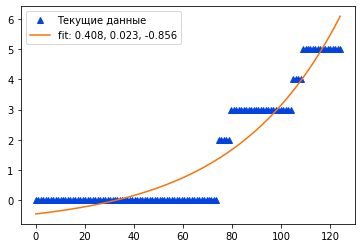

Fiji


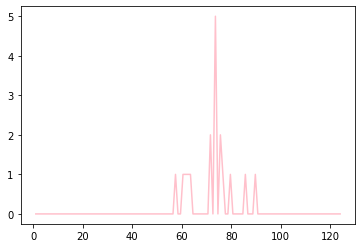

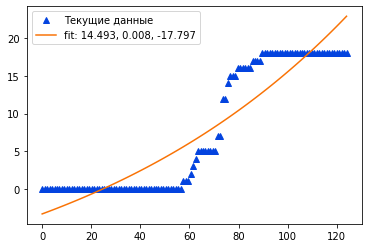

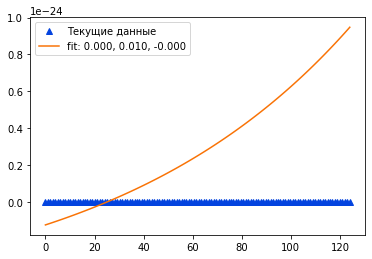

Finland


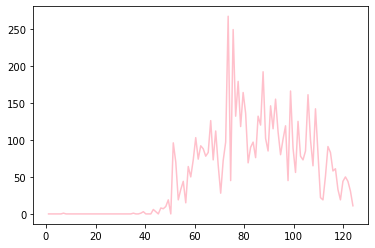

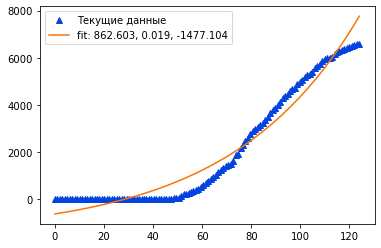

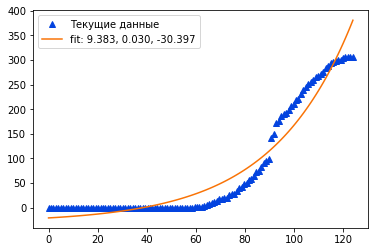

France


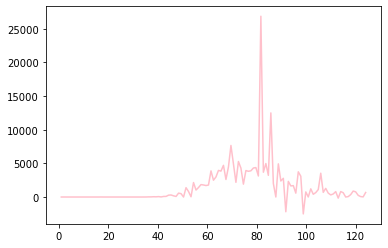

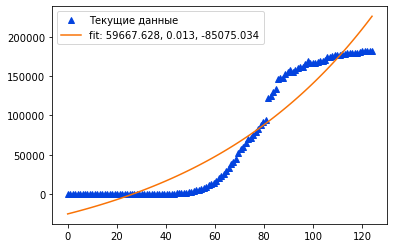

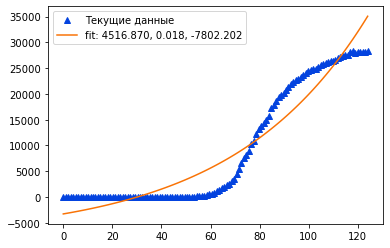

Gabon


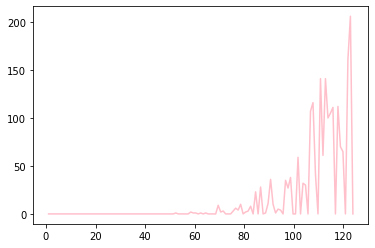

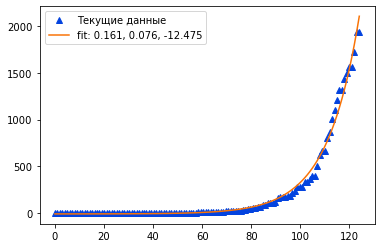

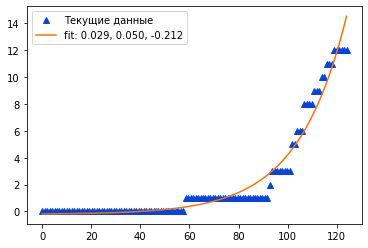

Gambia


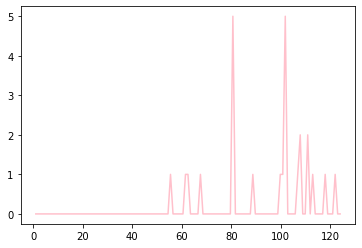

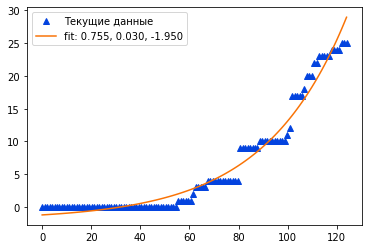

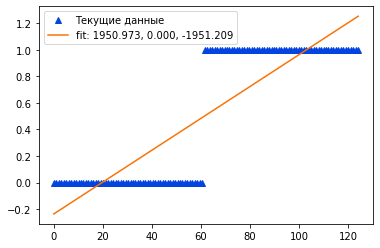

Georgia


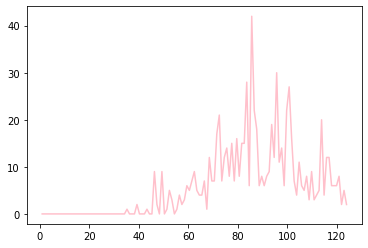

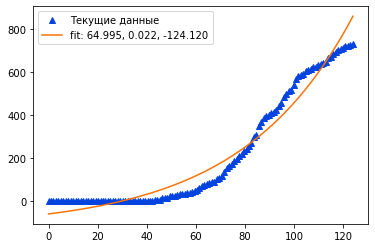

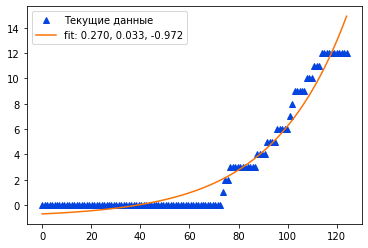

Germany


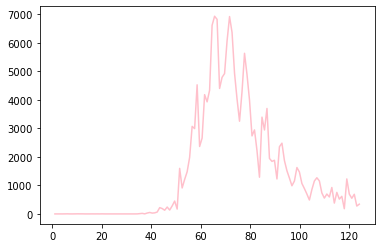

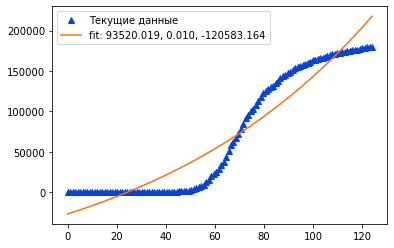

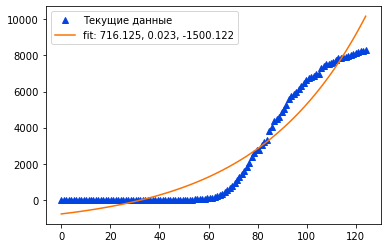

Ghana


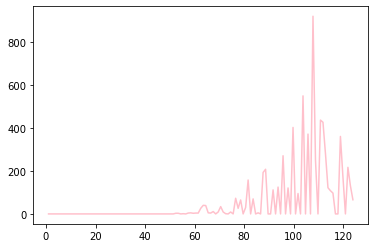

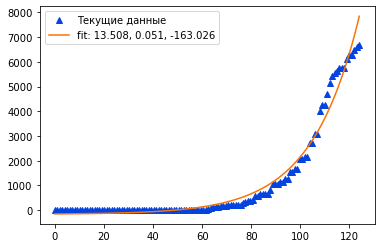

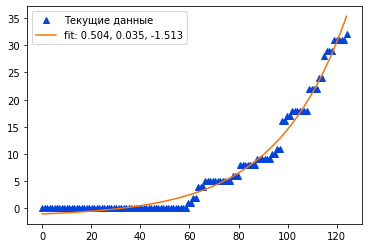

Greece


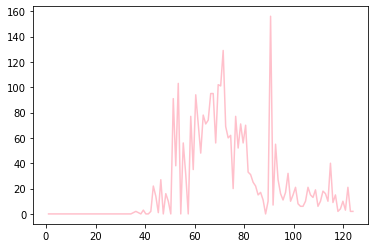

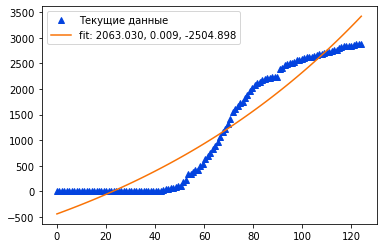

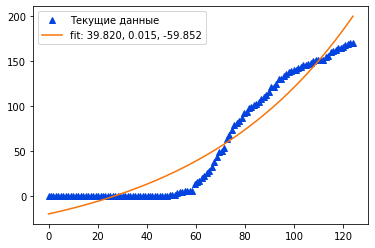

Guatemala


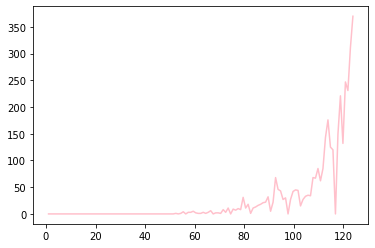

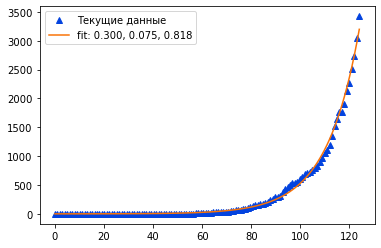

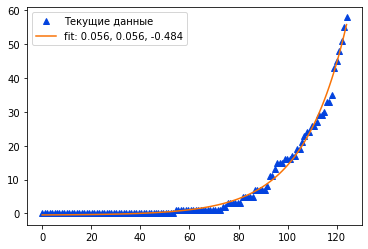

Guinea


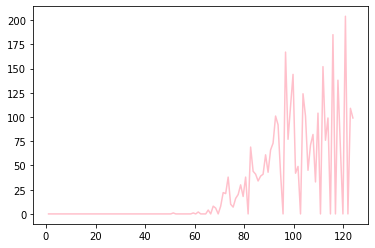

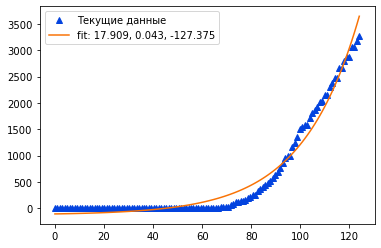

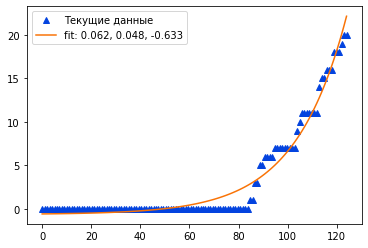

Guyana


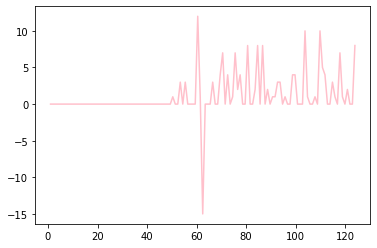

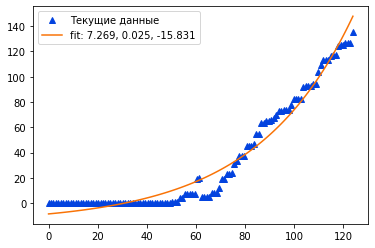

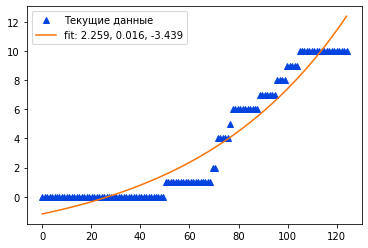

Haiti


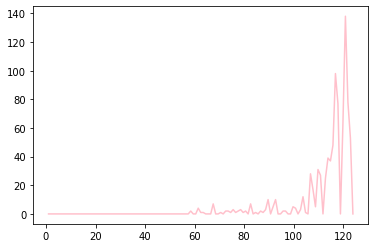

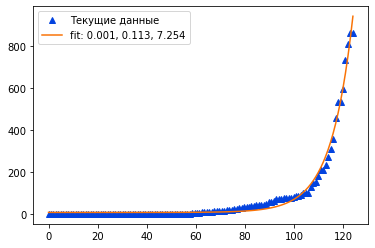

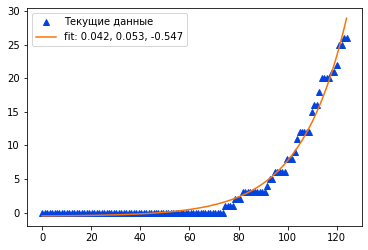

Holy See


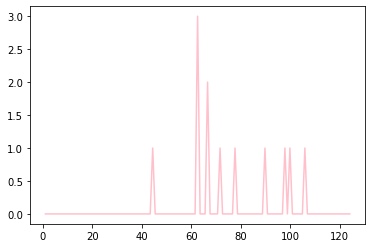

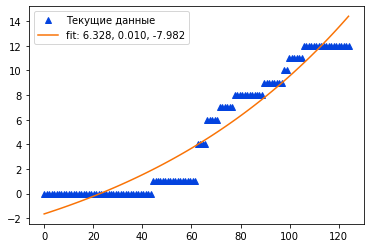

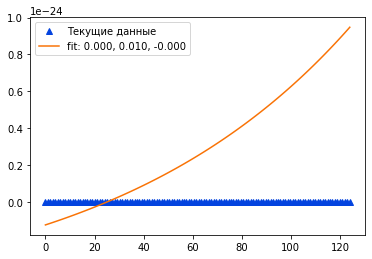

Honduras


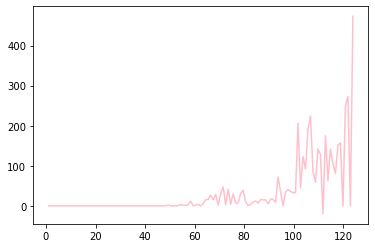

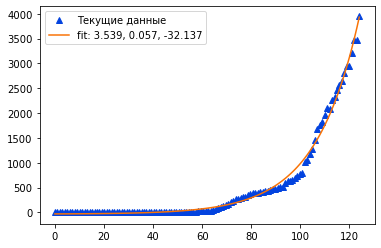

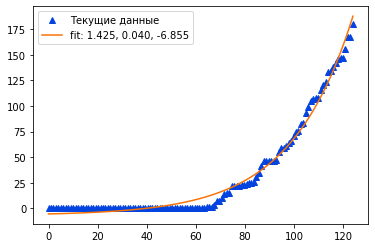

Hungary


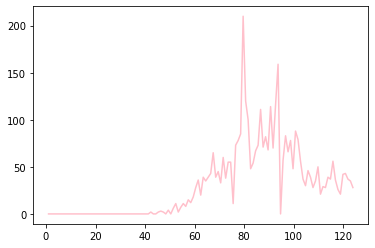

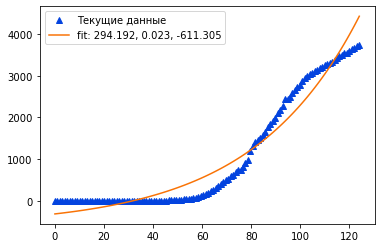

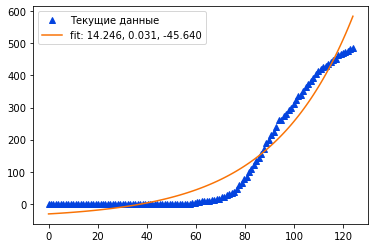

Iceland


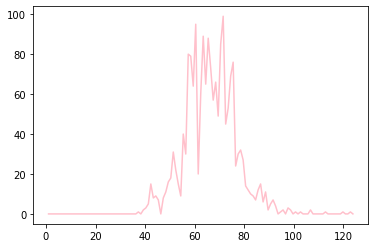

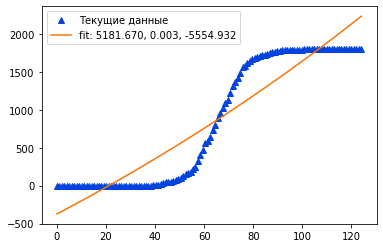

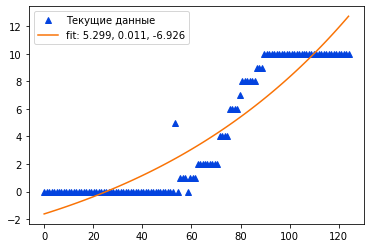

India


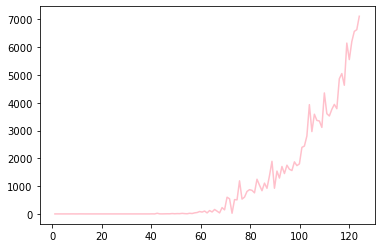

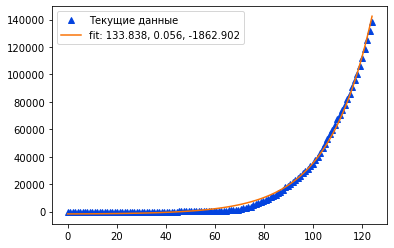

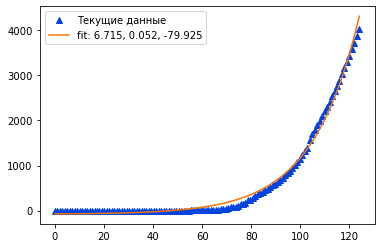

Indonesia


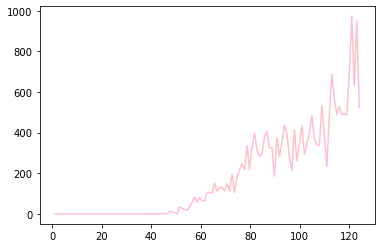

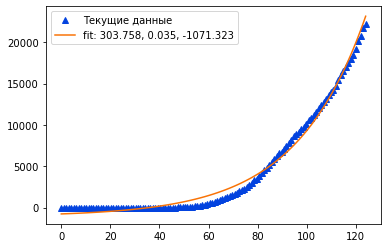

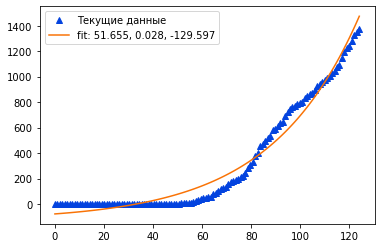

Iran


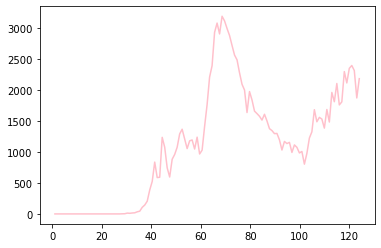

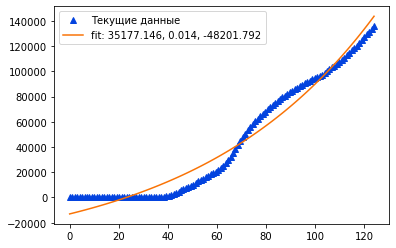

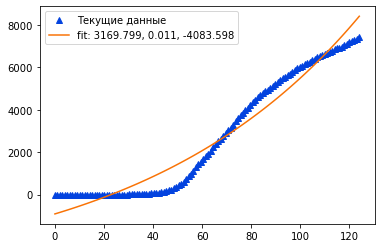

Iraq


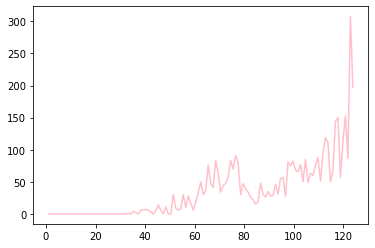

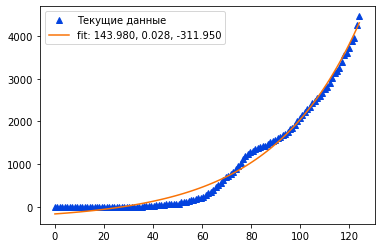

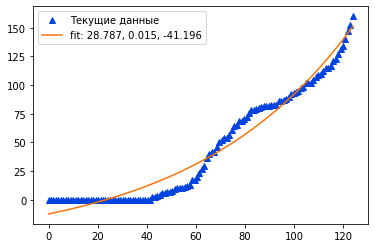

Ireland


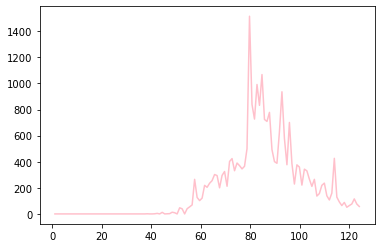

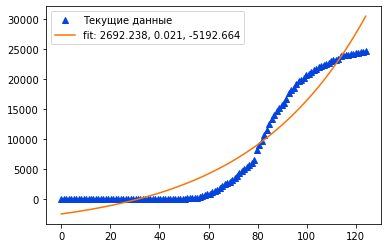

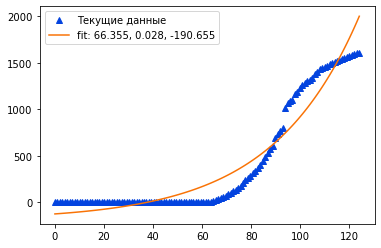

Israel


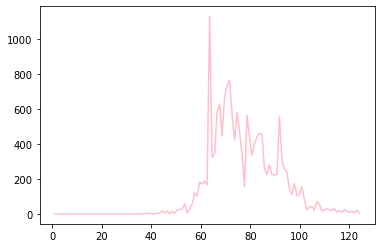

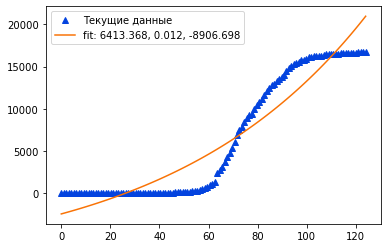

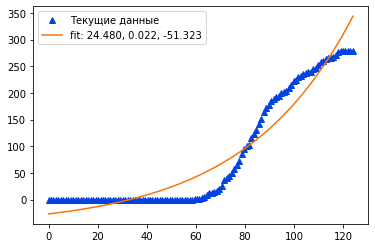

Italy


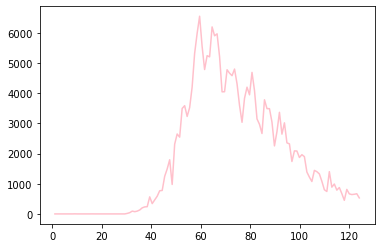

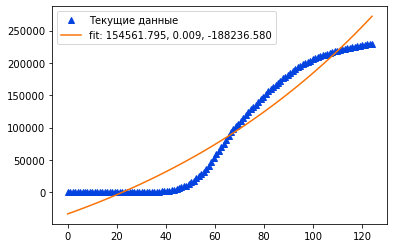

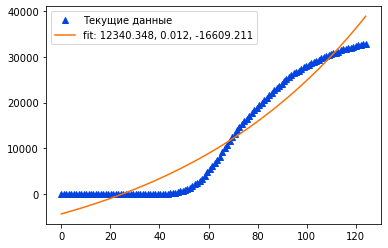

Jamaica


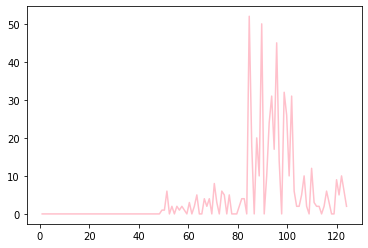

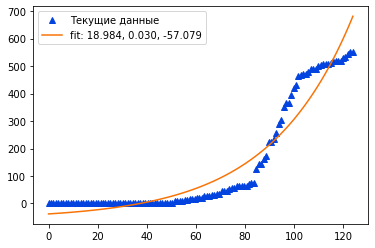

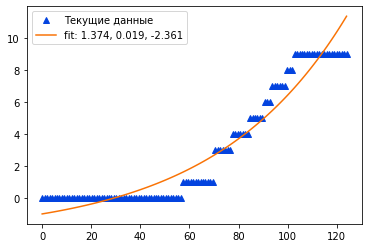

Japan


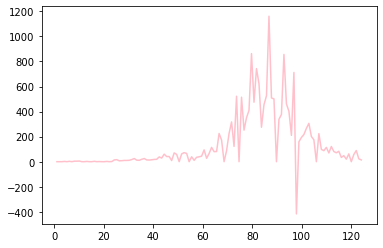

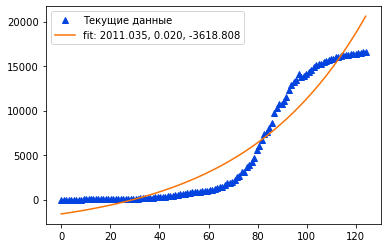

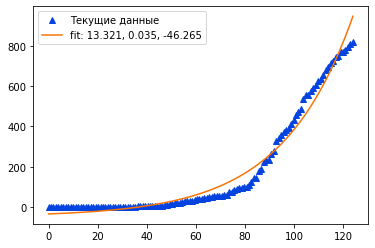

Jordan


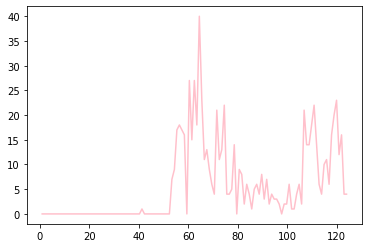

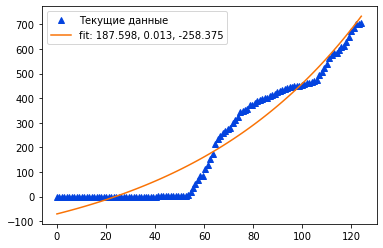

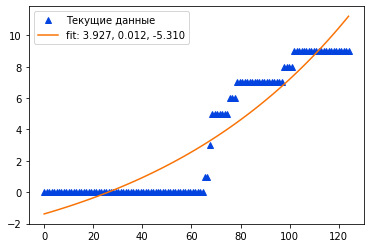

Kazakhstan


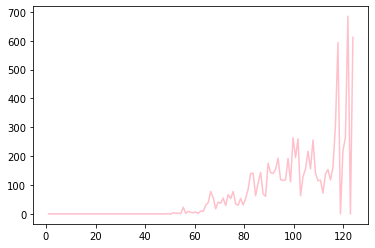

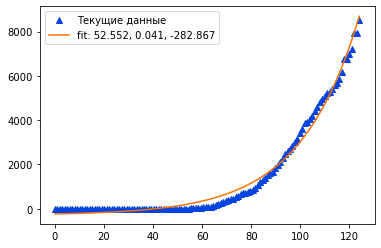

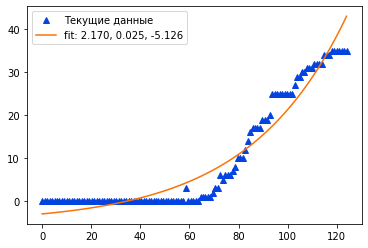

Kenya


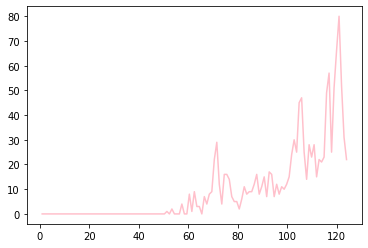

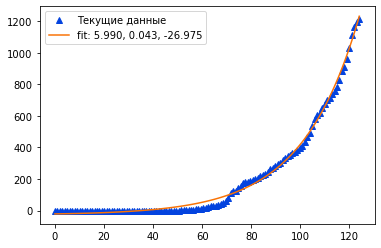

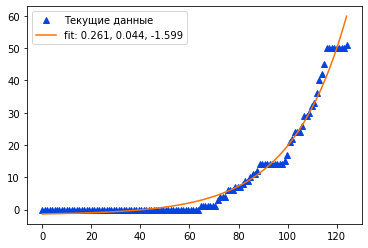

Korea, South


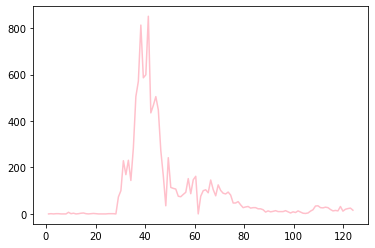

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


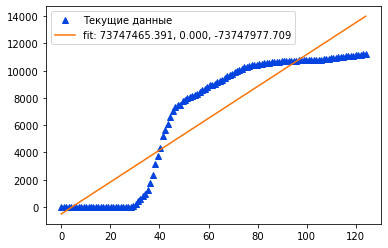

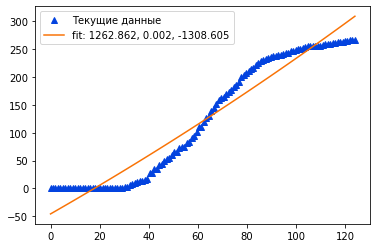

Kuwait


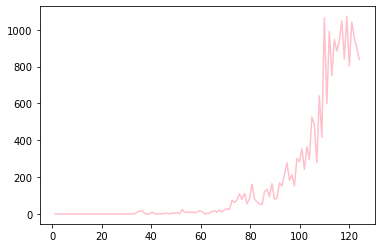

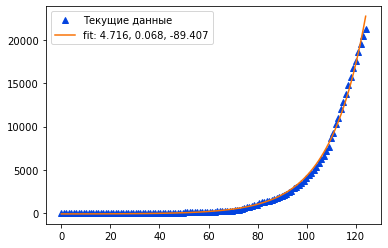

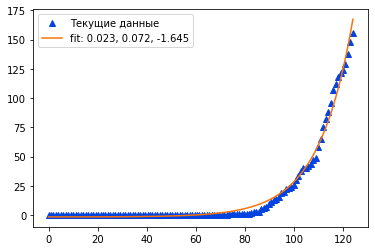

Kyrgyzstan


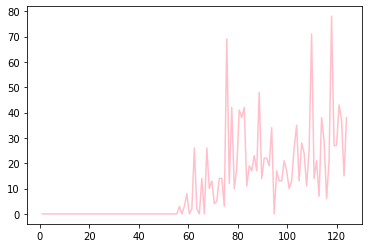

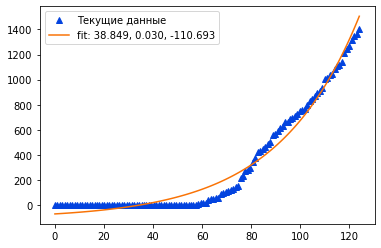

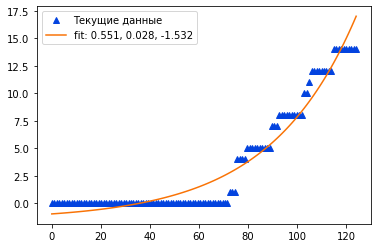

Latvia


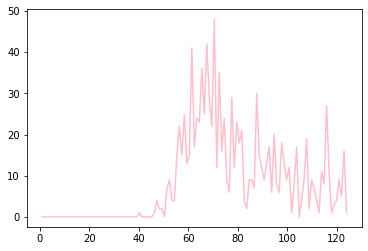

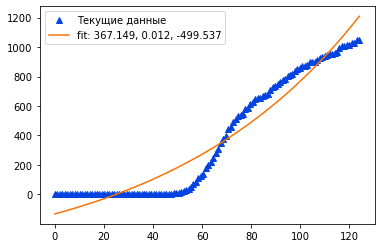

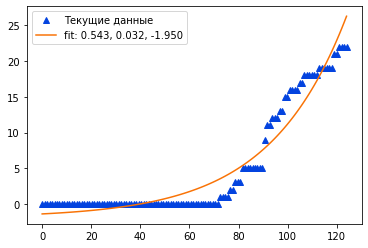

Lebanon


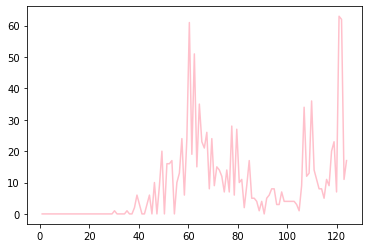

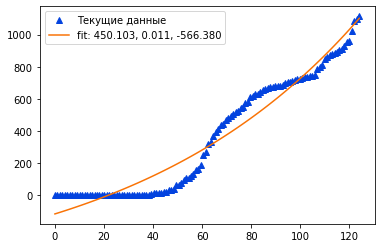

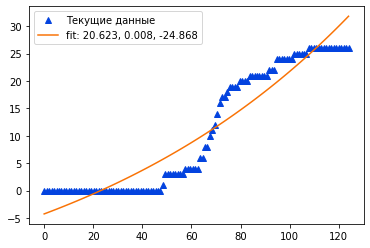

Liberia


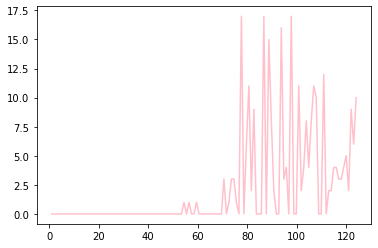

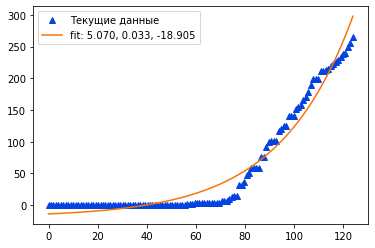

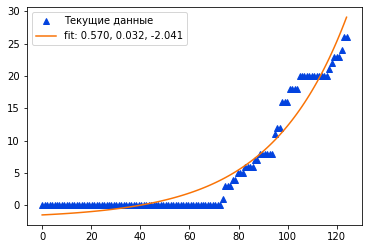

Liechtenstein


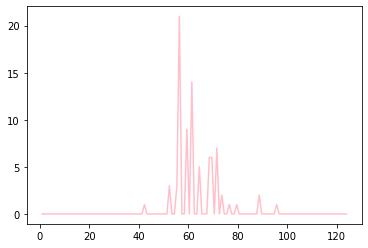

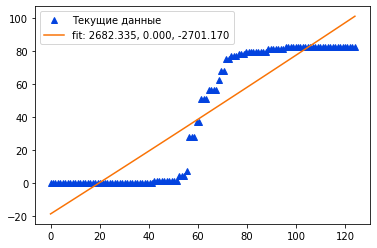

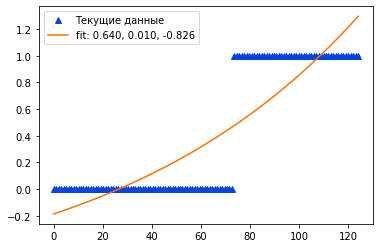

Lithuania


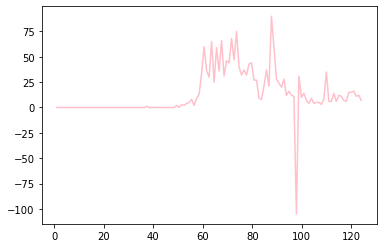

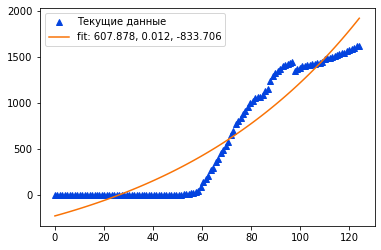

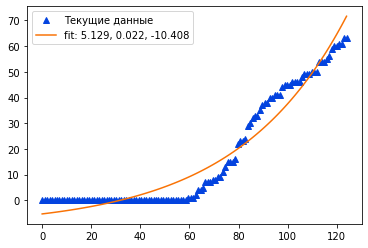

Luxembourg


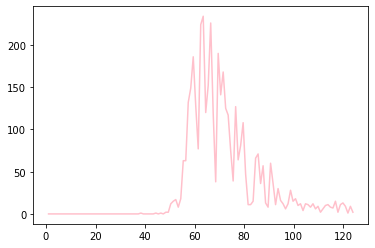

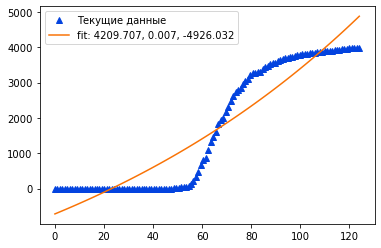

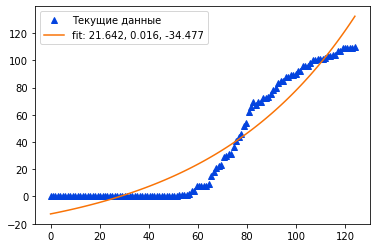

Madagascar


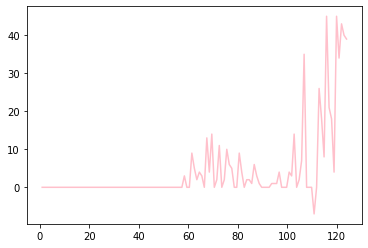

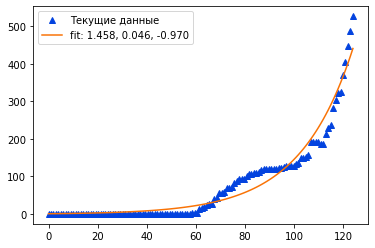

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


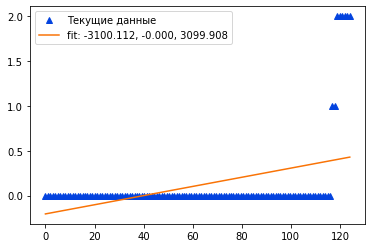

Malaysia


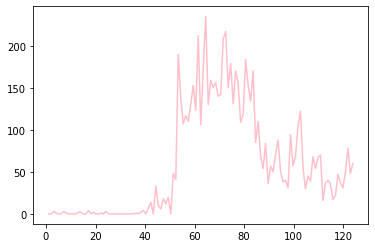

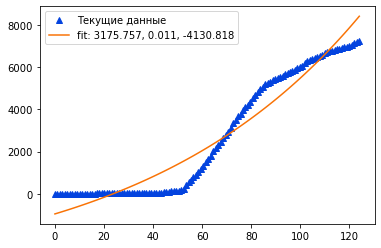

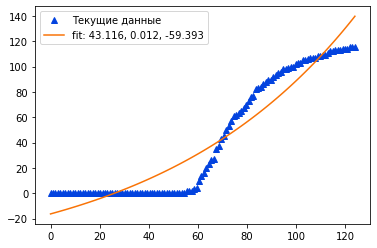

Maldives


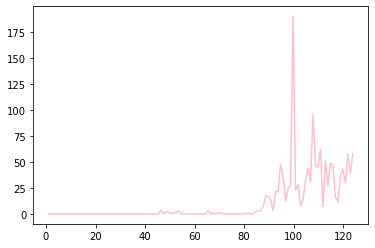

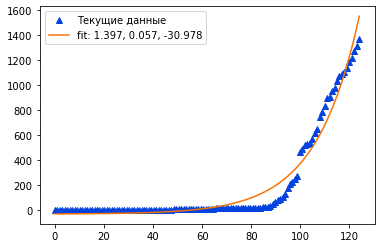

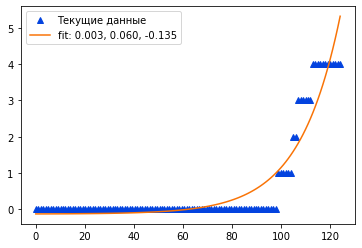

Malta


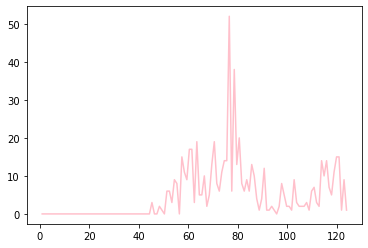

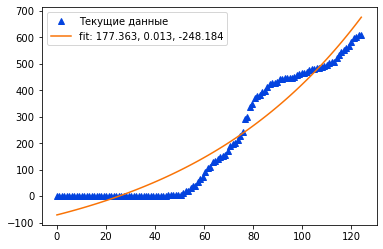

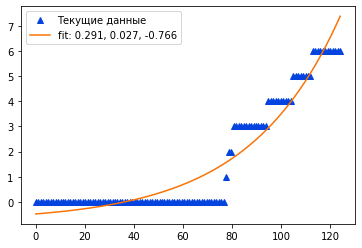

Mauritania


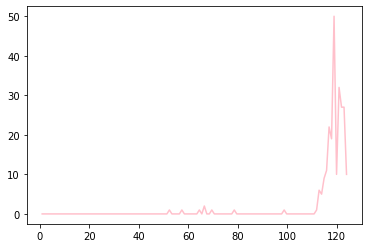

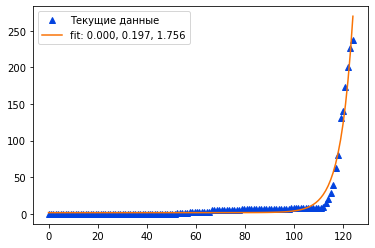

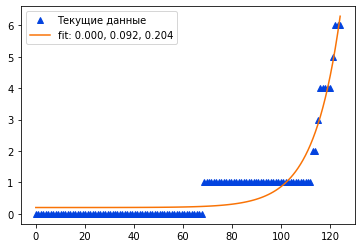

Mauritius


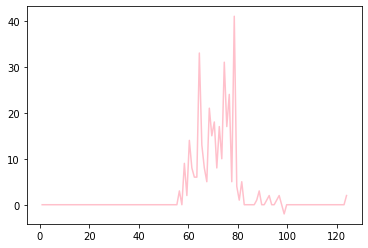

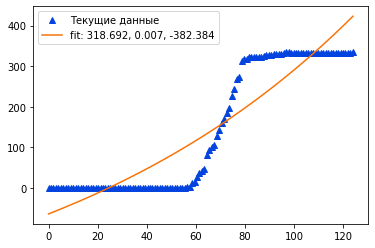

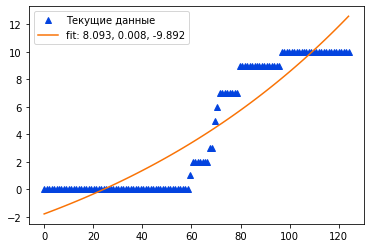

Mexico


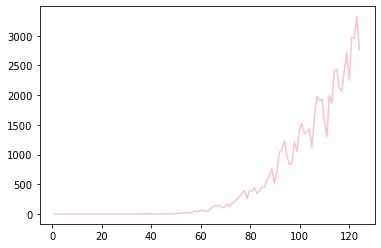

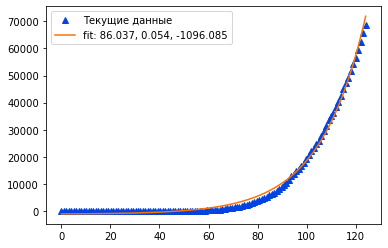

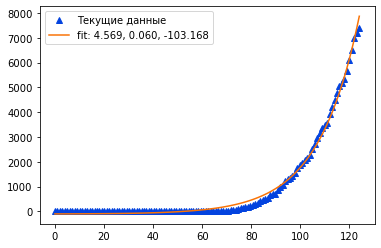

Moldova


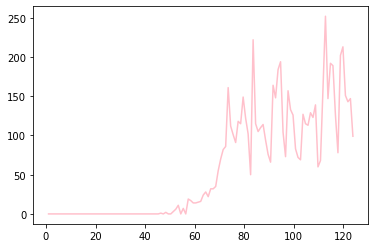

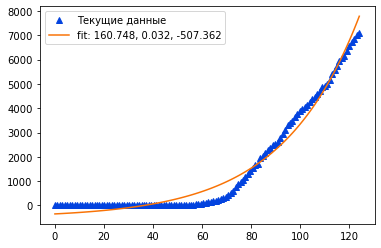

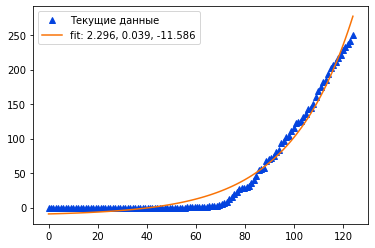

Monaco


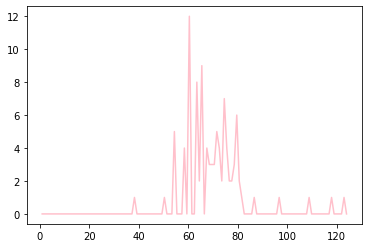

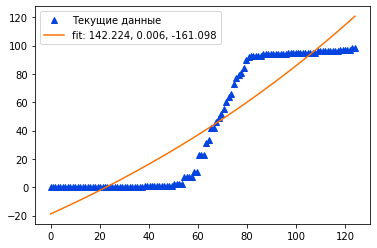

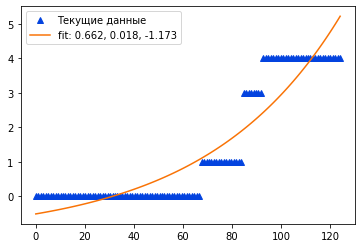

Mongolia


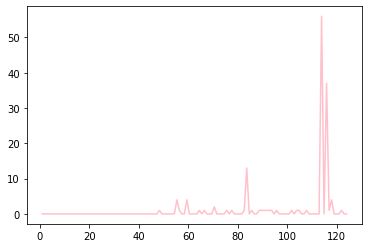

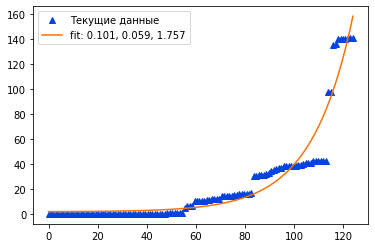

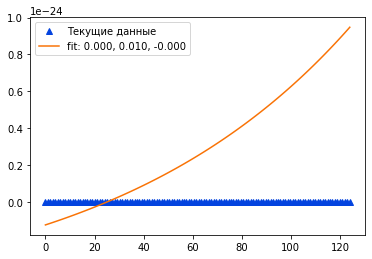

Montenegro


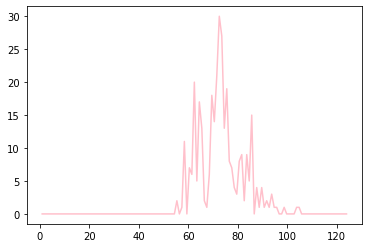

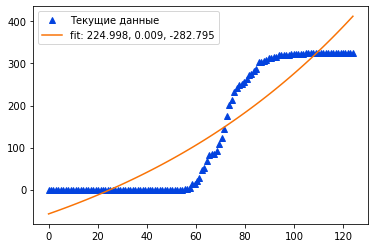

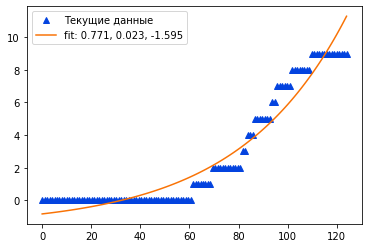

Morocco


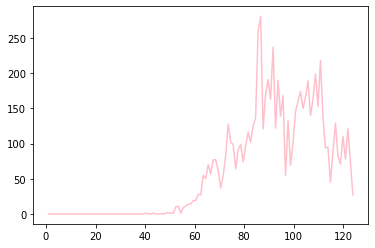

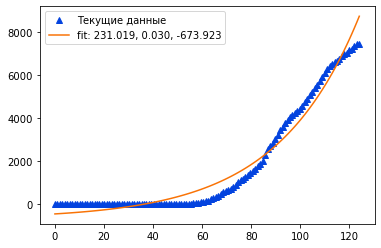

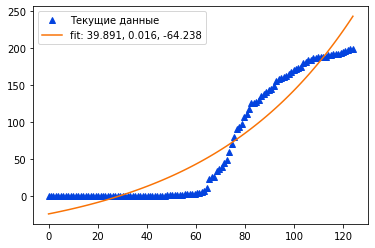

Namibia


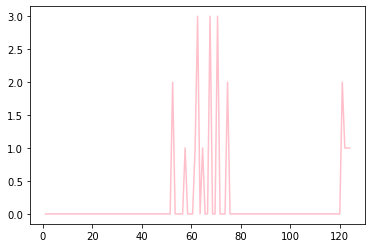

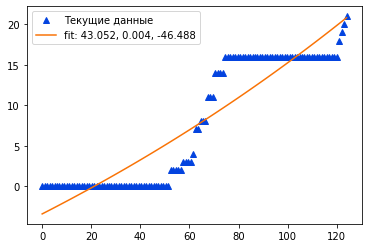

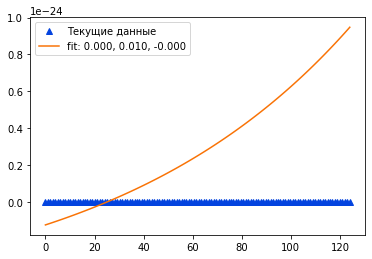

Nepal


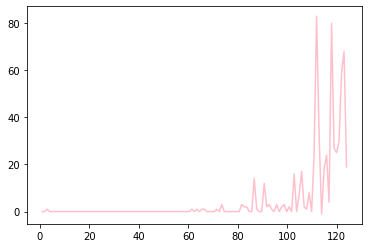

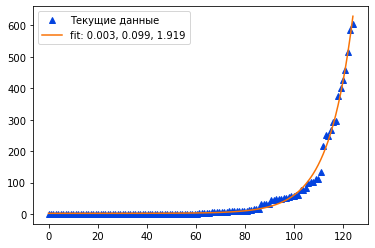

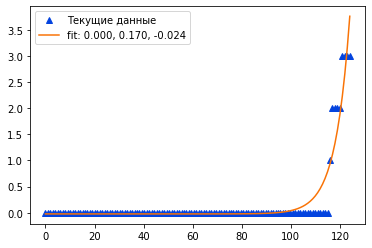

Netherlands


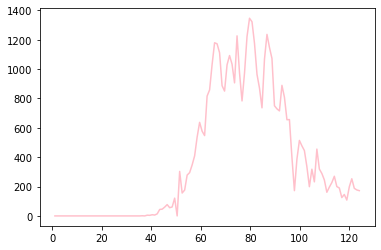

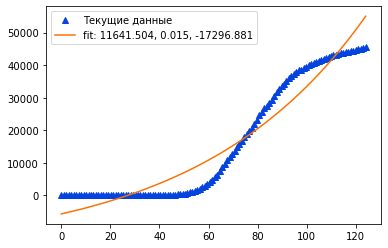

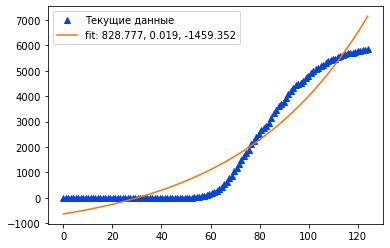

New Zealand


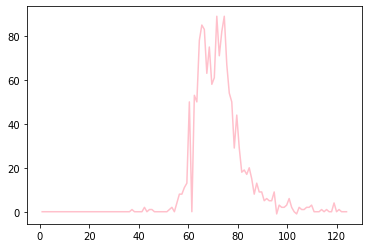

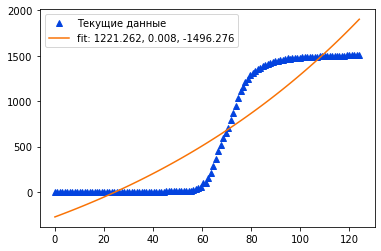

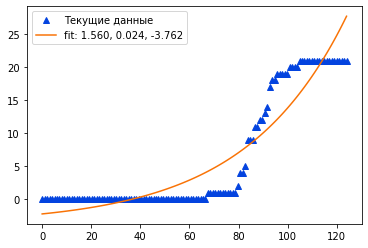

Nicaragua


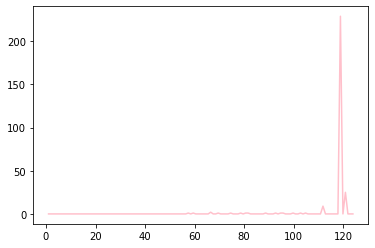

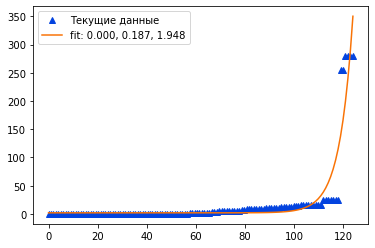

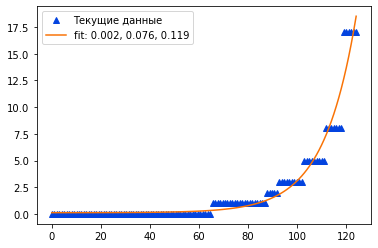

Niger


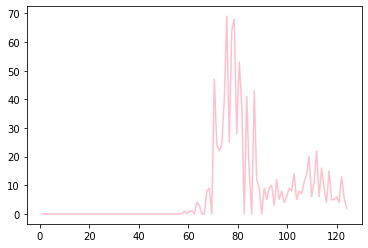

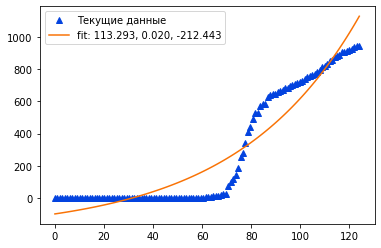

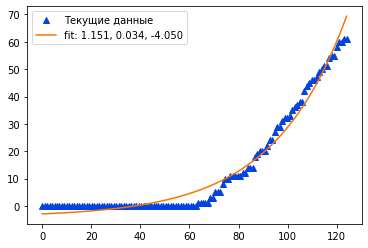

Nigeria


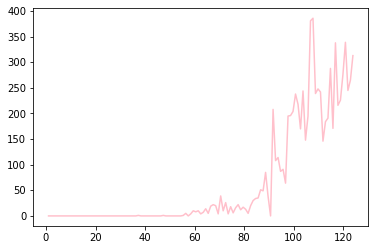

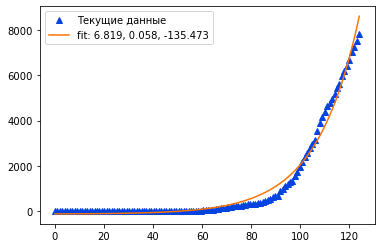

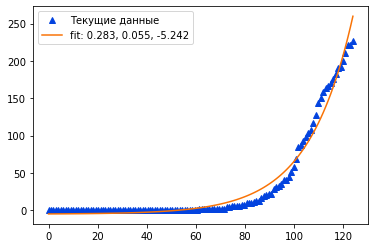

North Macedonia


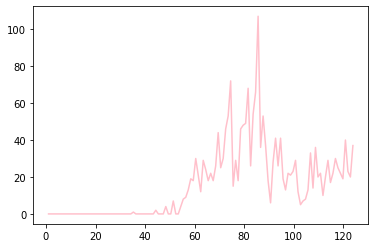

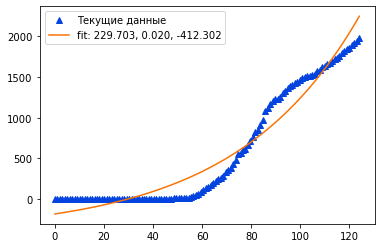

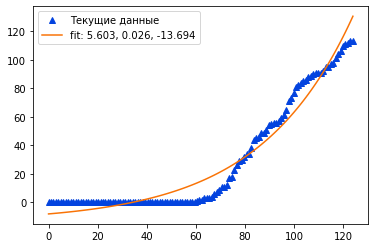

Norway


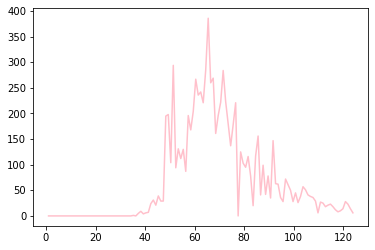

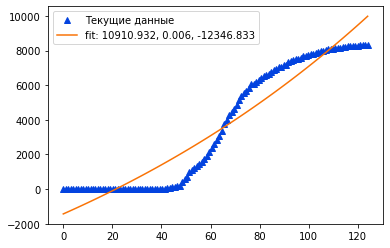

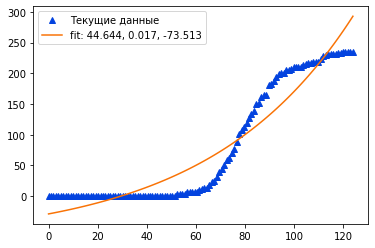

Oman


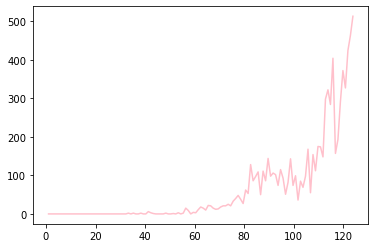

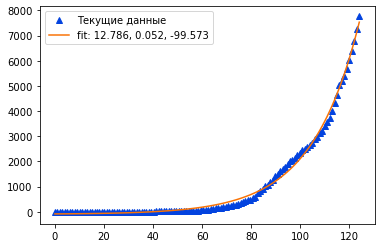

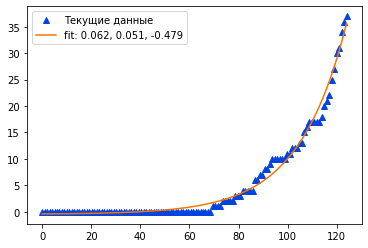

Pakistan


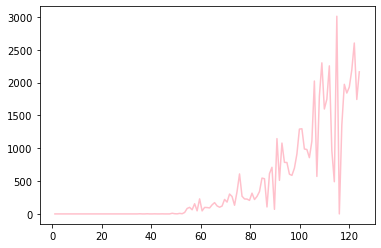

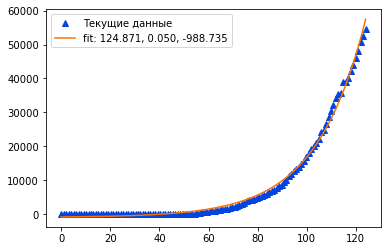

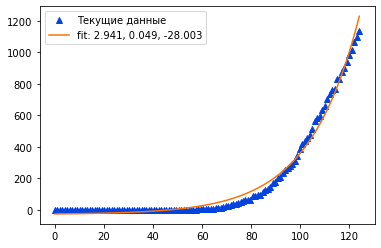

Panama


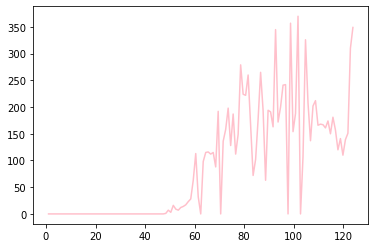

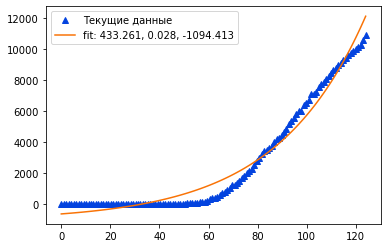

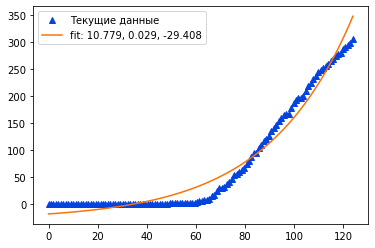

Papua New Guinea


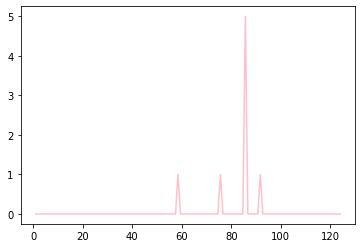

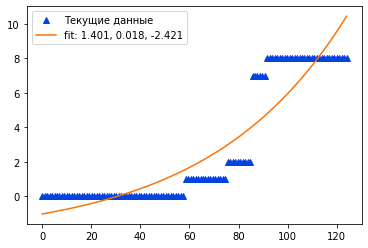

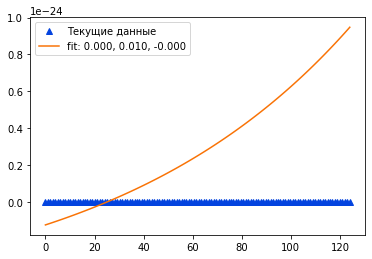

Paraguay


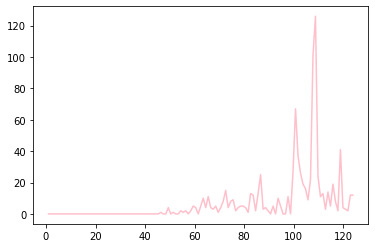

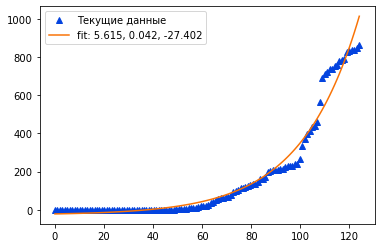

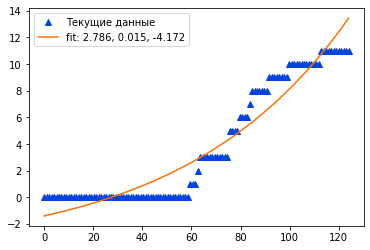

Peru


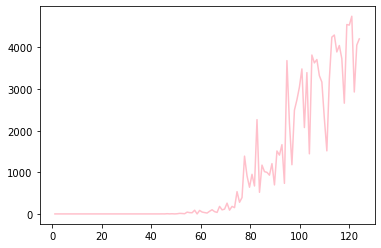

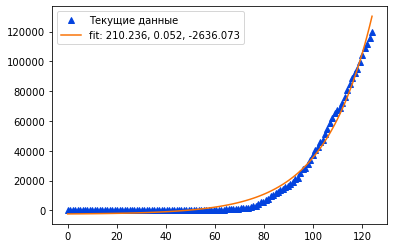

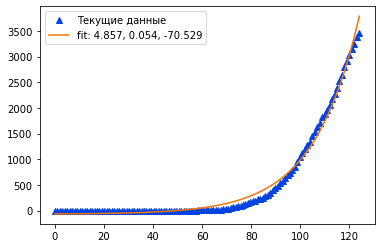

Philippines


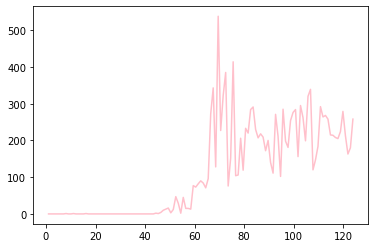

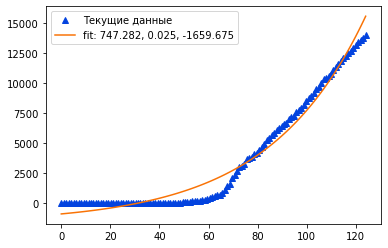

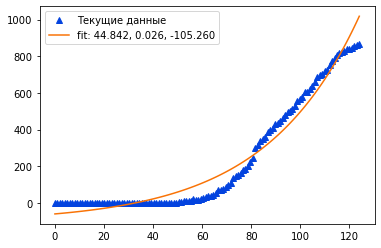

Poland


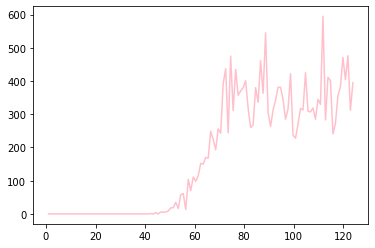

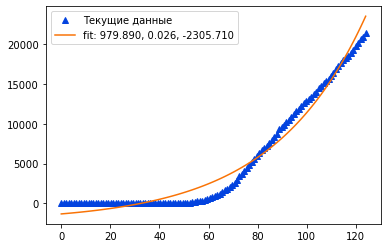

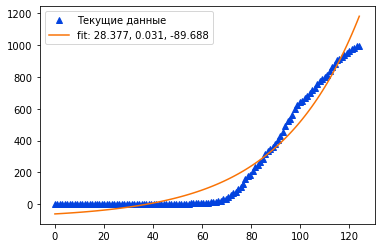

Portugal


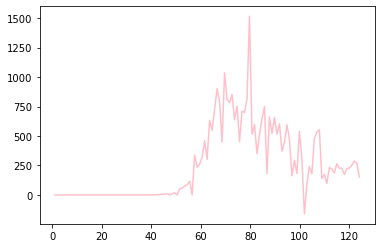

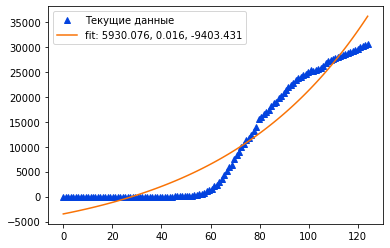

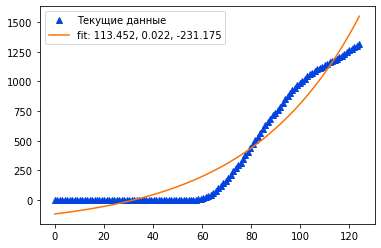

Qatar


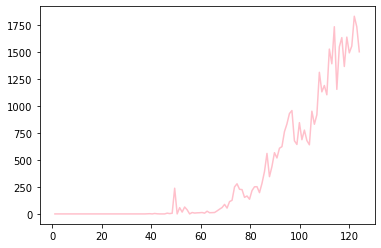

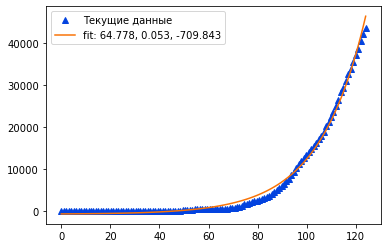

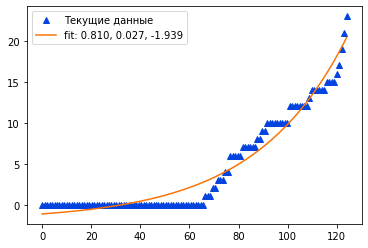

Romania


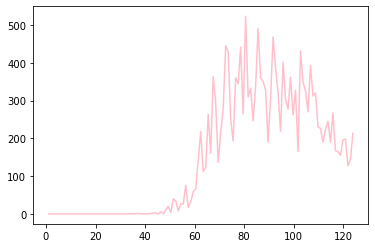

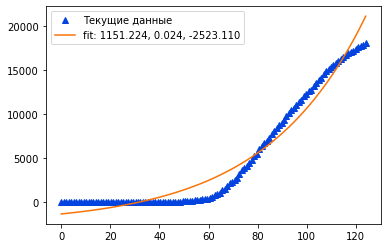

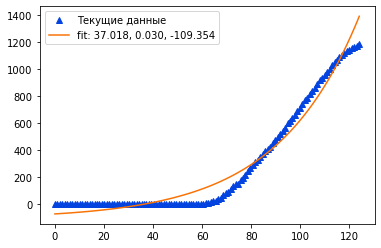

Russia


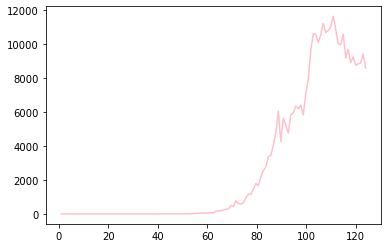

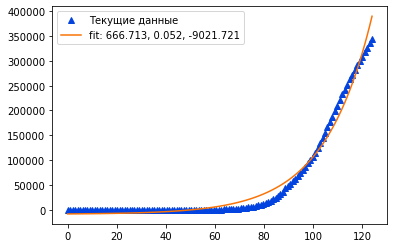

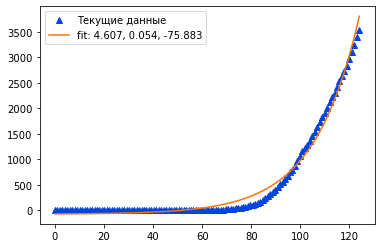

Rwanda


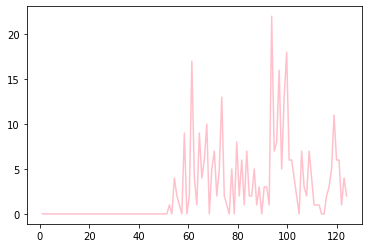

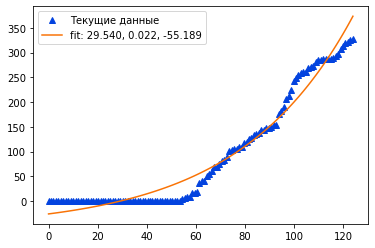

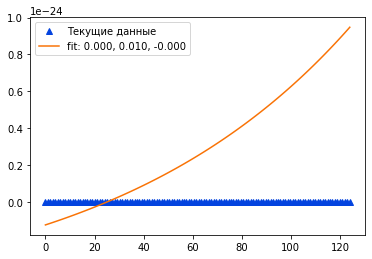

Saint Lucia


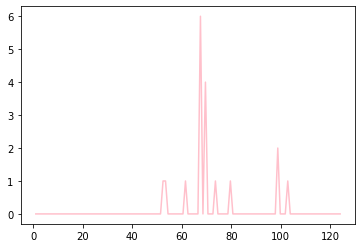

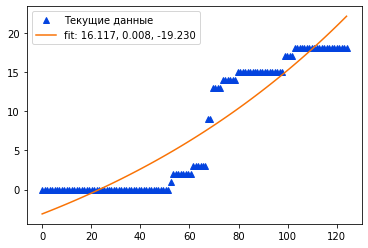

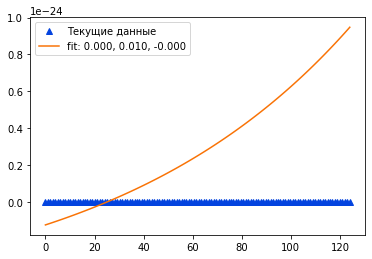

Saint Vincent and the Grenadines


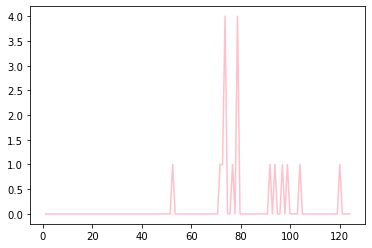

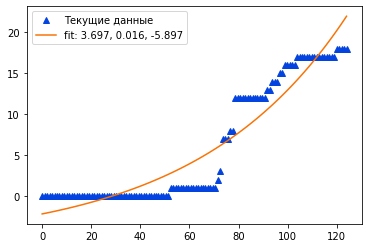

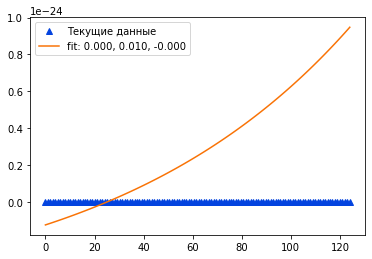

San Marino


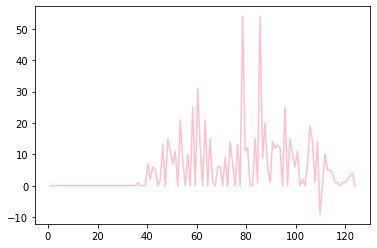

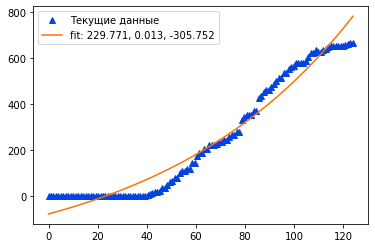

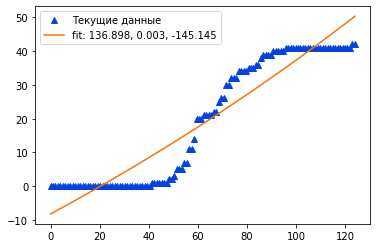

Saudi Arabia


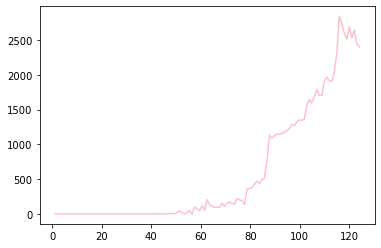

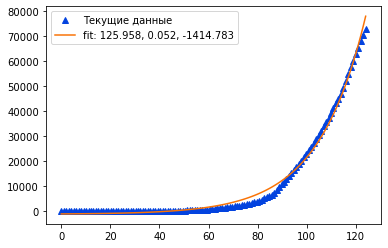

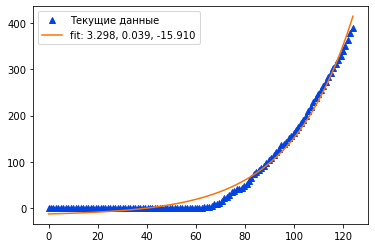

Senegal


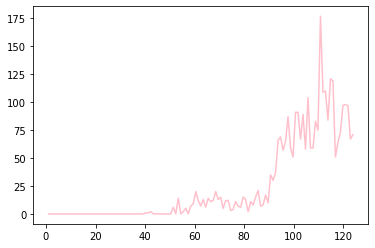

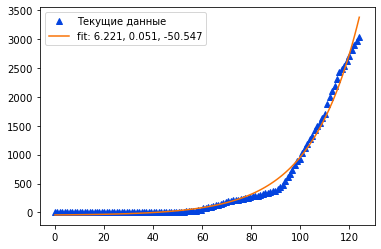

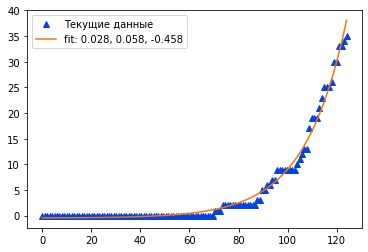

Serbia


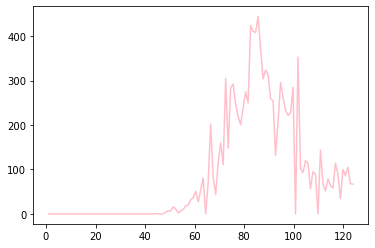

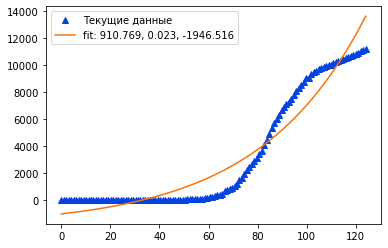

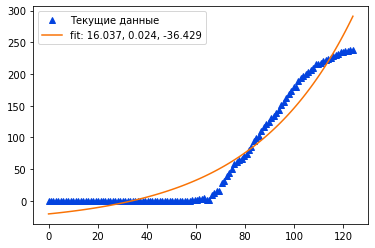

Seychelles


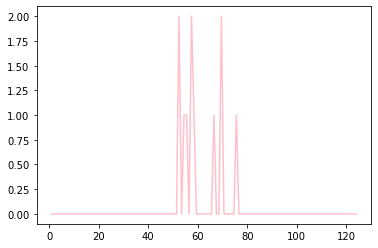

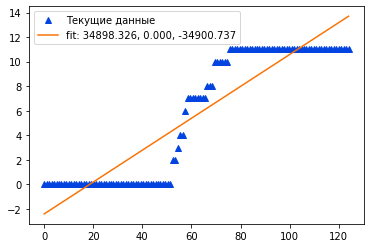

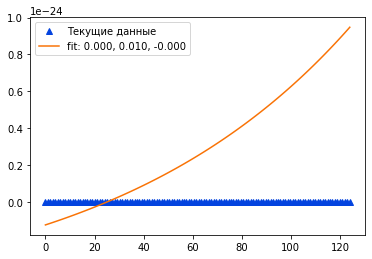

Singapore


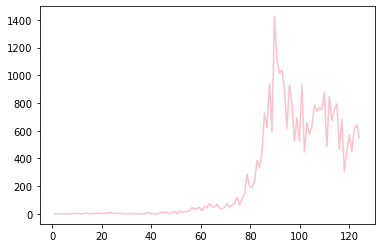

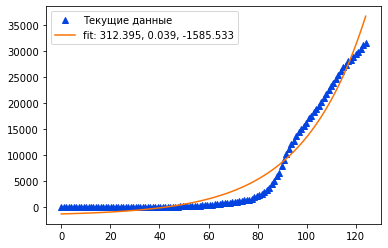

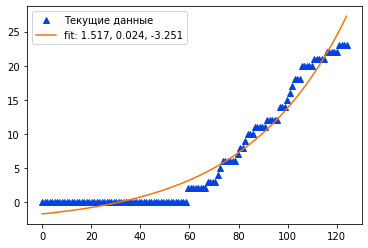

Slovakia


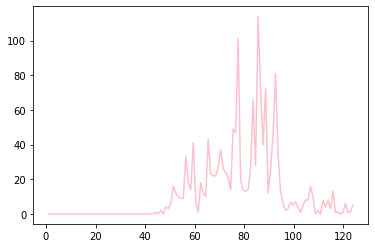

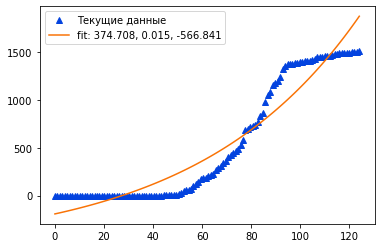

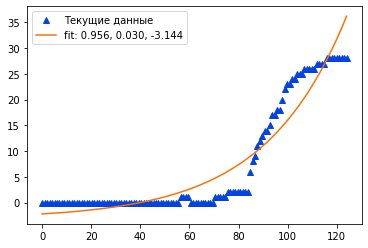

Slovenia


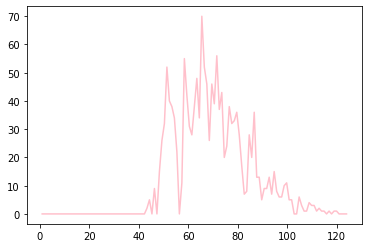

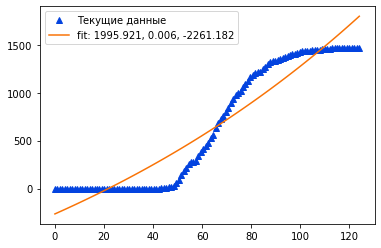

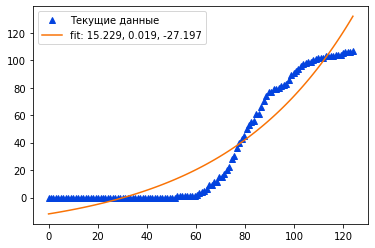

Somalia


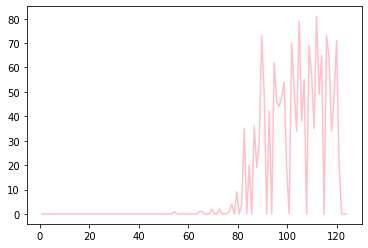

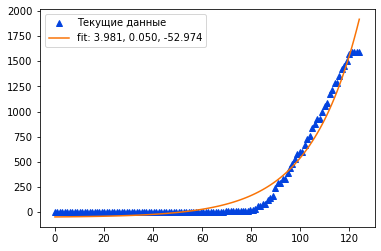

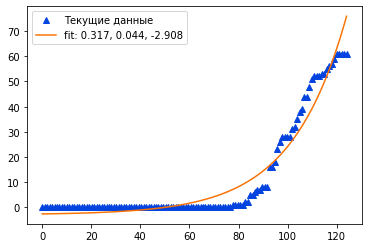

South Africa


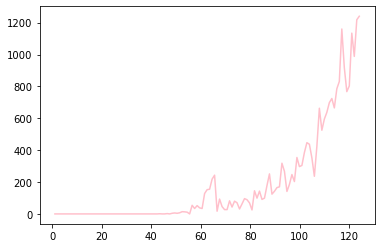

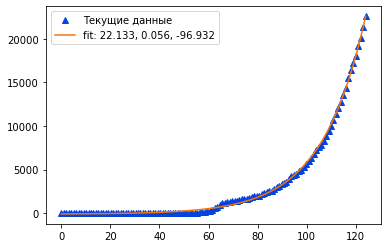

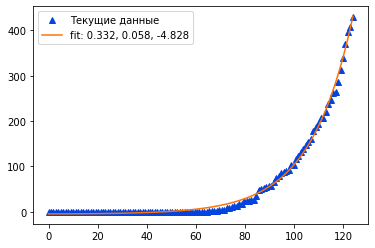

Spain


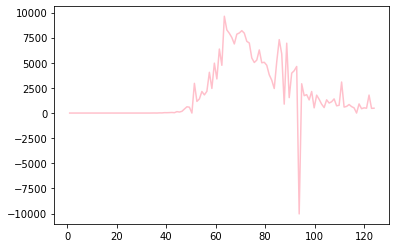

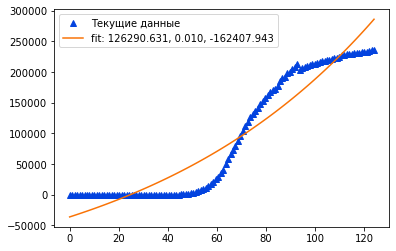

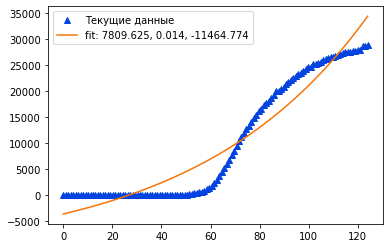

Sri Lanka


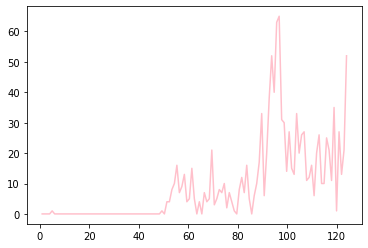

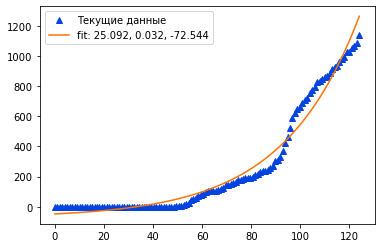

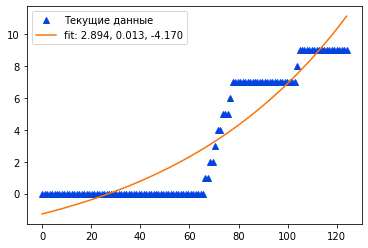

Sudan


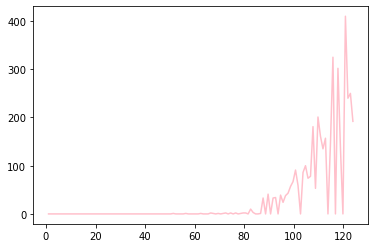

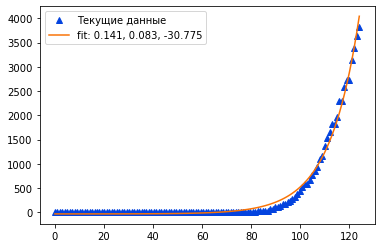

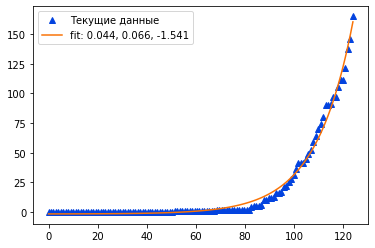

Suriname


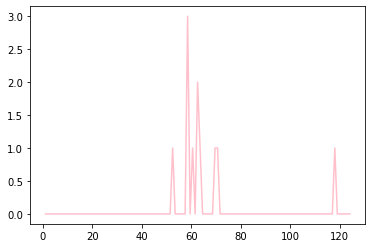

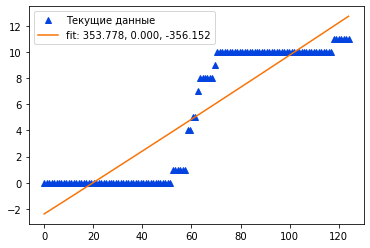

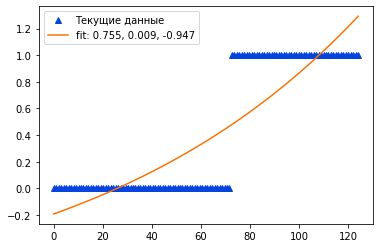

Sweden


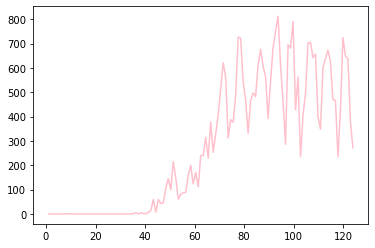

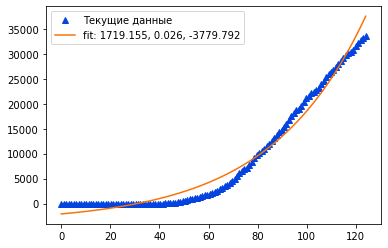

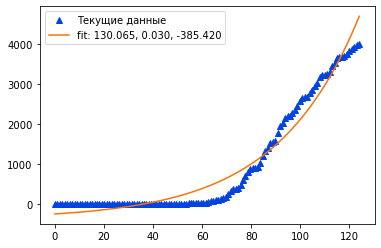

Switzerland


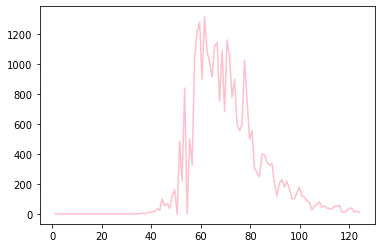

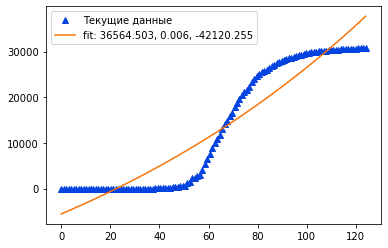

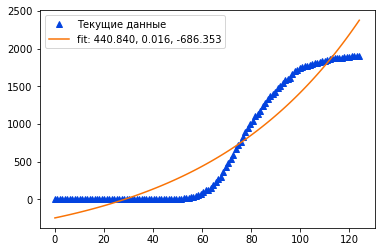

Taiwan*


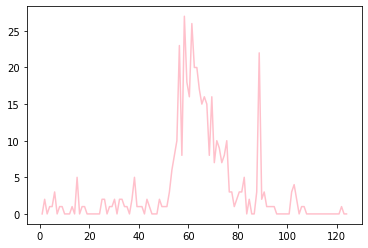

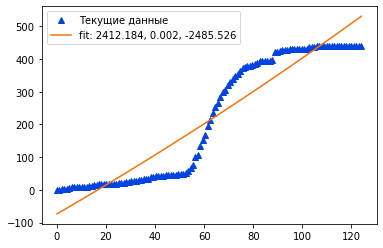

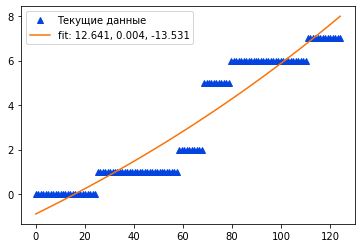

Tanzania


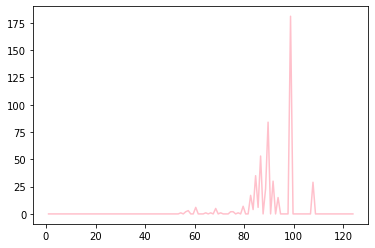

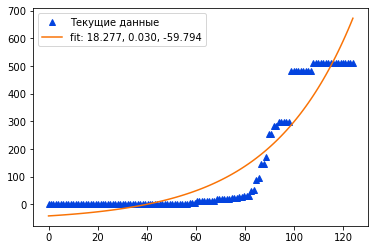

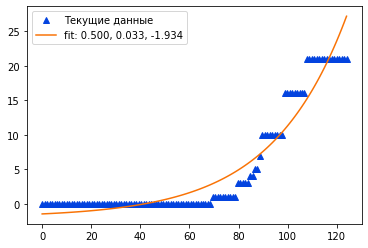

Thailand


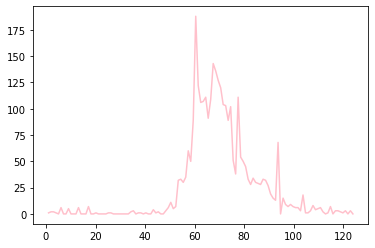

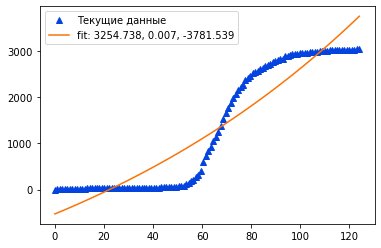

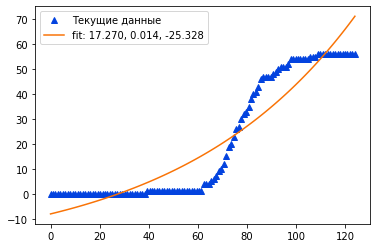

Togo


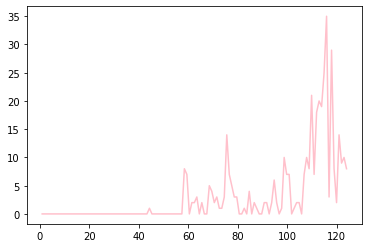

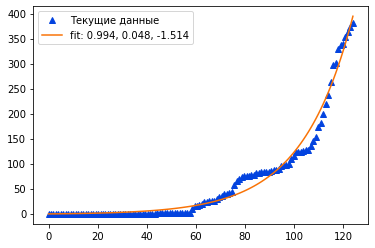

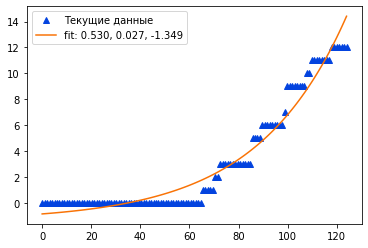

Trinidad and Tobago


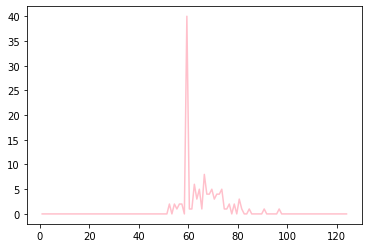

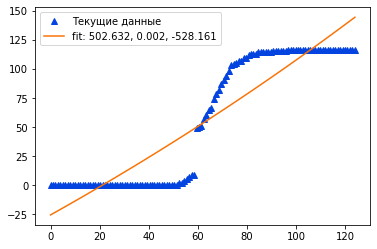

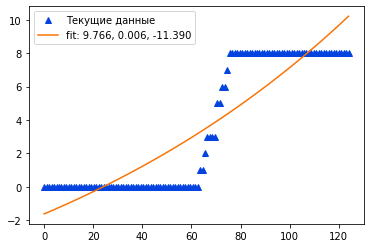

Tunisia


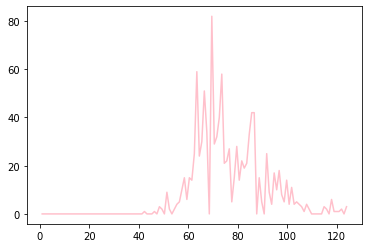

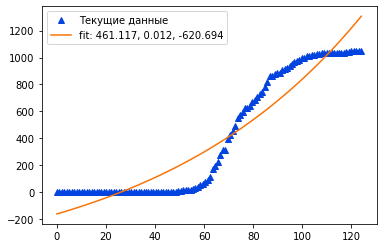

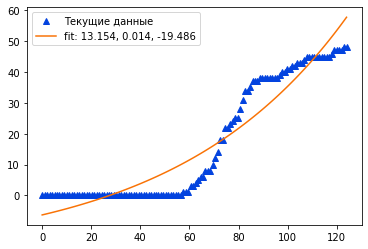

Turkey


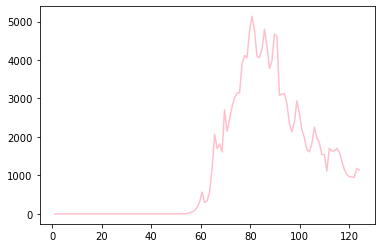

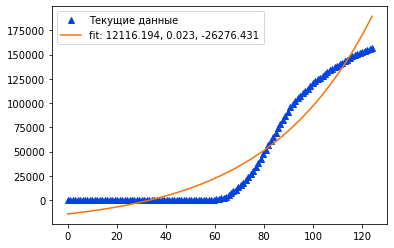

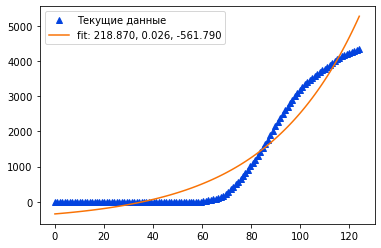

Uganda


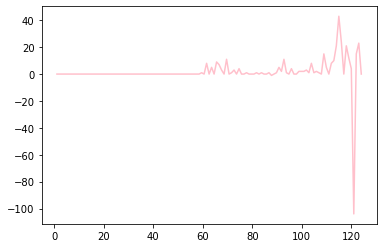

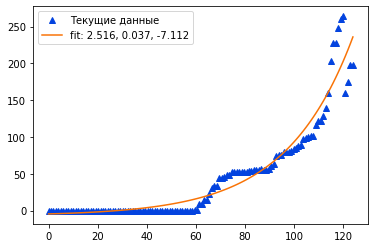

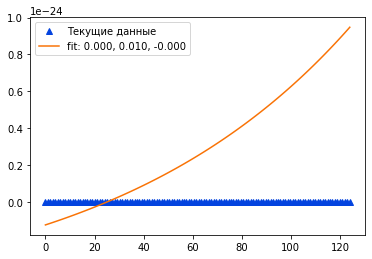

Ukraine


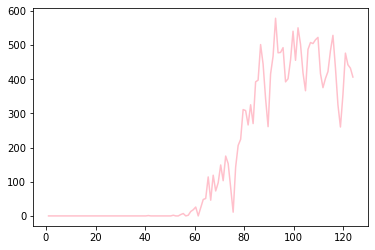

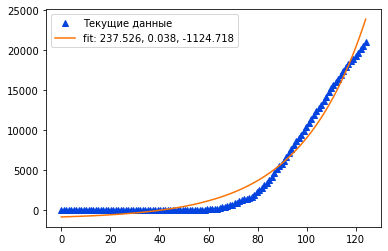

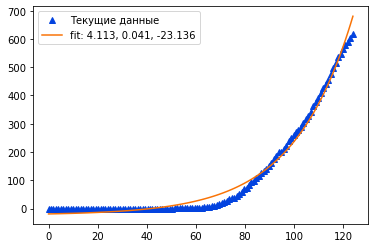

United Arab Emirates


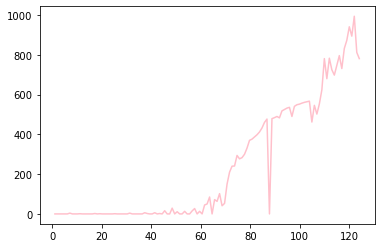

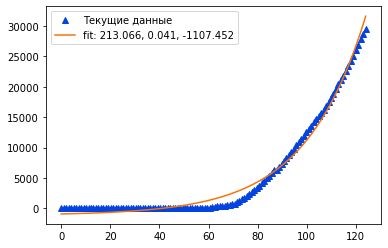

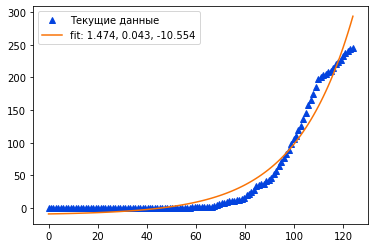

United Kingdom


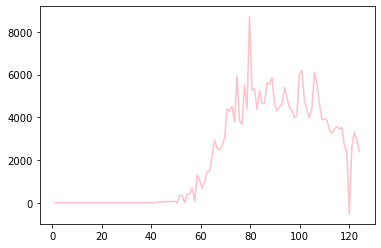

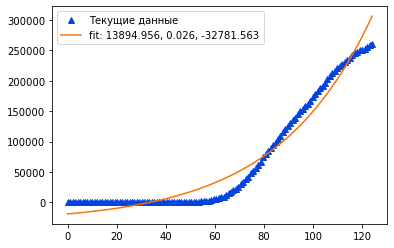

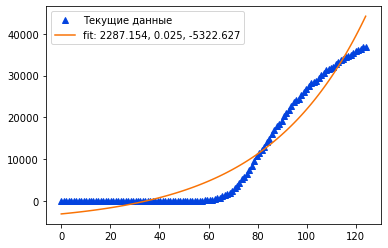

Uruguay


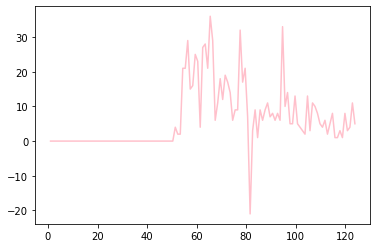

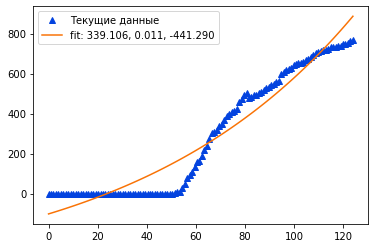

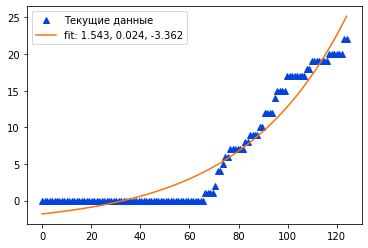

US


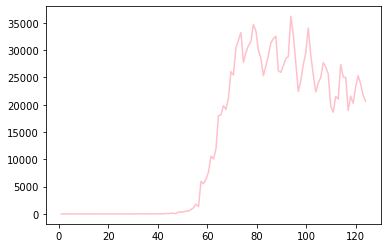

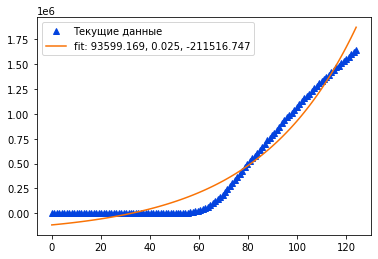

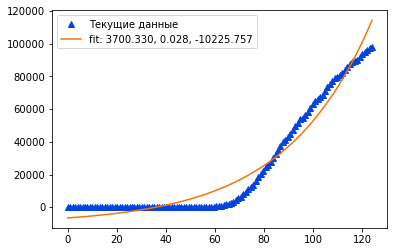

Uzbekistan


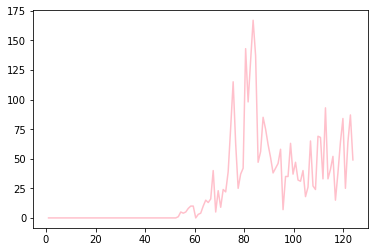

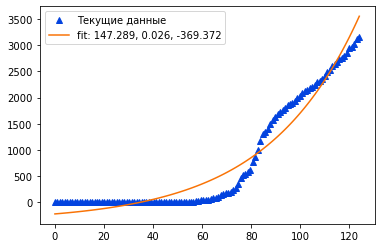

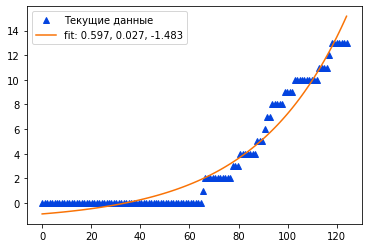

Venezuela


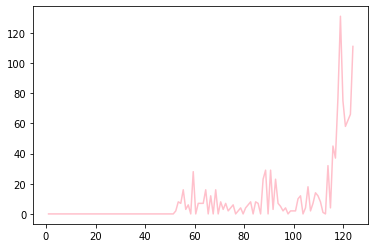

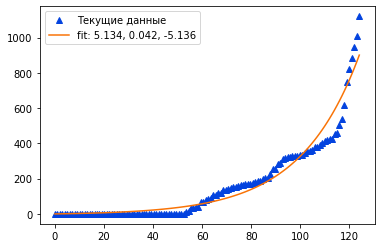

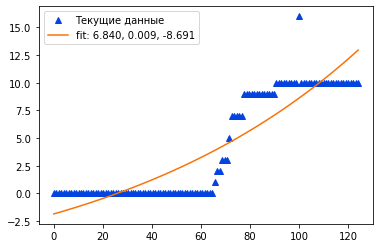

Vietnam


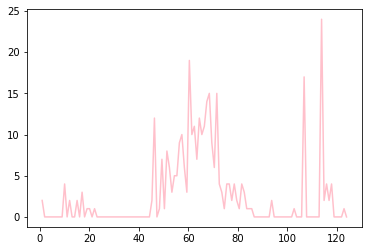

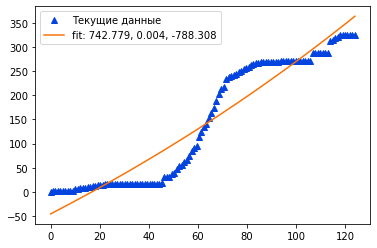

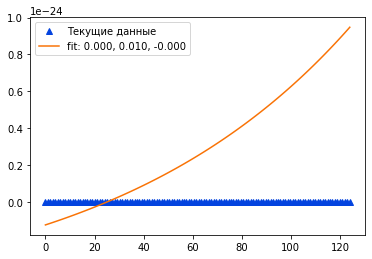

Zambia


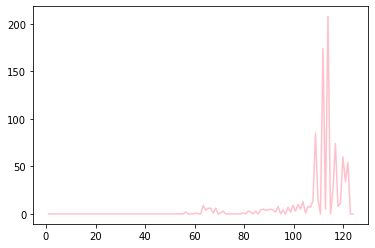

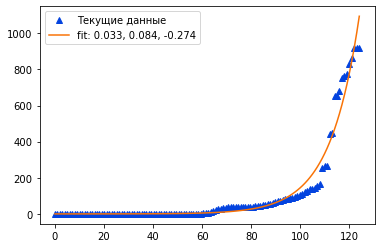

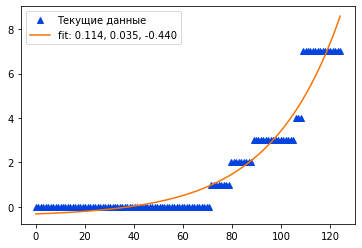

Zimbabwe


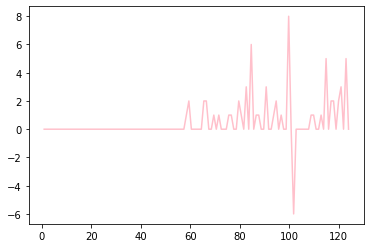

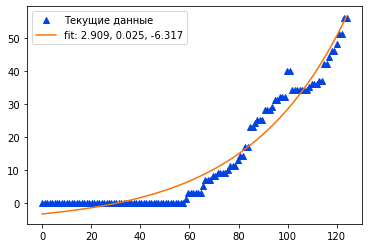

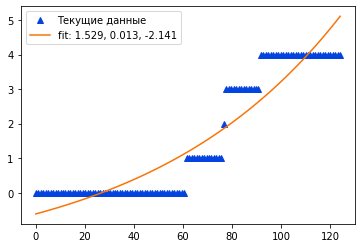

Dominica


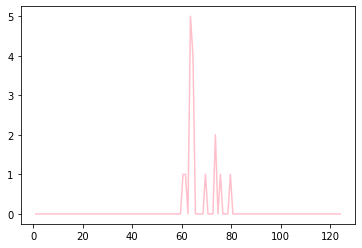

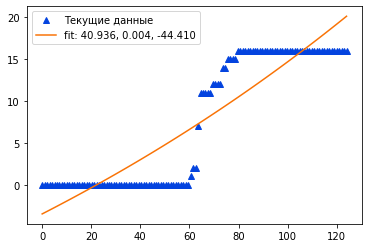

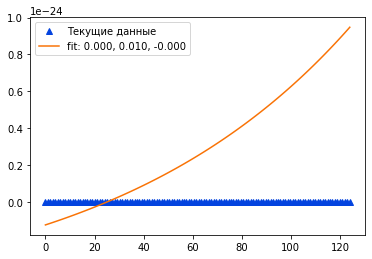

Grenada


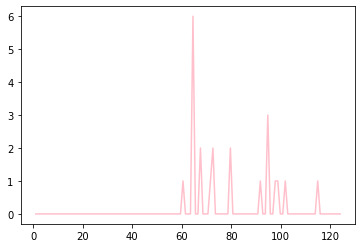

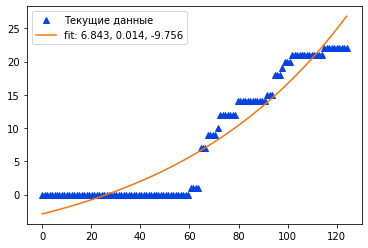

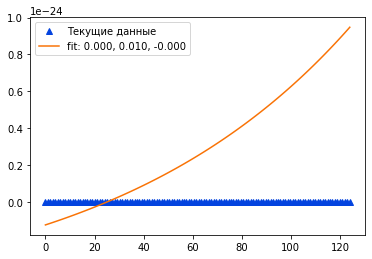

Mozambique


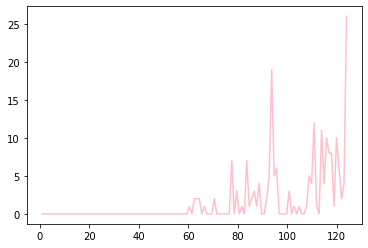

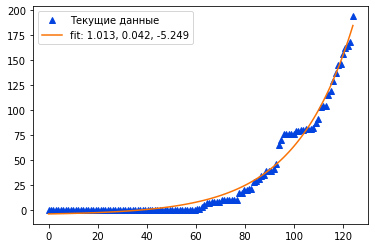

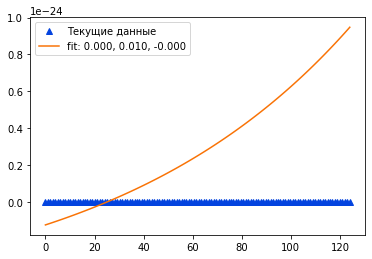

Syria


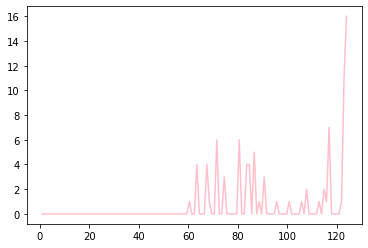

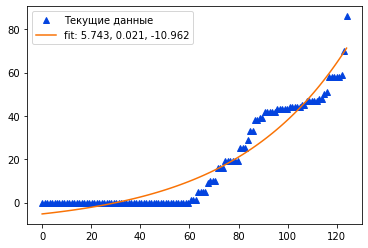

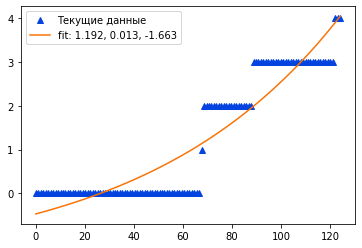

Timor-Leste


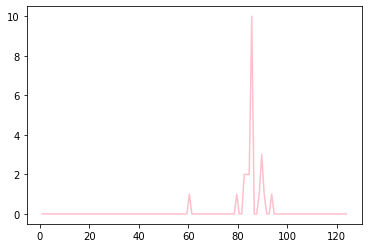

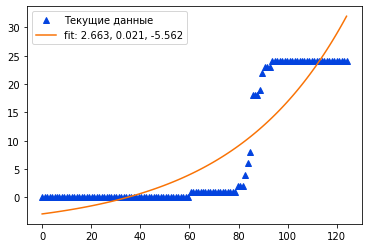

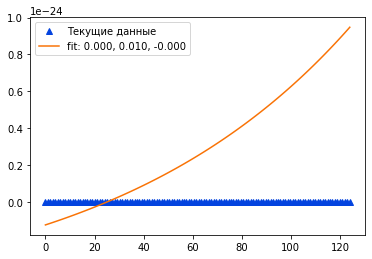

Belize


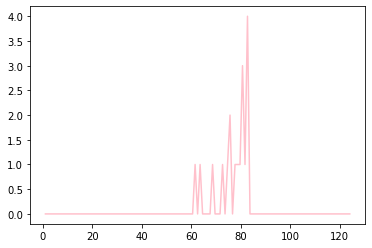

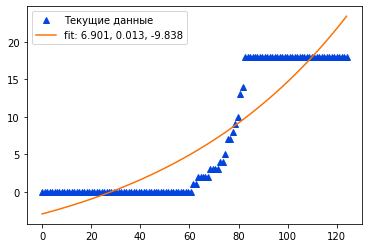

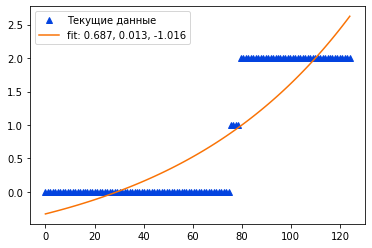

Laos


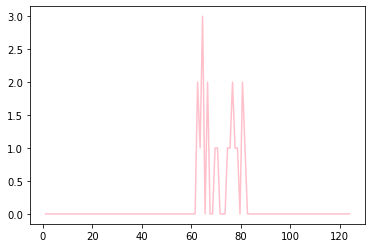

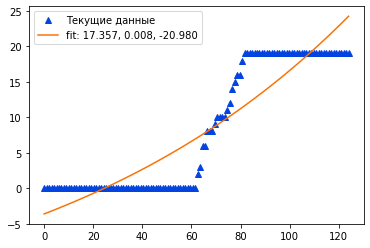

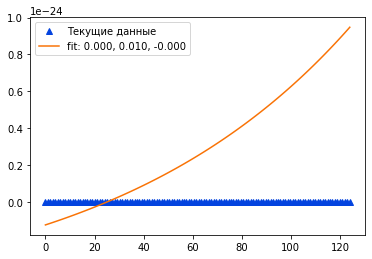

Libya


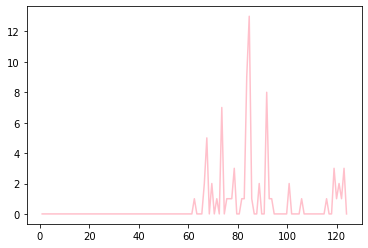

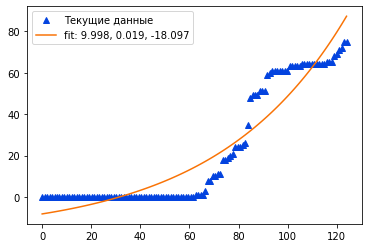

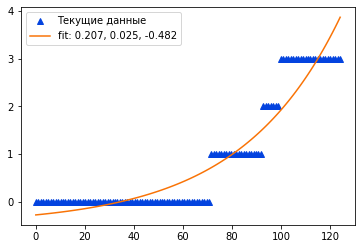

West Bank and Gaza


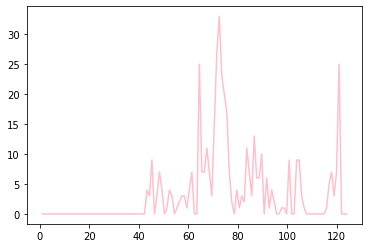

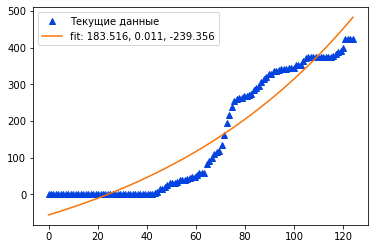

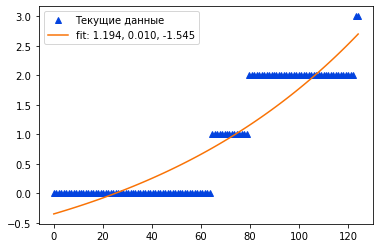

Guinea-Bissau


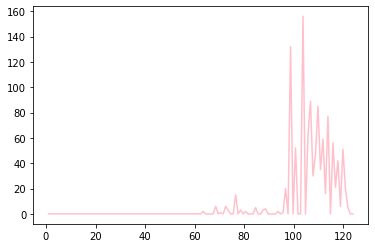

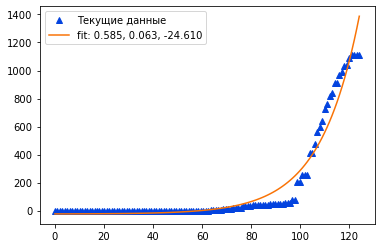

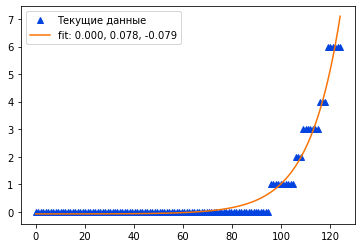

Mali


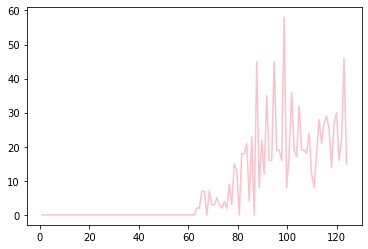

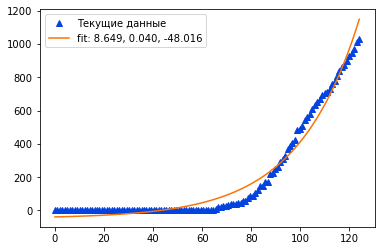

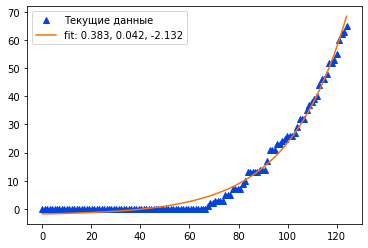

Saint Kitts and Nevis


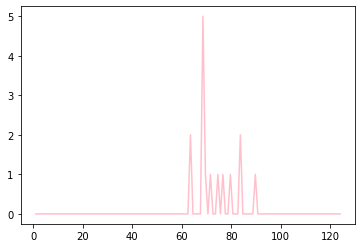

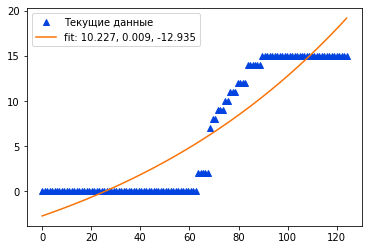

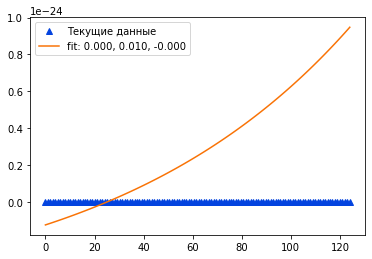

Kosovo


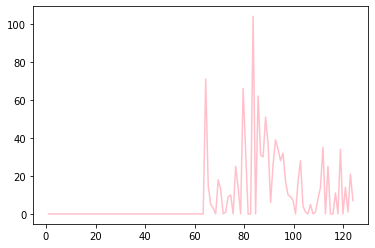

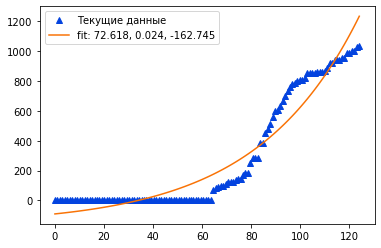

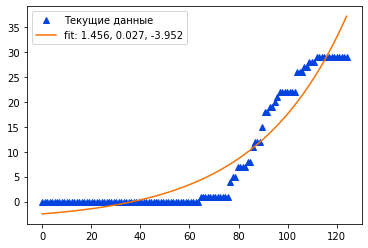

Burma


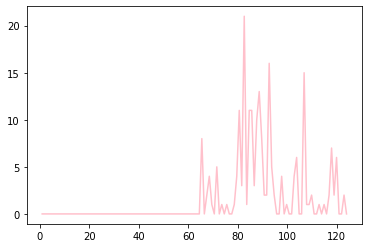

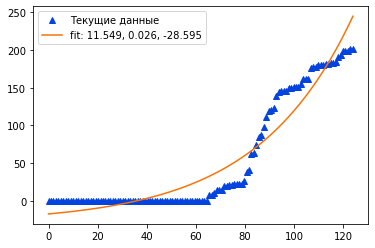

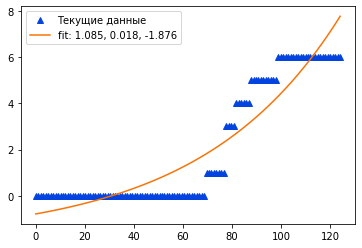

MS Zaandam


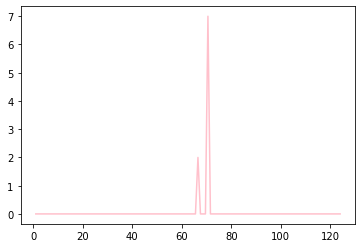

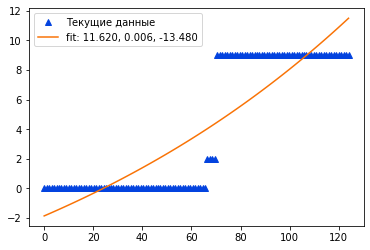

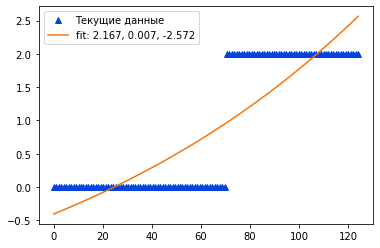

Botswana


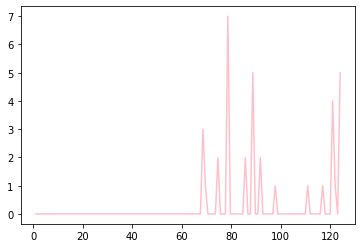

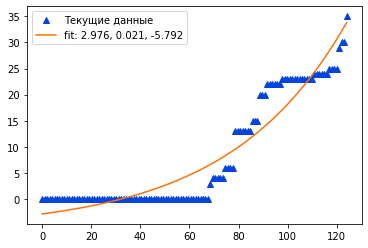

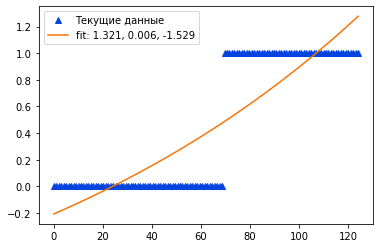

Burundi


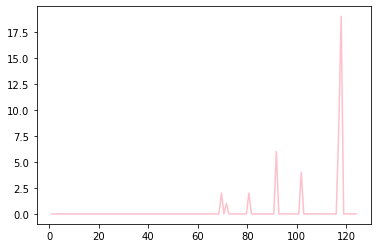

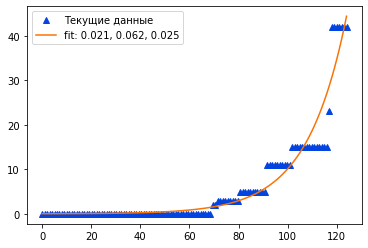

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


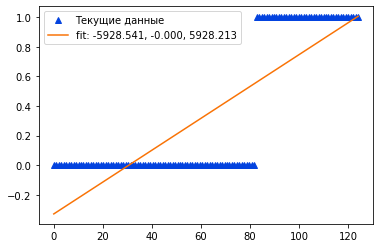

Sierra Leone


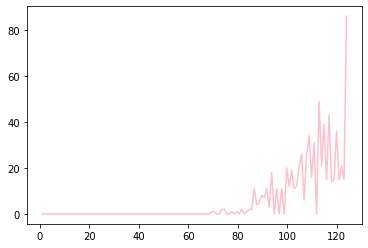

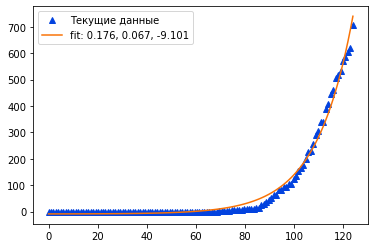

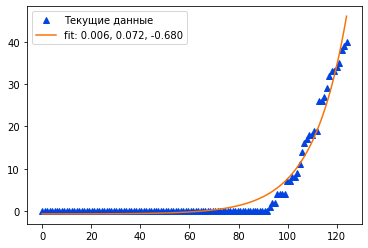

Malawi


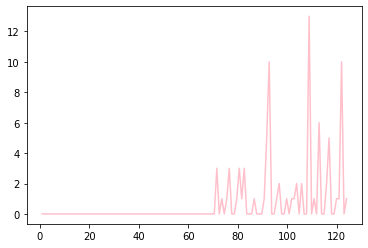

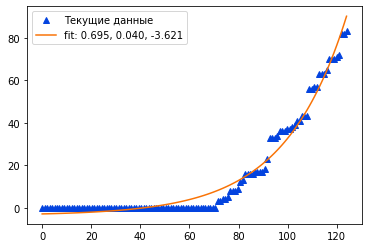

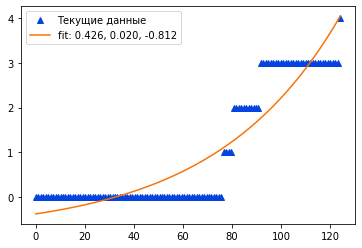

South Sudan


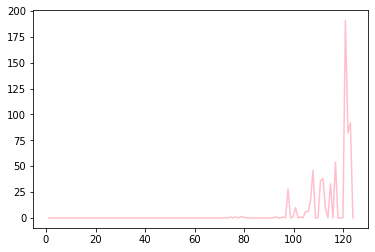

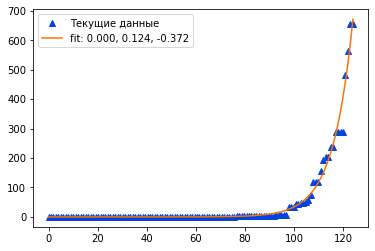

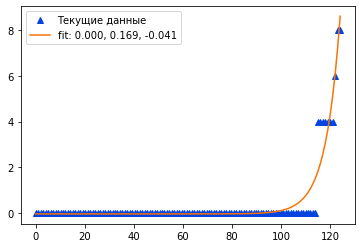

Western Sahara


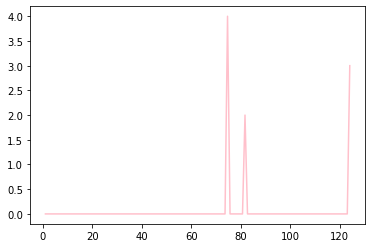

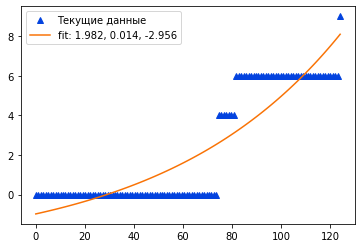

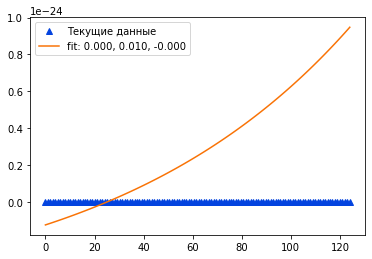

Sao Tome and Principe


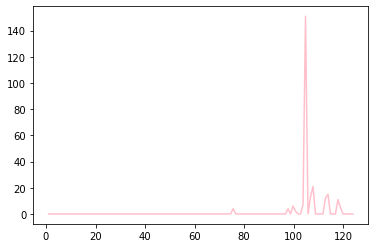

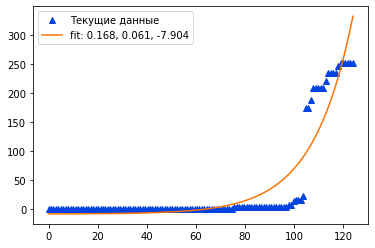

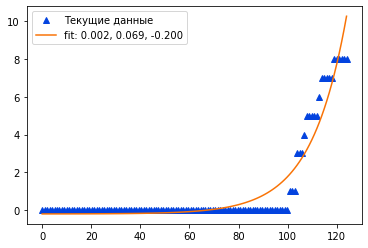

Yemen


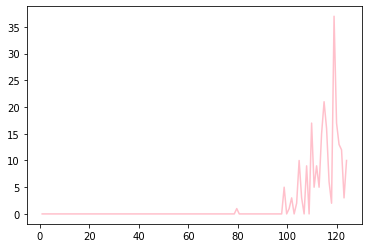

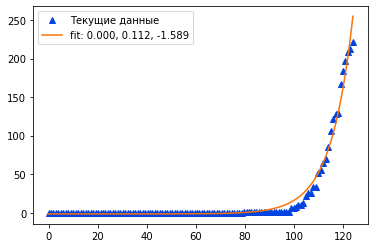

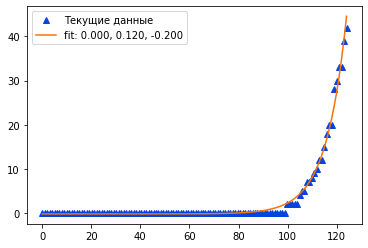

Comoros


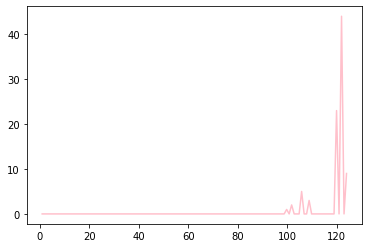

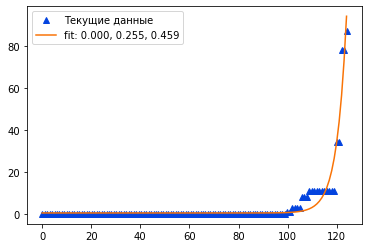

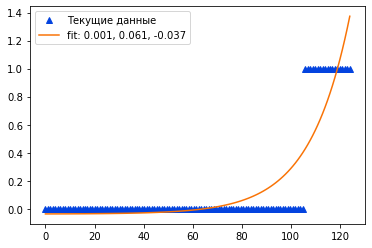

Tajikistan


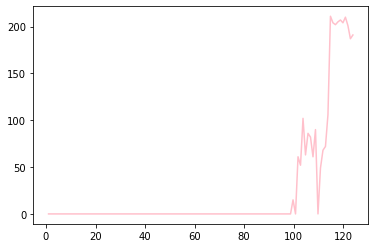

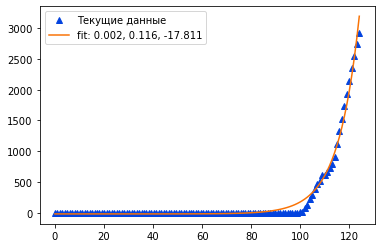

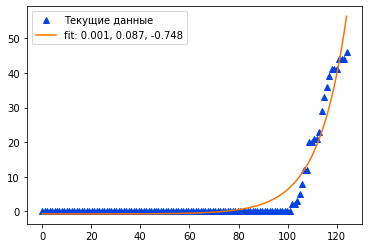

Lesotho


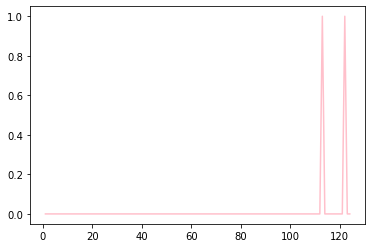

c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


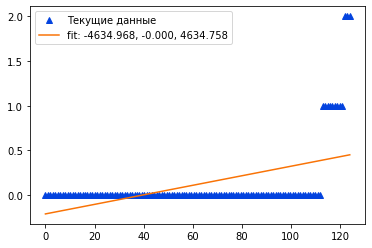

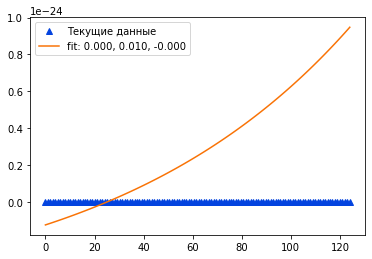

Countries with the exponential growth of infection ['Angola', 'Antigua and Barbuda', 'Bahamas', 'Bhutan', 'Eritrea', 'Fiji', 'Gambia', 'Guyana', 'Holy See', 'Mauritania', 'Namibia', 'Papua New Guinea', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Seychelles', 'Suriname', 'Zimbabwe', 'Dominica', 'Grenada', 'Mozambique', 'Syria', 'Timor-Leste', 'Belize', 'Laos', 'Libya', 'Saint Kitts and Nevis', 'MS Zaandam', 'Botswana', 'Burundi', 'Malawi', 'Western Sahara', 'Yemen', 'Comoros', 'Lesotho']


Countries with the exponential growth of died ['Afghanistan', 'Albania', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Armenia', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Barbados', 'Belarus', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Central African Republic', 'Chad', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Diamond Princess', 'Cuba', 'Cyprus', 'Djibouti', 'El Salv

In [5]:
#######№2#######
request = requests.get('https://pomber.github.io/covid19/timeseries.json').json()

confirmed = []
died =[]
                   
def exponenta(x, a, b, c):
        return a * np.exp(b * x) + c
        
def regression(x, y):
    popt, pcov = curve_fit(exponenta, x, y, p0 = (1, 0.01, 1), maxfev=50000)
    current = plt.plot(x, y, '^', color='xkcd:blue', label = "Текущие данные")
    curva_regresion = plt.plot(x, exponenta(x, *popt), color='xkcd:orange', label = "fit: {:.3f}, {:.3f}, {:.3f}".format(*popt))
    plt.legend()
    plt.show()
    return exponenta(x, *popt)
      
print("Spread rate of infected \nHypothesis of an exponential increase in the number of confirmed \n Hypothesis of an exponential increase in the number of died")

for country in request:
    print(country)
    x = None
    requestCountry = request[country]
    x = np.linspace(0, len(requestCountry), len(requestCountry))
    x_distribution = []
    y_confirmed = []
    y_deaths = []
    y_distribution = []
    for d in requestCountry:
        if d != 0:
            y_confirmed.append(d['confirmed'])
            y_deaths.append(d['deaths'])
    for i in range(len(y_confirmed)):
        if i != len(y_confirmed)-1:
            y_distribution.append(y_confirmed[i+1] - y_confirmed[i])
    x_distribution = np.delete(x, 0) 
    pep = plt.plot(x_distribution, y_distribution, color='pink', label = "Spread")
    plt.show()
    mseConfirmed = mean_squared_error(y_confirmed, regression(x, y_confirmed))
    mseDied = mean_squared_error(y_deaths, regression(x, y_deaths))
    if mseConfirmed < 100:
        confirmed.append(country)
    if mseDied < 100:
        died.append(country)
print("Countries with the exponential growth of infection", confirmed)
print("\n")
print("Countries with the exponential growth of died", died)

In [6]:
#######№3#######
request = requests.get('https://pomber.github.io/covid19/timeseries.json').json()

population = requests.get('https://raw.githubusercontent.com/datasets/population/master/data/population.csv').text
listCodeOfCountries = requests.get('https://raw.githubusercontent.com/mledoze/countries/master/countries.json').json()

populationConfirmedPercent = [] 
populationDeathsPercent = []

for country in request:
    rows = csv.reader(population.split('\n'), delimiter=',')
    for list2 in listCodeOfCountries:
        if list2['name']['common'] == country or list2['name']['official'] == country:
            code = list2['cca3']
            for row in rows:
                if len(row) != 0:
                    if code == row[1]:
                        if "2018" == row[2]:
                            rs = request[country]
                            confirmed = []
                            deaths = []
                            for d in rs:
                                if d != 0:
                                    confirmed.append(d['confirmed'])
                                    deaths.append(d['deaths'])
                            k = float(confirmed[len(confirmed) - 1]) / float(row[3]) * 100
                            p = float(deaths[len(deaths)-1]) / float(row[3]) * 100
                            print("City:", country, " confirmed it percent: ", k)
                            populationConfirmedPercent.append([code, k])
                            print("City:", country, " died in percent: ", p)
                            populationDeathsPercent.append([code, p])
                            print("\n")

City: Afghanistan  confirmed it percent:  0.028467368223282736
City: Afghanistan  died in percent:  0.0005864568392246868


City: Albania  confirmed it percent:  0.034817483819289584
City: Albania  died in percent:  0.0011163922667507683


City: Algeria  confirmed it percent:  0.019669213836962775
City: Algeria  died in percent:  0.0014208437638066052


City: Andorra  confirmed it percent:  0.9895332831207958
City: Andorra  died in percent:  0.06622860556320287


City: Angola  confirmed it percent:  0.00022395499192755854
City: Angola  died in percent:  1.2982898082757016e-05


City: Antigua and Barbuda  confirmed it percent:  0.025964314645950604
City: Antigua and Barbuda  died in percent:  0.003115717757514073


City: Argentina  confirmed it percent:  0.027140431867290028
City: Argentina  died in percent:  0.0010158558466392094


City: Armenia  confirmed it percent:  0.22566075474561753
City: Armenia  died in percent:  0.0027441106642238436


City: Australia  confirmed it percent:  0

City: Kuwait  confirmed it percent:  0.5148757320277504
City: Kuwait  died in percent:  0.0037705668104557814


City: Kyrgyzstan  confirmed it percent:  0.02218953628139432
City: Kyrgyzstan  died in percent:  0.0002214208894793446


City: Latvia  confirmed it percent:  0.05432825473984187
City: Latvia  died in percent:  0.0011415679123940028


City: Lebanon  confirmed it percent:  0.016265326310333374
City: Lebanon  died in percent:  0.00037962161945122774


City: Liberia  confirmed it percent:  0.005499092442234109
City: Liberia  died in percent:  0.000539533598105988


City: Liechtenstein  confirmed it percent:  0.2163017673437088
City: Liechtenstein  died in percent:  0.0026378264310208386


City: Lithuania  confirmed it percent:  0.0579323608454341
City: Lithuania  died in percent:  0.0022487607721887546


City: Luxembourg  confirmed it percent:  0.6566329467883872
City: Luxembourg  died in percent:  0.018093593223126904


City: Madagascar  confirmed it percent:  0.0020066735794731

City: Zimbabwe  confirmed it percent:  0.00038783800948236227
City: Zimbabwe  died in percent:  2.7702714963025883e-05


City: Dominica  confirmed it percent:  0.022338568935427575
City: Dominica  died in percent:  0.0


City: Grenada  confirmed it percent:  0.019739085183124876
City: Grenada  died in percent:  0.0


City: Mozambique  confirmed it percent:  0.0006577171478590866
City: Mozambique  died in percent:  0.0


City: Syria  confirmed it percent:  0.0005086866226006035
City: Syria  died in percent:  2.3659842911655982e-05


City: Timor-Leste  confirmed it percent:  0.0018927862760376413
City: Timor-Leste  died in percent:  0.0


City: Belize  confirmed it percent:  0.004698867833900243
City: Belize  died in percent:  0.0005220964259889159


City: Laos  confirmed it percent:  0.00026906437960055835
City: Laos  died in percent:  0.0


City: Libya  confirmed it percent:  0.0011229953970664666
City: Libya  died in percent:  4.4919815882658656e-05


City: Guinea-Bissau  confirmed it

In [7]:
#######№4#######
from scipy.stats import linregress

request = requests.get('https://pomber.github.io/covid19/timeseries.json').json()

dataVVP = requests.get('https://raw.githubusercontent.com/datasets/gdp/master/data/gdp.csv').text
income = requests.get('https://pastebin.com/raw/rruUUAJs').text

VVP = []
income2 = []
for country in request:
    rowsVVP = csv.reader(dataVVP.split('\n'), delimiter=',')
    for list2 in listCodeOfCountries:
        if list2['name']['common'] == country or list2['name']['official'] == country:
            code = list2['cca3']
            for row in rowsVVP:
                if len(row) != 0:
                    if code == row[1]:
                        if "2016" == row[2]:
                            VVP.append([code, row[3]])
            rows_income = csv.reader(income.split('\n'), delimiter=',')                
            for row in rows_income:
                if len(row) != 0:
                    if code == row[1]:
                        income2.append([code, row[2]])


x = []
y = []

def fun(x, y, first_array, second_array):
    for i in range(len(first_array)):
        for j in range(len(second_array)):
            if first_array[i][0] == second_array[j][0]:
                x.append(first_array[i][1])
                y.append(float(second_array[j][1]))
                return x, y
            
x, y = fun(x, y, populationConfirmedPercent, VVP)

if linregress(y, x)[2] < 0:
    print("Confirmed-VVP = Feedback")
else:
    print("Confirmed-VVP = Dirrect connection")

x = []
y = []

x, y = fun(x, y, populationDeathsPercent, VVP)

if linregress(y, x)[2] < 0:
    print("Died-VVP = Feedback")
else:
    print("Died-VVP = Direct connection")

x = []
y = []

x, y = fun(x, y, populationConfirmedPercent, income2)

if linregress(y, x)[2] < 0:
    print("Confirmed-income = Feedback")
else:
    print("Confirmed-income = Direct connection")
    
x = []
y = []

x, y = fun(x, y, populationDeathsPercent, income2)

if linregress(y, x)[2] < 0:
    print("Died-income = Feedback")
else:
    print("Died-income = Direct connection")
    

Confirmed-VVP = Dirrect connection
Died-VVP = Direct connection
Confirmed-income = Direct connection
Died-income = Direct connection


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0

In [8]:
#######№5#######
# Create CSV-file and write it
import pandas as pd
import csv

x = []
y = []
z = []
for i in range(len(income2)):
    for j in range(len(populationConfirmedPercent)):
        if income2[i][0] == populationConfirmedPercent[j][0]:
            x.append(populationConfirmedPercent[j][1])
    for k in range(len(VVP)):
        if income2[i][0] == VVP[k][0]:
            y.append(VVP[k][1])
    z.append(income2[i][1])

from sklearn.datasets import make_blobs
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
points = []
z.pop()
x.pop()
for i in range(len(x)):
    points.append([x[i], y[i], z[i]])
kmeans = KMeans(n_clusters=4)
kmeans.fit(points)
y_km = kmeans.fit_predict(points)
rar = []
for i in range(len(income2)-1):
    rar.append([income2[i][0], y_km[i]])
            
data = [{'Country': ' ','Cluster': ' '}]

pd.DataFrame(data).to_csv(r'country.csv', index=False)

exampleFile = open('country.csv', 'w', encoding = 'UTF-8', newline = '')
exampleWriter = csv.writer(exampleFile, delimiter = ';')

p = [['Country,Cluster']]
for i in range(len(rar)):
    line = str(rar[i][0]) + ',' + str(rar[i][1])
    p.append([line])
    
for row in p:
    exampleWriter.writerow(row)

exampleFile.close()    

In [25]:
import pandas as pd
import folium
import os

state_geo = os.path.join('world-countries.json')
state_unemployment = os.path.join('country.csv')
state_data = pd.read_csv(state_unemployment)
print(state_data)
m = folium.Map(location=[37, 0], zoom_start=2)
 
m.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=state_data,
 columns=['Country', 'Cluster'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='Cluster'
)

folium.LayerControl().add_to(m)
 
display(m)

   Country  Cluster
0      ALB        0
1      DZA        0
2      ARG        0
3      ARM        0
4      AUS        2
5      AUT        0
6      AZE        0
7      BHR        0
8      BGD        0
9      BLR        0
10     BEL        0
11     BOL        0
12     BIH        0
13     BRA        2
14     BGR        0
15     CAN        2
16     CHL        0
17     CHN        1
18     COL        0
19     CRI        0
20     HRV        0
21     CYP        0
22     CZE        0
23     DNK        0
24     DOM        0
25     ECU        0
26     EGY        0
27     EST        0
28     FIN        0
29     FRA        2
..     ...      ...
65     PAK        0
66     PAN        0
67     PRY        0
68     PER        0
69     PHL        0
70     POL        0
71     PRT        0
72     QAT        0
73     ROU        0
74     RUS        2
75     SAU        0
76     SRB        0
77     SGP        0
78     SVK        0
79     SVN        0
80     ZAF        0
81     ESP        2
82     LKA        0


Global


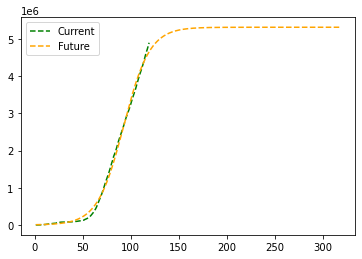

Country Afghanistan


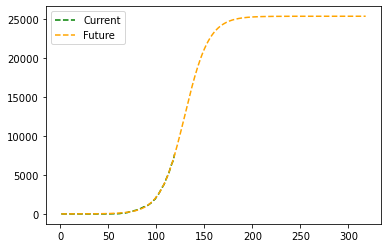

Country Albania


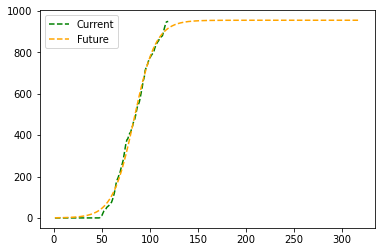

Country Algeria


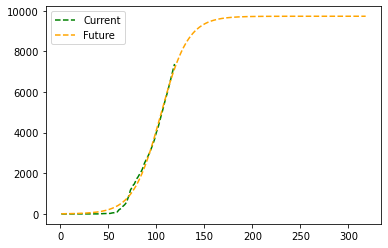

Country Andorra


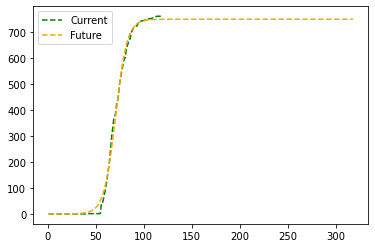

Country Angola


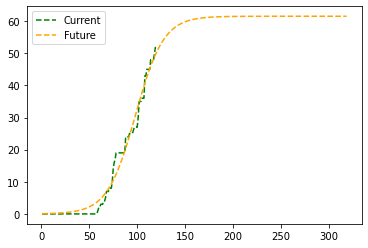

Country Antigua and Barbuda


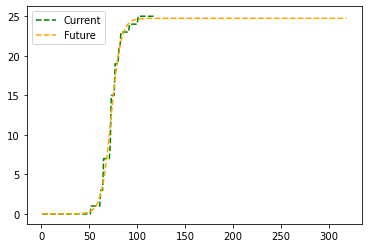

Country Argentina


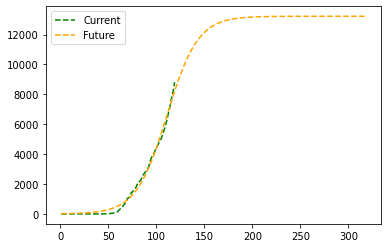

Country Armenia


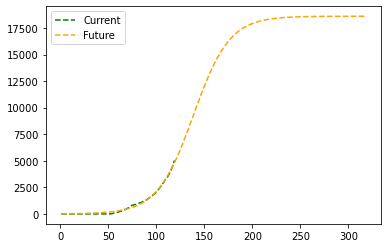

Country Australia


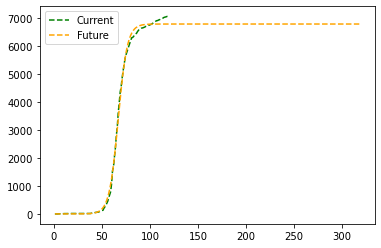

Country Austria


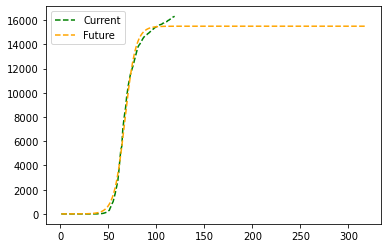

Country Azerbaijan


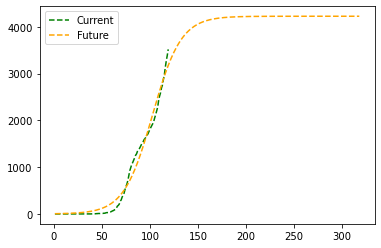

Country Bahamas


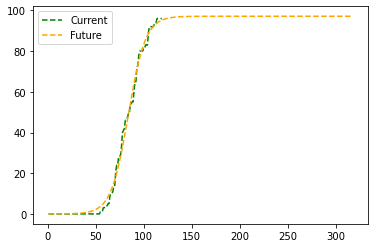

Country Bahrain


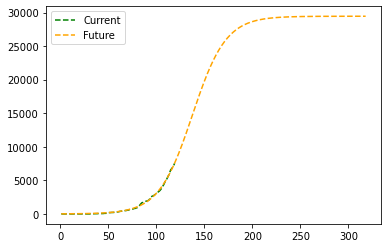

Country Bangladesh


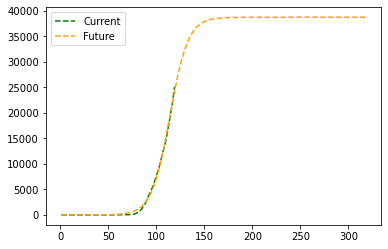

Country Barbados


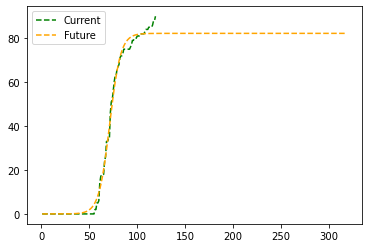

Country Belarus


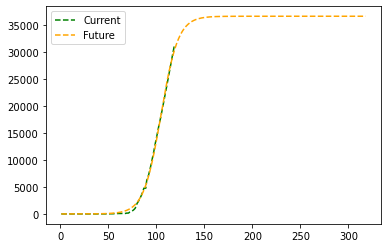

Country Belgium


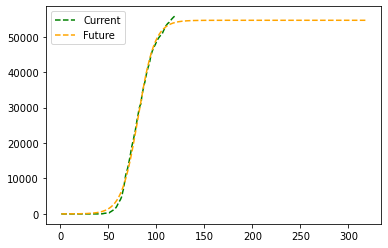

Country Benin


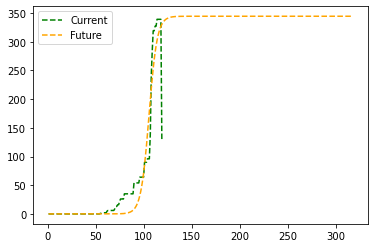

Country Bhutan


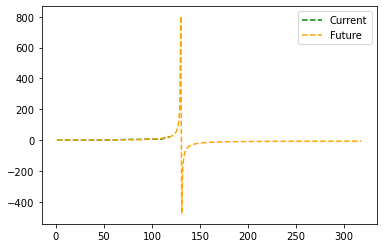

Country Bolivia


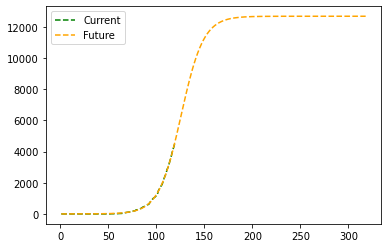

Country Bosnia and Herzegovina


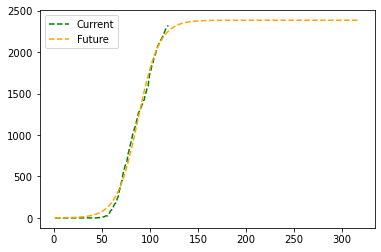

Country Brazil


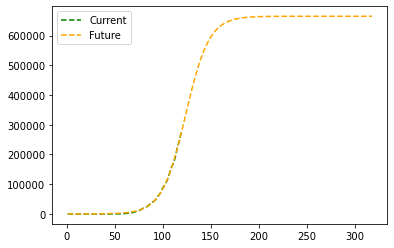

Country Brunei


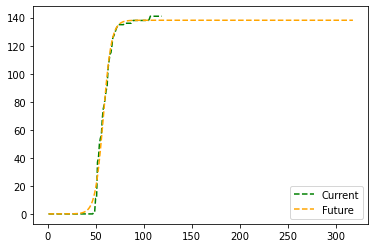

Country Bulgaria


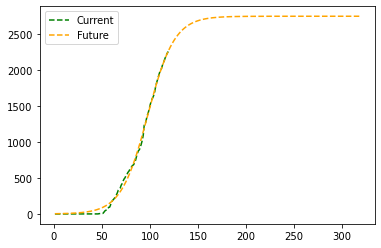

Country Burkina Faso


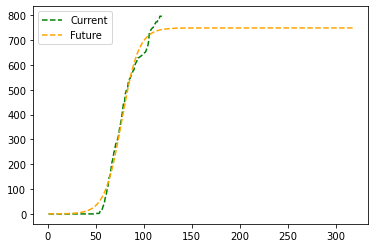

Country Cabo Verde


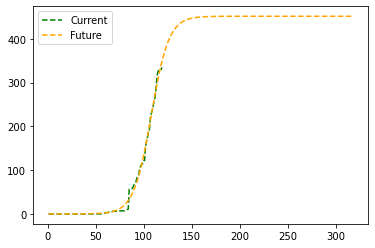

Country Cambodia


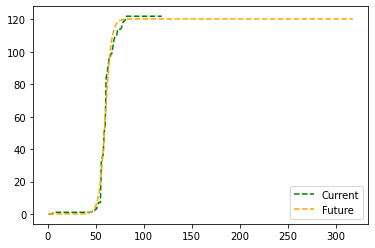

Country Cameroon


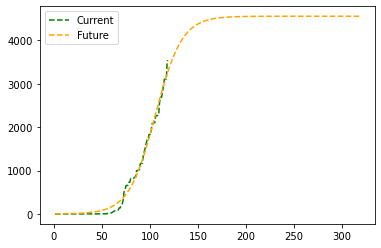

Country Canada


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


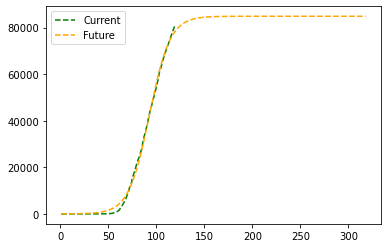

Country Central African Republic


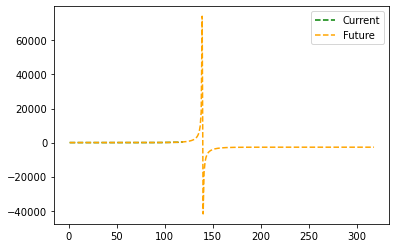

Country Chad


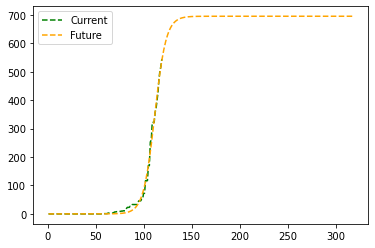

Country Chile


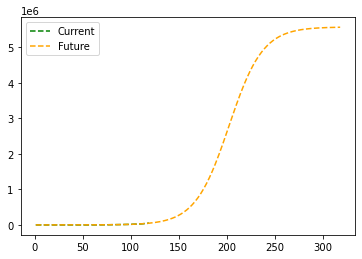

Country China


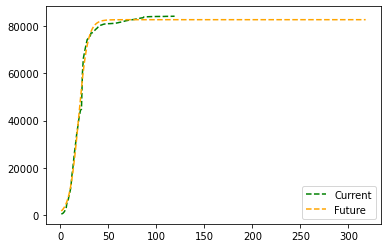

Country Colombia


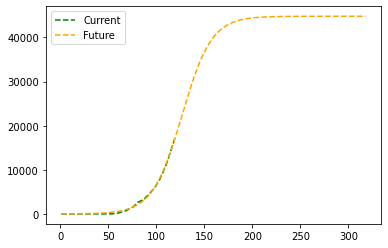

Country Congo (Brazzaville)


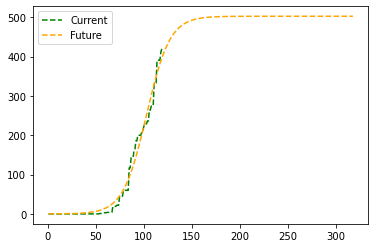

Country Congo (Kinshasa)


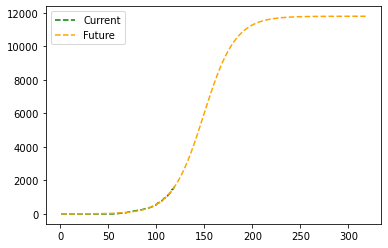

Country Costa Rica


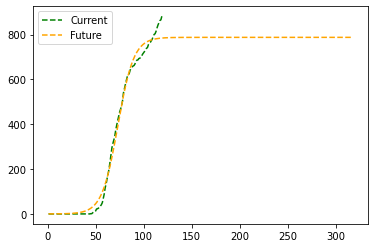

Country Cote d'Ivoire


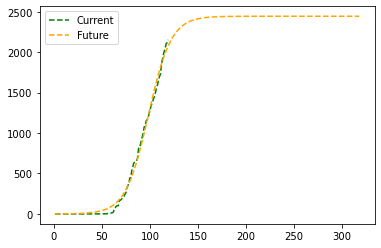

Country Croatia


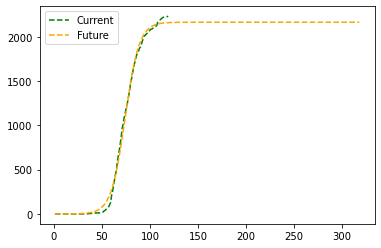

Country Diamond Princess


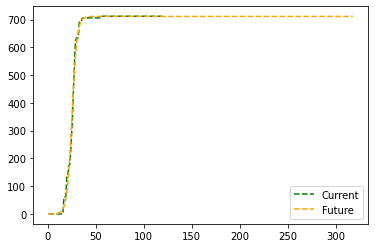

Country Cuba


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


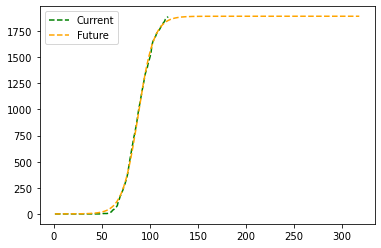

Country Cyprus


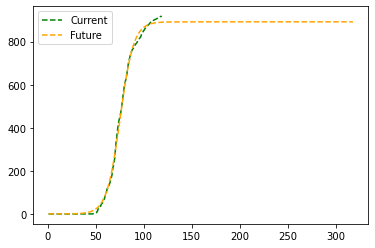

Country Czechia


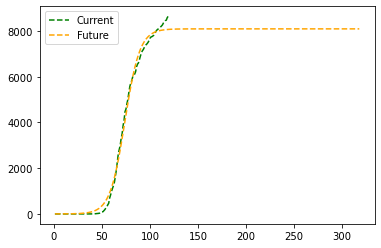

Country Denmark


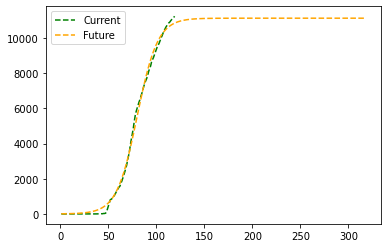

Country Djibouti


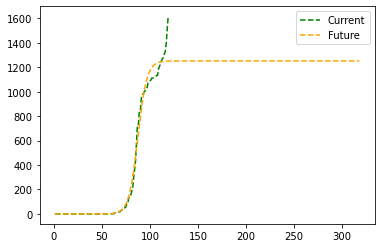

Country Dominican Republic


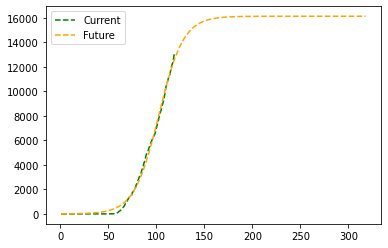

Country Ecuador


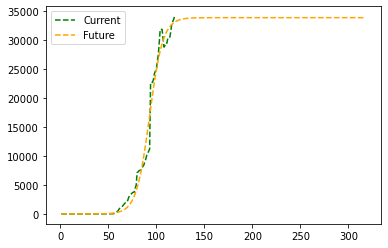

Country Egypt


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


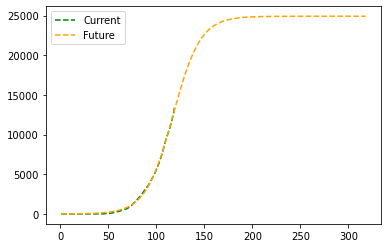

Country El Salvador


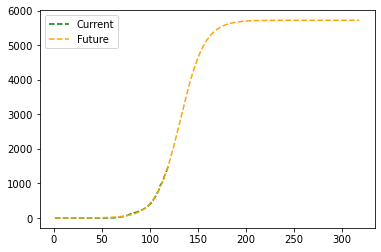

Country Equatorial Guinea


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


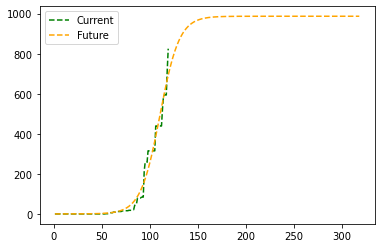

Country Eritrea


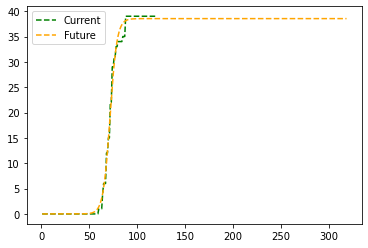

Country Estonia


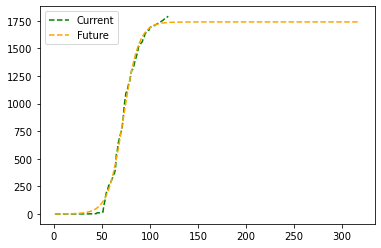

Country Eswatini


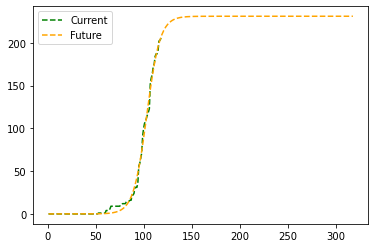

Country Ethiopia


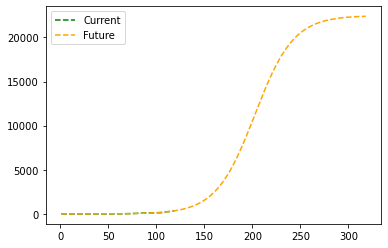

Country Fiji


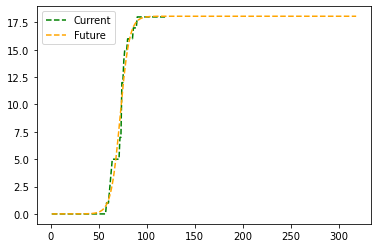

Country Finland


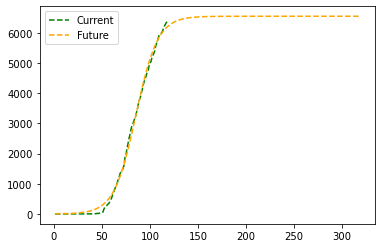

Country France


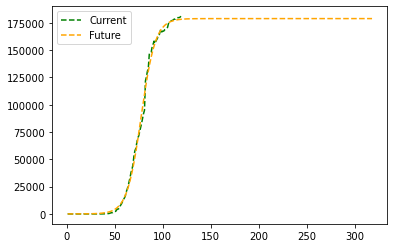

Country Gabon


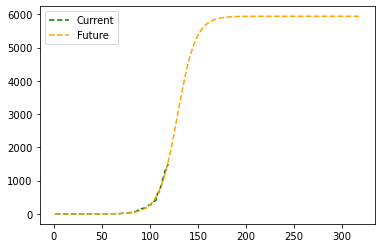

Country Gambia


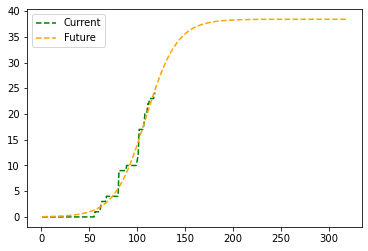

Country Georgia


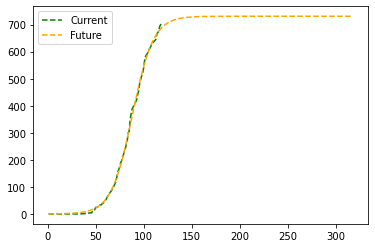

Country Germany


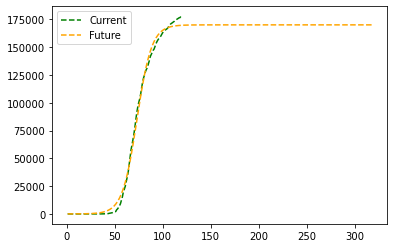

Country Ghana


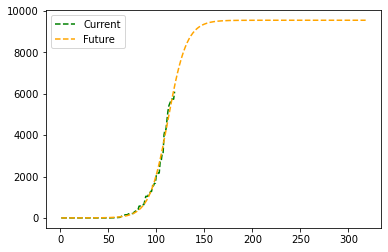

Country Greece


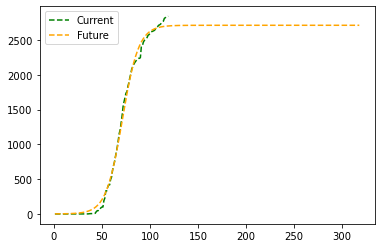

Country Guatemala


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


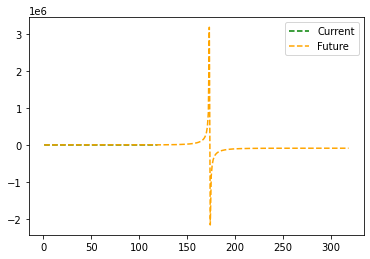

Country Guinea


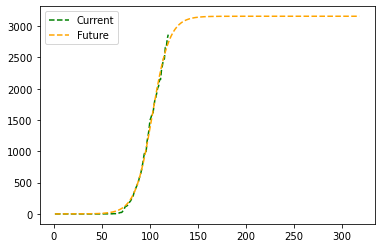

Country Guyana


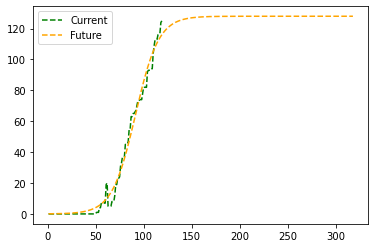

Country Haiti


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


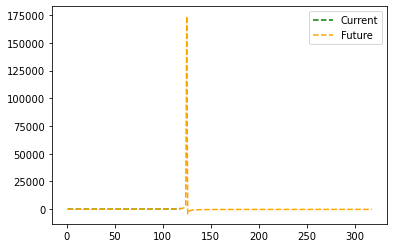

Country Holy See


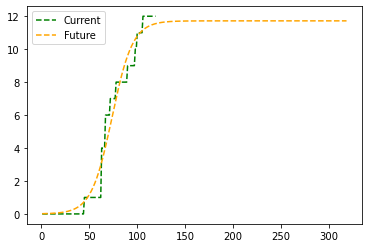

Country Honduras


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


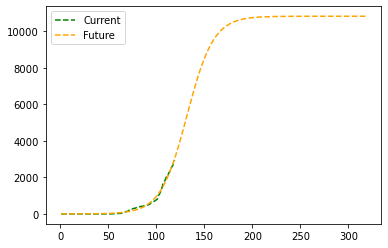

Country Hungary


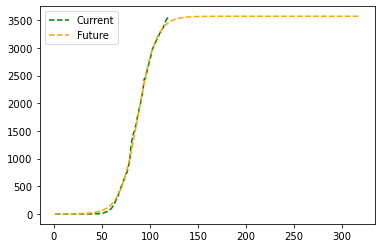

Country Iceland


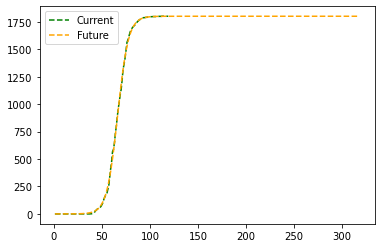

Country India


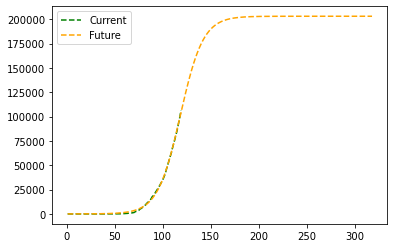

Country Indonesia


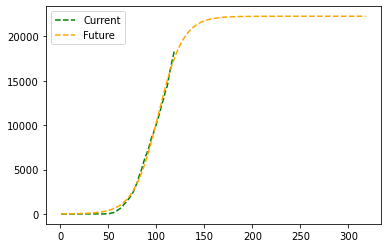

Country Iran


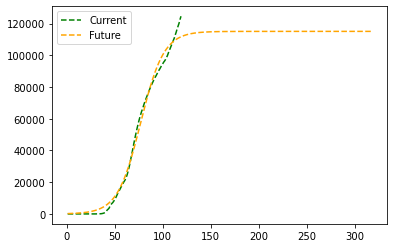

Country Iraq


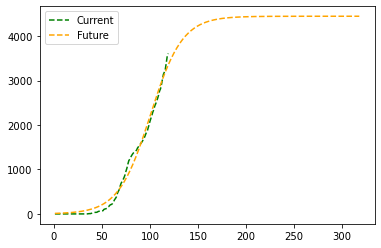

Country Ireland


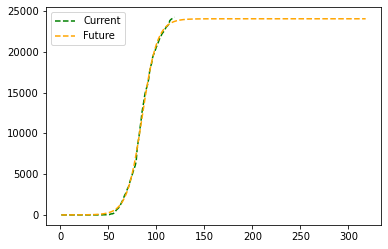

Country Israel


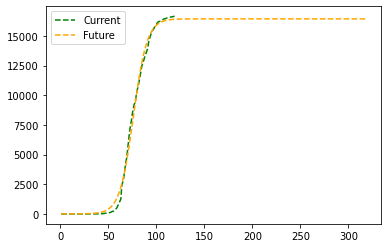

Country Italy


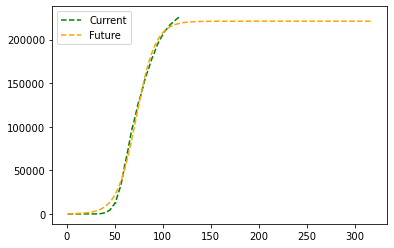

Country Jamaica


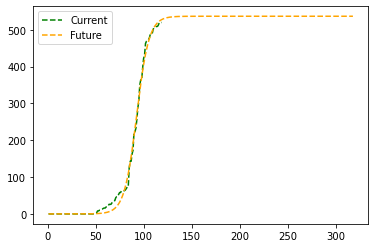

Country Japan


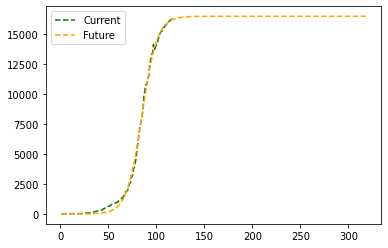

Country Jordan


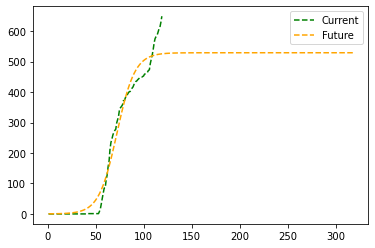

Country Kazakhstan


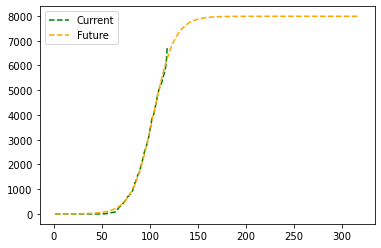

Country Kenya


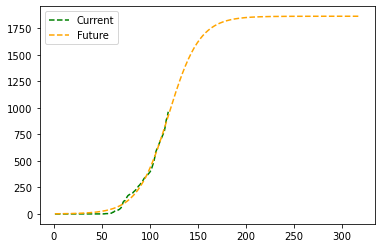

Country Korea, South


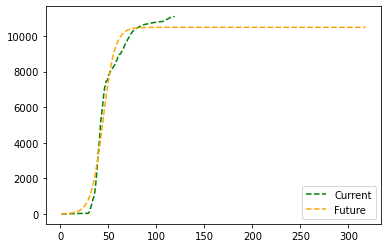

Country Kuwait


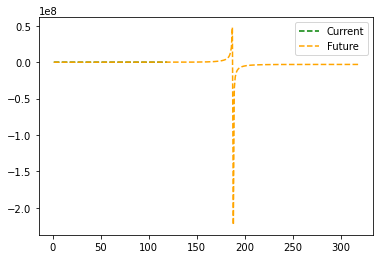

Country Kyrgyzstan


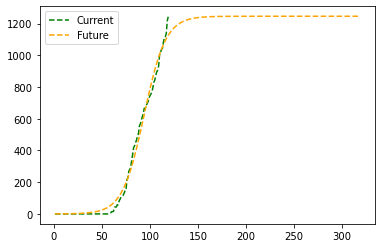

Country Latvia


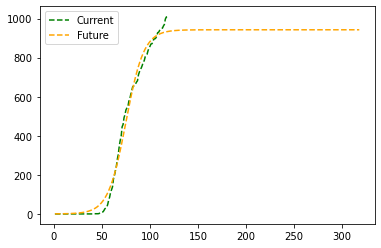

Country Lebanon


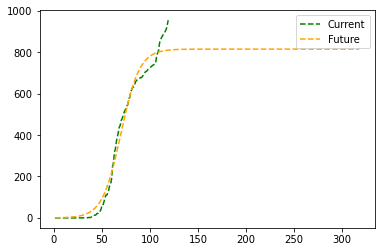

Country Liberia


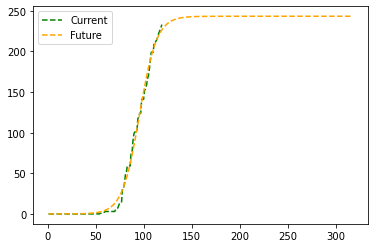

Country Liechtenstein


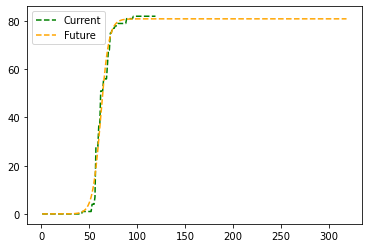

Country Lithuania


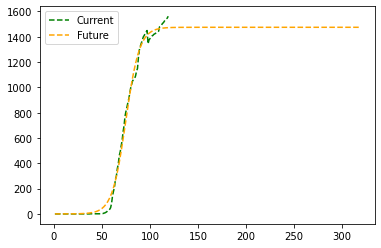

Country Luxembourg


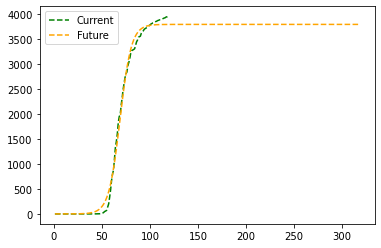

Country Madagascar


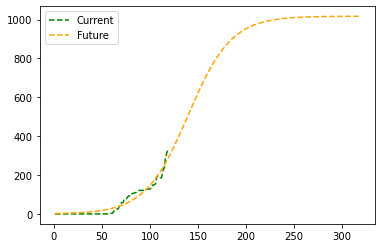

Country Malaysia


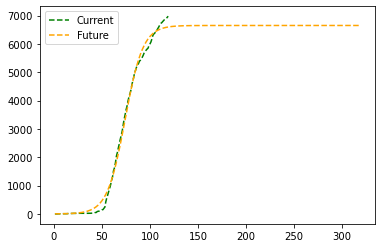

Country Maldives


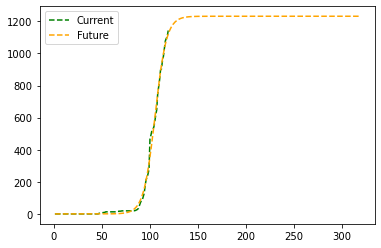

Country Malta


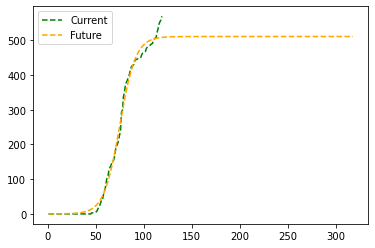

Country Mauritania


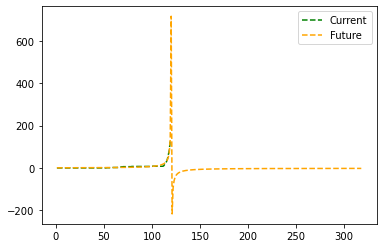

Country Mauritius


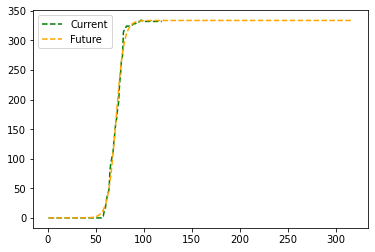

Country Mexico


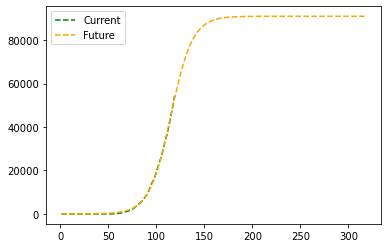

Country Moldova


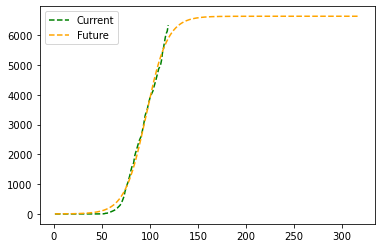

Country Monaco


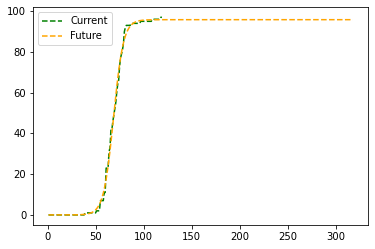

Country Mongolia


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


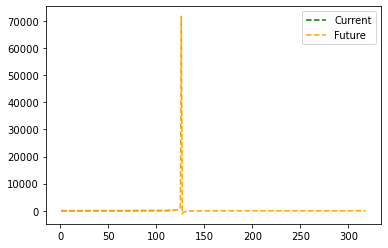

Country Montenegro


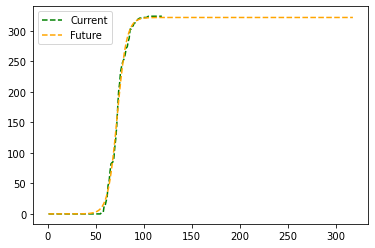

Country Morocco


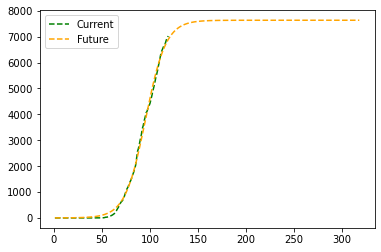

Country Namibia


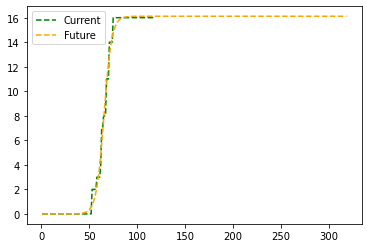

Country Nepal


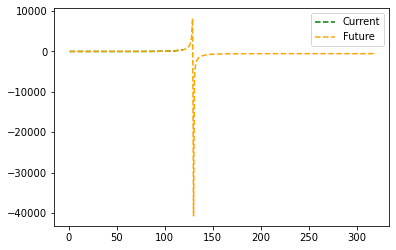

Country Netherlands


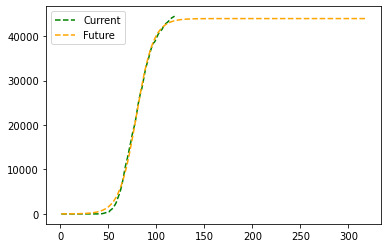

Country New Zealand


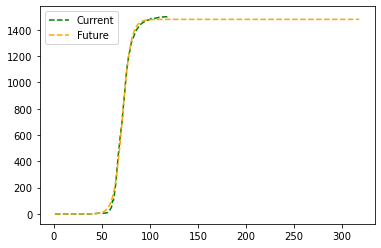

Country Nicaragua


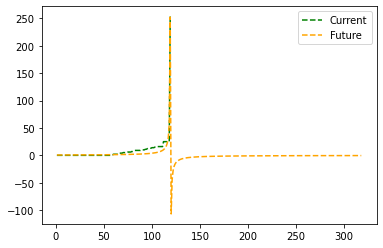

Country Niger


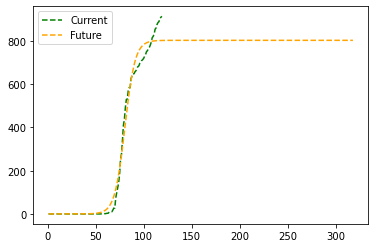

Country Nigeria


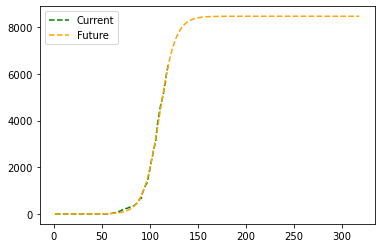

Country North Macedonia


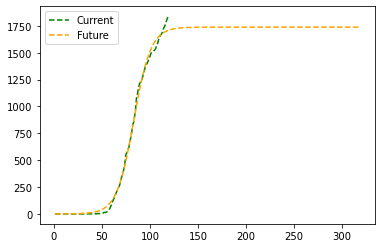

Country Norway


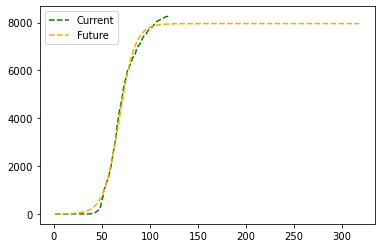

Country Oman


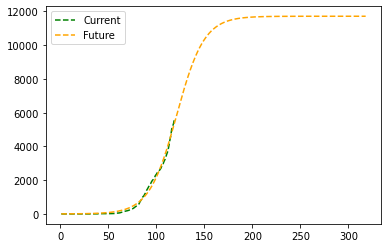

Country Pakistan


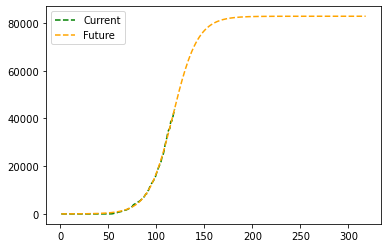

Country Panama


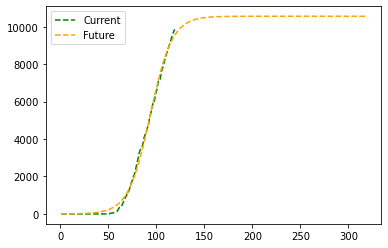

Country Papua New Guinea


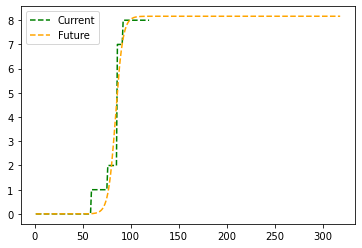

Country Paraguay


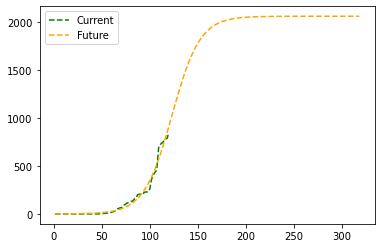

Country Peru


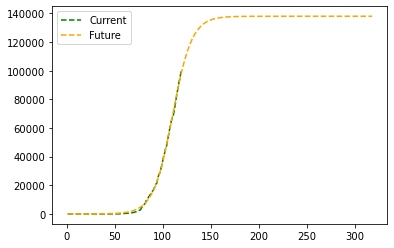

Country Philippines


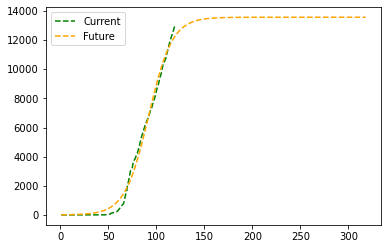

Country Poland


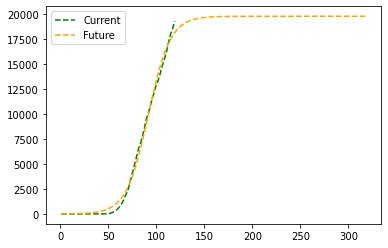

Country Portugal


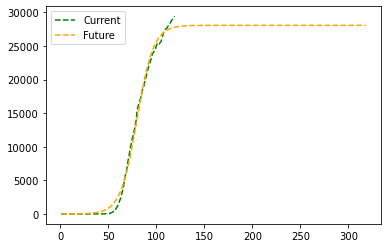

Country Qatar


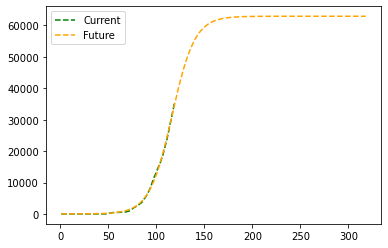

Country Romania


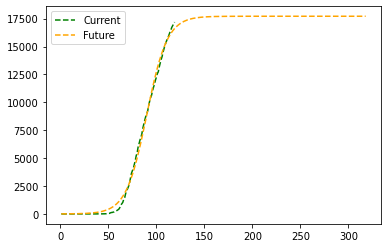

Country Russia


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


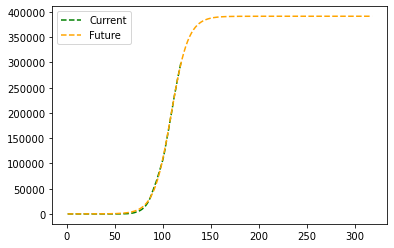

Country Rwanda


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


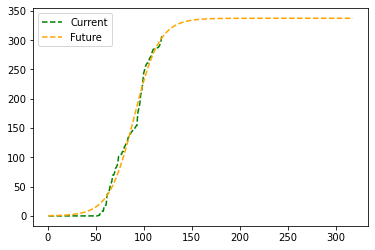

Country Saint Lucia


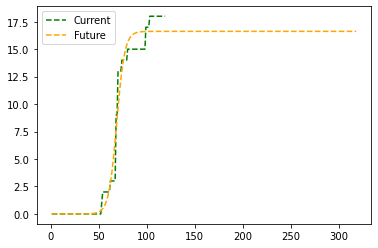

Country Saint Vincent and the Grenadines


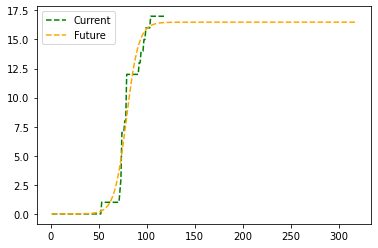

Country San Marino


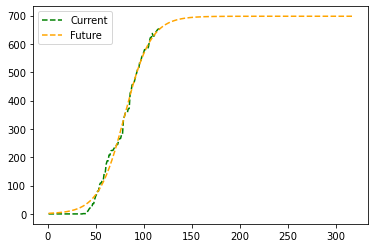

Country Saudi Arabia


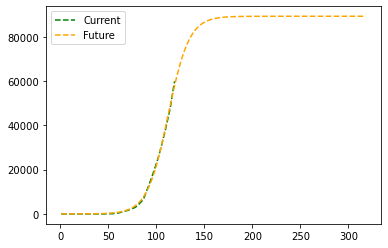

Country Senegal


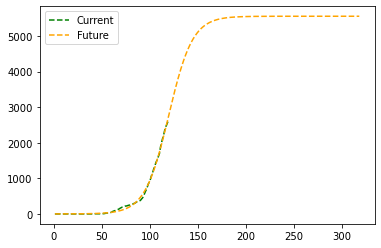

Country Serbia


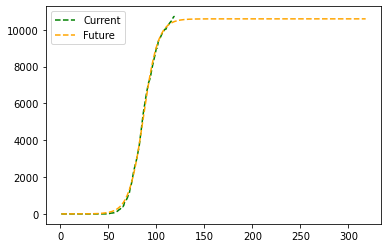

Country Seychelles


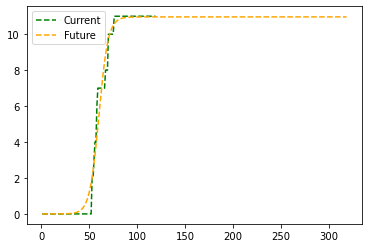

Country Singapore


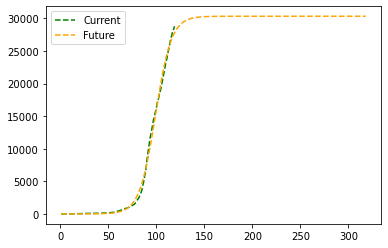

Country Slovakia


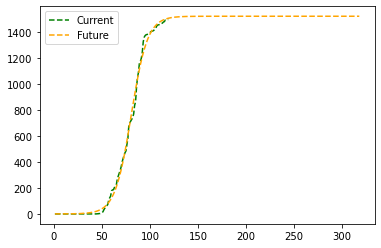

Country Slovenia


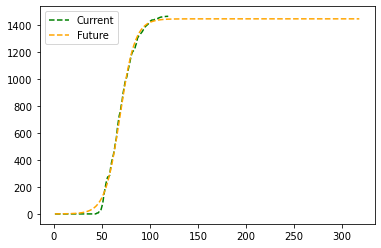

Country Somalia


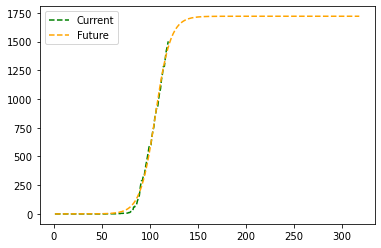

Country South Africa


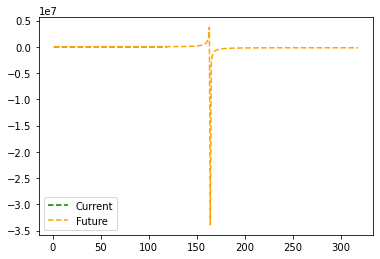

Country Spain


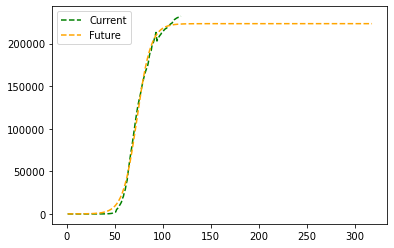

Country Sri Lanka


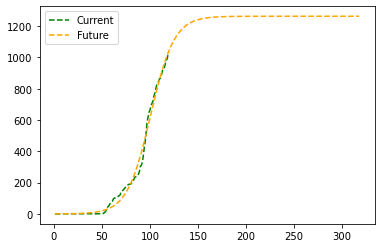

Country Sudan


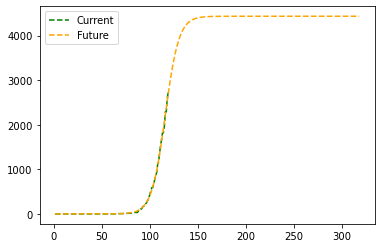

Country Suriname


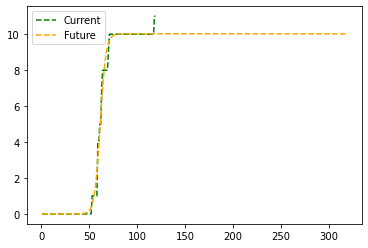

Country Sweden


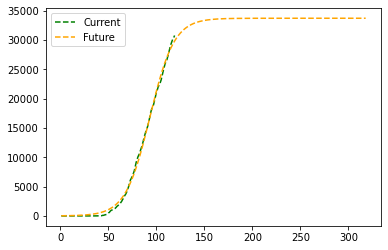

Country Switzerland


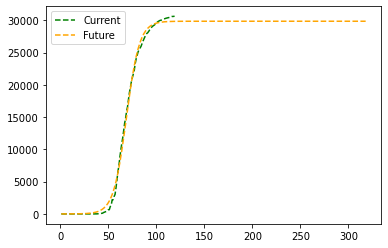

Country Taiwan*


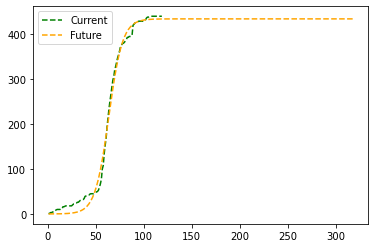

Country Tanzania


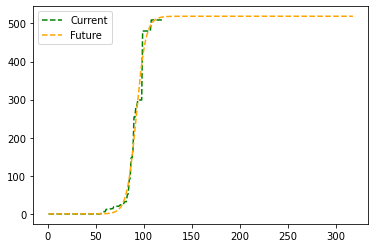

Country Thailand


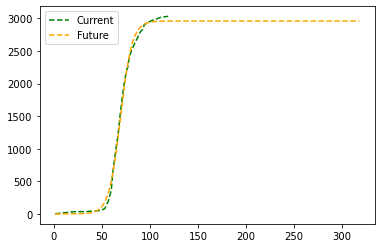

Country Togo


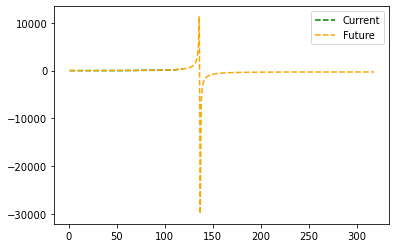

Country Trinidad and Tobago


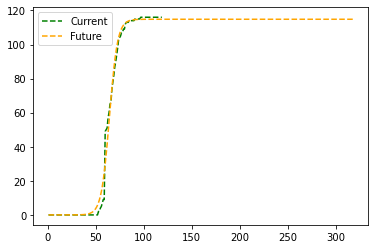

Country Tunisia


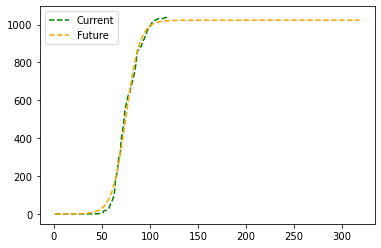

Country Turkey


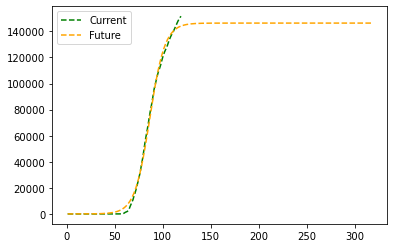

Country Uganda


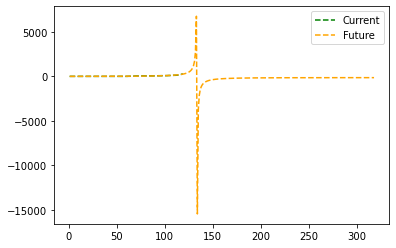

Country Ukraine


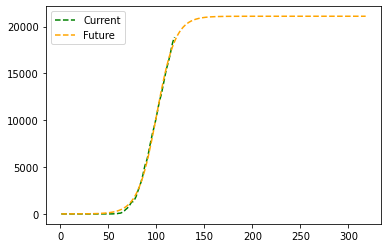

Country United Arab Emirates


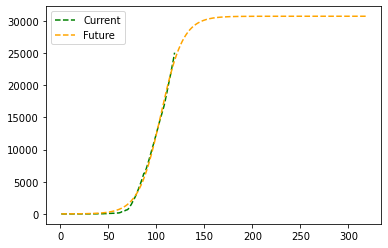

Country United Kingdom


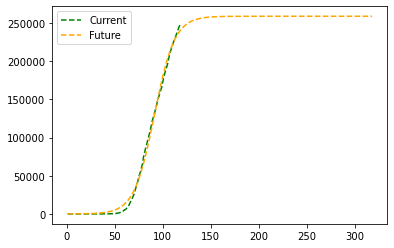

Country Uruguay


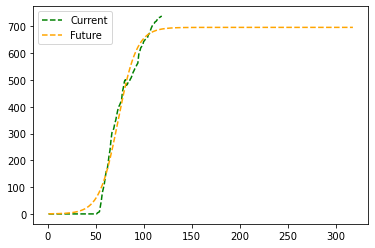

Country US


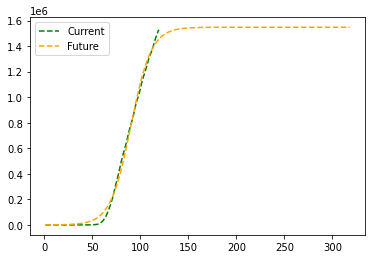

Country Uzbekistan


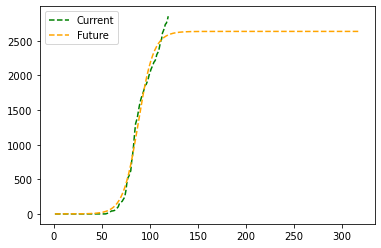

Country Venezuela


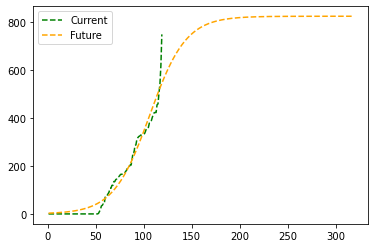

Country Vietnam


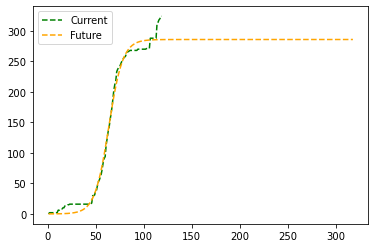

Country Zambia


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


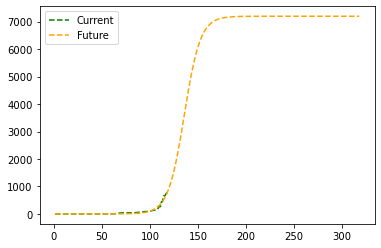

Country Zimbabwe


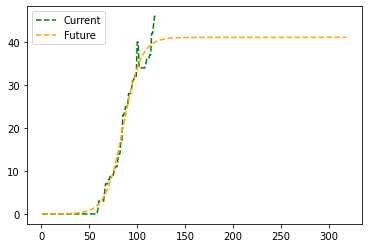

Country Dominica


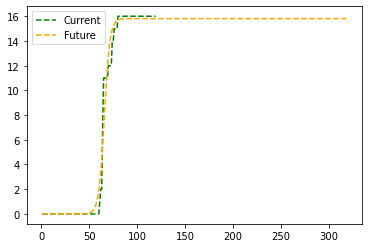

Country Grenada


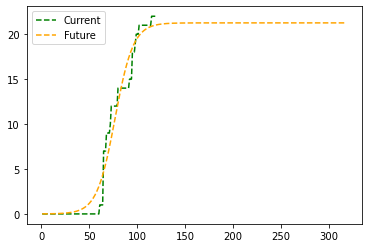

Country Mozambique


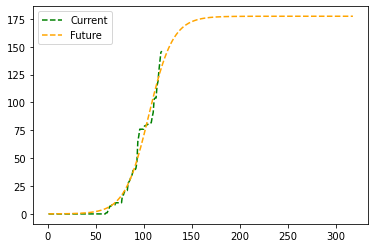

Country Syria


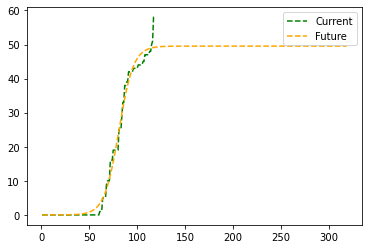

Country Timor-Leste


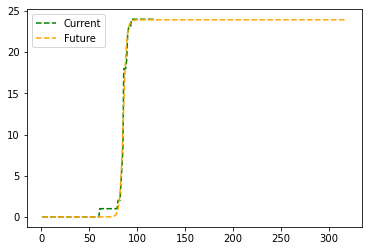

Country Belize


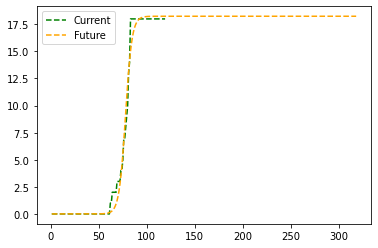

Country Laos


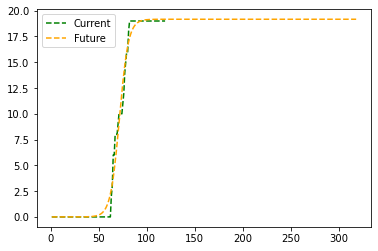

Country Libya


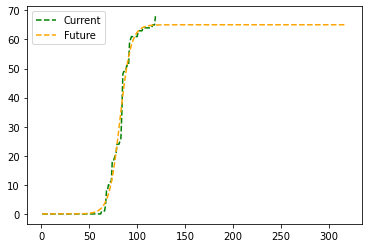

Country West Bank and Gaza


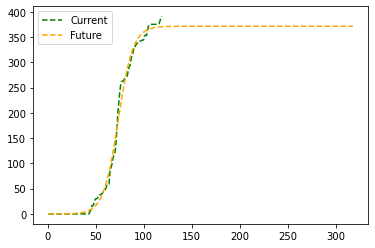

Country Guinea-Bissau


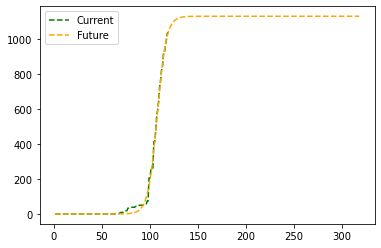

Country Mali


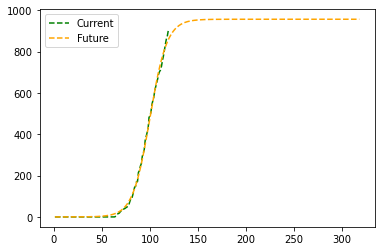

Country Saint Kitts and Nevis


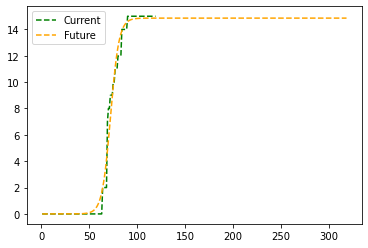

Country Kosovo


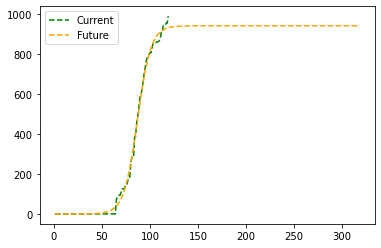

Country Burma


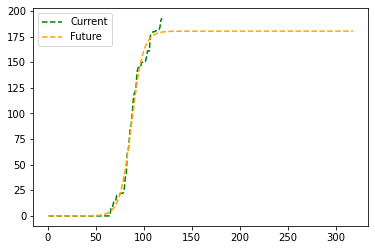

Country MS Zaandam


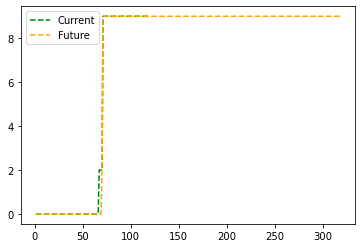

Country Botswana


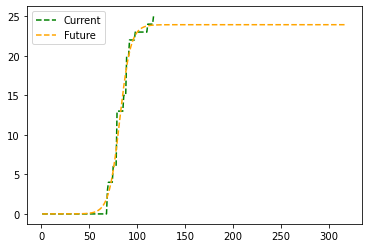

Country Burundi


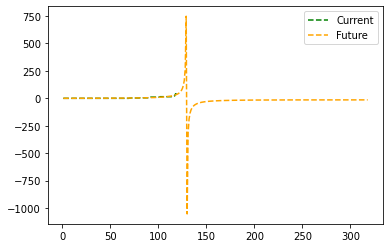

Country Sierra Leone


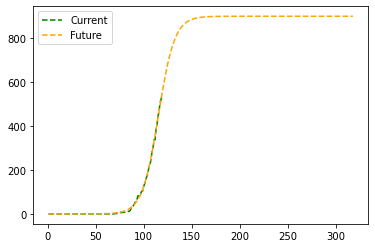

Country Malawi


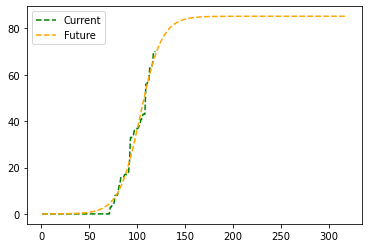

Country South Sudan


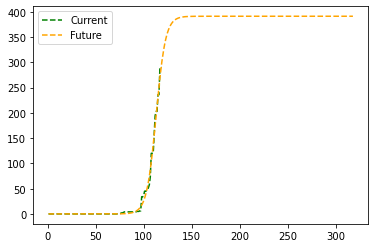

Country Western Sahara


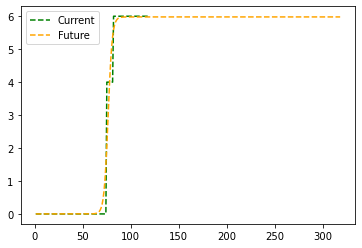

Country Sao Tome and Principe


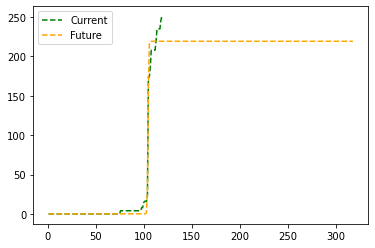

Country Yemen


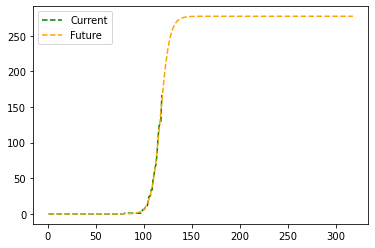

Country Comoros


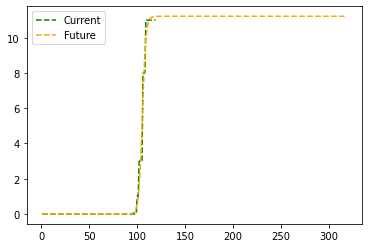

Country Tajikistan


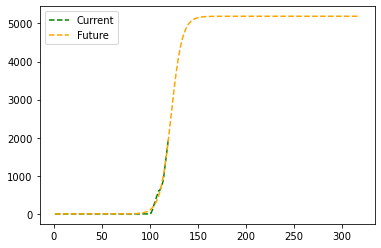

Country Lesotho


c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in exp
  This is separate from the ipykernel package so we can avoid doing imports until
c:\users\супемэн\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in exp
  This is separate from the ipykernel package so we can avoid doing imports until


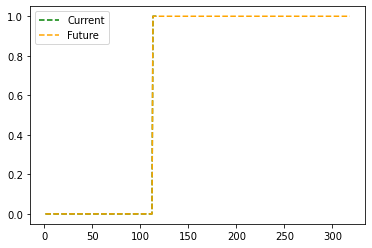

In [26]:
#######№6#######
def fsigm(x, a, b, c, d):
    return a / (b+np.exp(c * (x+d)))
  
def sigm (x_data, y_data):
    popt, pcov = curve_fit(fsigm, x_data, y_data, p0 = (0, 0, 0, 0), maxfev=50000)
    plt.plot(x_data, y_data, '--', color='green', label = "Current")
    plt.plot(np.arange(1, len(x_data)+200), fsigm(np.arange(1, len(y_data)+200), *popt), '--', color='orange',label = "Future")
    
    plt.legend()
    plt.show()

for country in request:
    resC = request[country]
    x = np.linspace(1, len(resC), len(resC))
y = [0 for i in range(len(x))]
for country in request:
    resC = request[country]
    i = 0
    for d in resC:
        if d != 0:
            y[i] += (d['confirmed'])
            i += 1
print("Global")
sigm(x, y)

for country in request:
    resC = request[country]
    x = np.linspace(1, len(resC), len(resC))
    y = []
    for d in resC:
        if d != 0:
            y.append(d['confirmed'])
    print("Country", country)
    sigm(x,y)
    
